# Clustering Project

**Deadline for submission: 17/3/2026 @ 11:59 PM**


Please make sure to explain your work using comments whenever possible.

**Objective:**
The objective of this project is to teach students how to apply clustering to real datasets.

You should be able to answer the following questions and provide reasonable justification for your answers:
* Which clustering approach have you decided to use on each dataset?
* Compare between Kmeans, Hierarchal and DBScan.
* Discuss how you tuned your clustering hyperparameters to achieve the best cluster assignment?
* What is the effect of different distance functions on the calculated clusters?
* How did you evaluate the performance of different clustering techniques on different datatsets?
* Visualize your output where applicable.
* What is the effect of scaling on the performance of clustering techniques?






Running this project requires the following imports:

In [ ]:
#!pip install plotnine

  Obtaining dependency information for plotnine from https://files.pythonhosted.org/packages/d8/79/eb59d10e13b151a514a8af3b1dcefb5e998b6c8c26bf0cf82d2b98f02c23/plotnine-0.15.3-py3-none-any.whl.metadata
  Obtaining dependency information for matplotlib>=3.8.0 from https://files.pythonhosted.org/packages/6f/d3/a4bbc01c237ab710a1f22b4da72f4ff6d77eb4c7735ea9811a94ae239067/matplotlib-3.10.8-cp311-cp311-win_amd64.whl.metadata
     ---------------------------------------- 0.0/52.8 kB ? eta -:--:--
     ----------------------- ---------------- 30.7/52.8 kB 1.3 MB/s eta 0:00:01
     -------------------------------------- 52.8/52.8 kB 687.0 kB/s eta 0:00:00
  Obtaining dependency information for pandas>=2.2.0 from https://files.pythonhosted.org/packages/1f/67/af63f83cd6ca603a00fe8530c10a60f0879265b8be00b5930e8e78c5b30b/pandas-3.0.1-cp311-cp311-win_amd64.whl.metadata
  Obtaining dependency information for mizani~=0.14.0 from https://files.pythonhosted.org/packages/bd/30/b6617c74a8234ff60265373ef7

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
gensim 4.3.0 requires FuzzyTM>=0.4.0, which is not installed.
tables 3.8.0 requires blosc2~=2.0.0, which is not installed.
tables 3.8.0 requires cython>=0.29.21, which is not installed.
numba 0.57.1 requires numpy<1.25,>=1.21, but you have numpy 1.26.4 which is incompatible.


In [1]:
import sys
print(sys.executable)

c:\Users\nayer\anaconda3\python.exe


In [2]:
import sys
import threadpoolctl
print(sys.executable)
print(threadpoolctl.__version__)

c:\Users\nayer\anaconda3\python.exe
3.6.0


In [9]:
import warnings
warnings.filterwarnings('ignore')
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import sklearn.preprocessing as prep
from sklearn.datasets import make_blobs
from plotnine import *
# StandardScaler is a function to normalize the data
# You may also check MinMaxScaler and MaxAbsScaler
#from sklearn.preprocessing import StandardScaler

from sklearn.cluster import DBSCAN


from sklearn.cluster import KMeans

from sklearn.metrics import silhouette_score

%matplotlib inline
# Please refer to the sklearn documentation to learn more about the different parameters for each clustering technique.

In [10]:
# helper function that allows us to display data in 2 dimensions an highlights the clusters
def display_cluster(X,km=[],num_clusters=0):
    color = 'brgcmyk'  #List colors
    alpha = 0.5
    s = 20
    if num_clusters == 0:
        plt.scatter(X[:,0],X[:,1],c = color[0],alpha = alpha,s = s)
    else:
        for i in range(num_clusters):
            plt.scatter(X[km.labels_==i,0],X[km.labels_==i,1],c = color[i],alpha = alpha,s=s)
            plt.scatter(km.cluster_centers_[i][0],km.cluster_centers_[i][1],c = color[i], marker = 'x', s = 100)

## Multi Blob Data Set
* The dataset generated below is known to be best clustered into 6 clusters.
* Cluster the data set below using the three different clustering techniques discussed in the course.
* Visualize your clustering output in each step of your work.



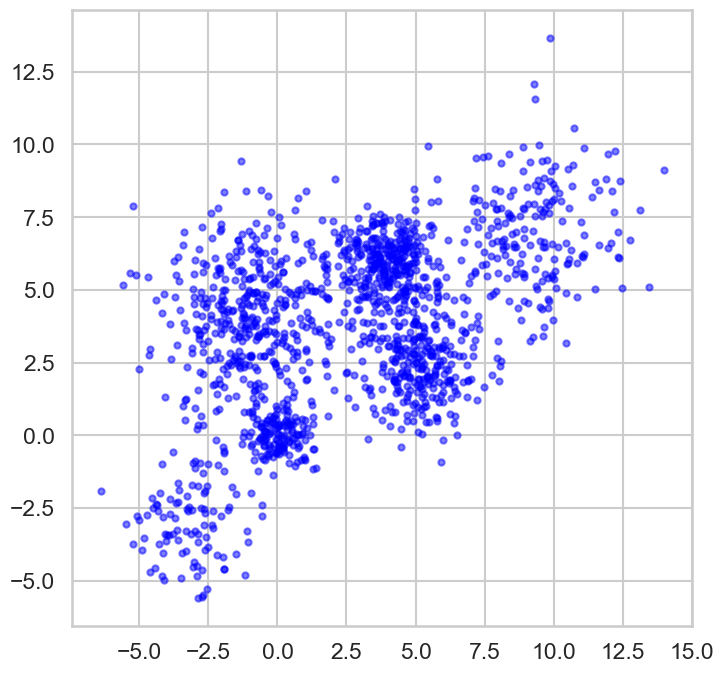

In [11]:
#Data Generation and Visualization
plt.rcParams['figure.figsize'] = [8,8]
sns.set_style("whitegrid")
sns.set_context("talk")

n_bins = 6
centers = [(-3, -3), (0, 0), (5,2.5),(-1, 4), (4, 6), (9,7)]
Multi_blob_Data, y = make_blobs(n_samples=[100,150, 300, 400,300, 200], n_features=2, cluster_std=[1.3,0.6, 1.2, 1.7,0.9,1.7],
                  centers=centers, shuffle=False, random_state=42)
display_cluster(Multi_blob_Data)

### Kmeans
* Use Kmeans with different values of K to cluster the above data.
* Display the outcome of each value of K.
* Plot distortion function versus K and choose the approriate value of K.
* Plot the silhouette_score versus K and use it to choose the best K.
* Store the silhouette_score for the best K for later comparison with other clustering techniques.
* Comment on the effect of centroid initialization on cluster assignment.
* Hint: Lookup k-means++ .

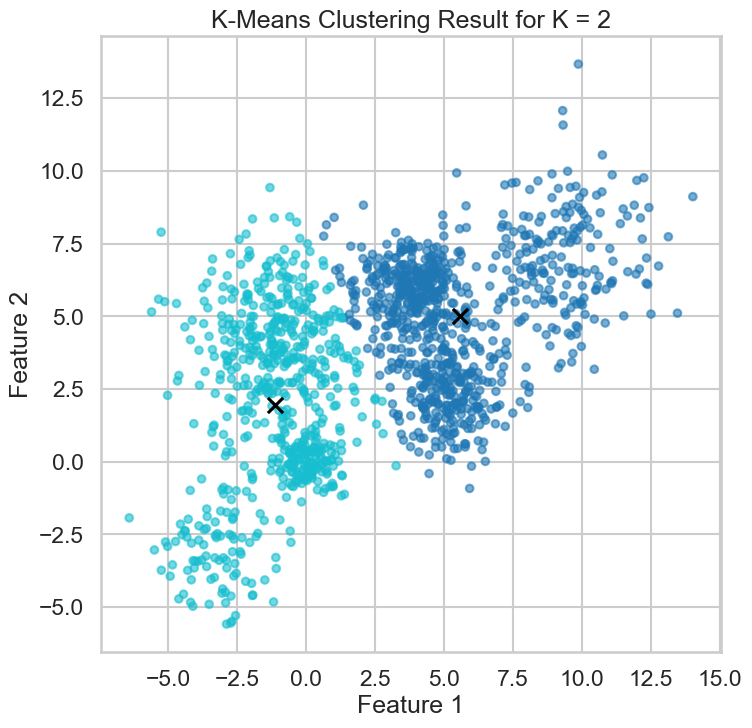

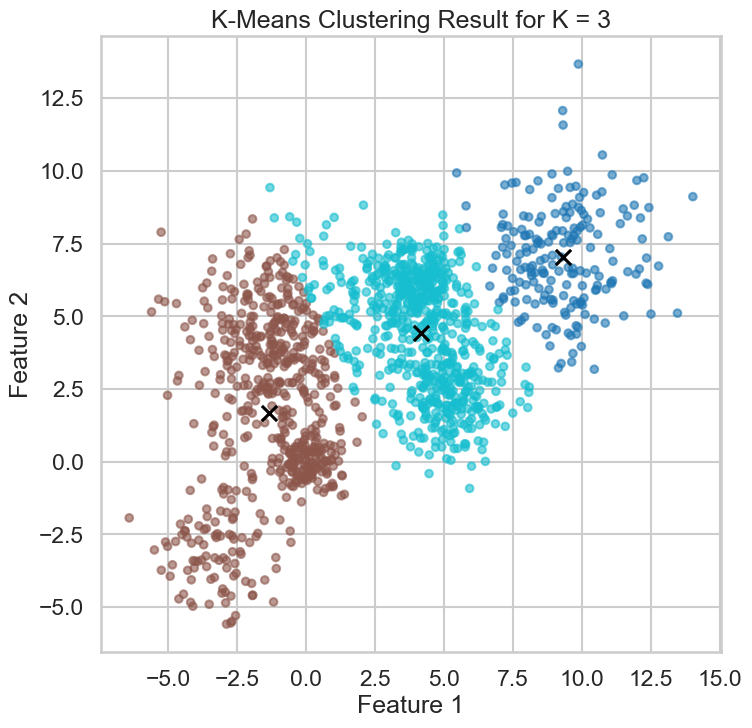

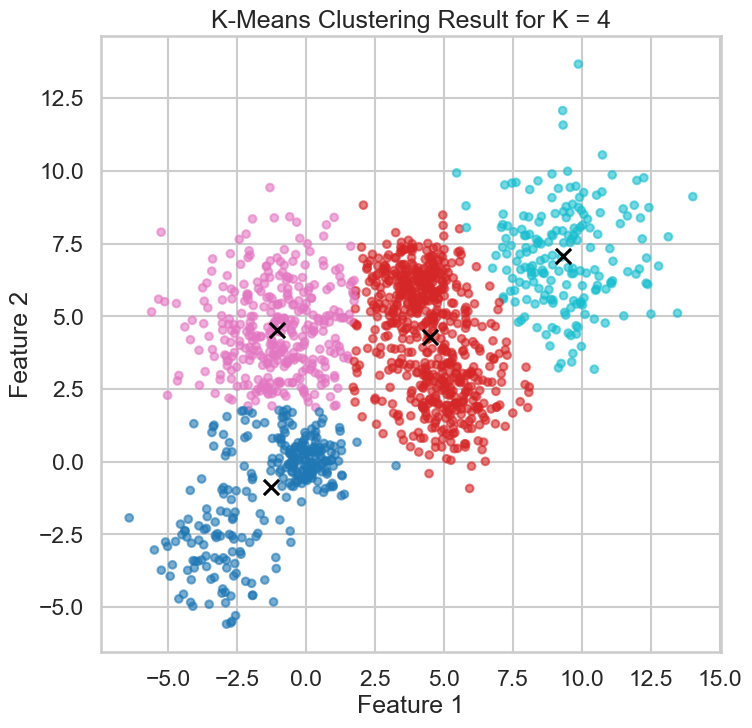

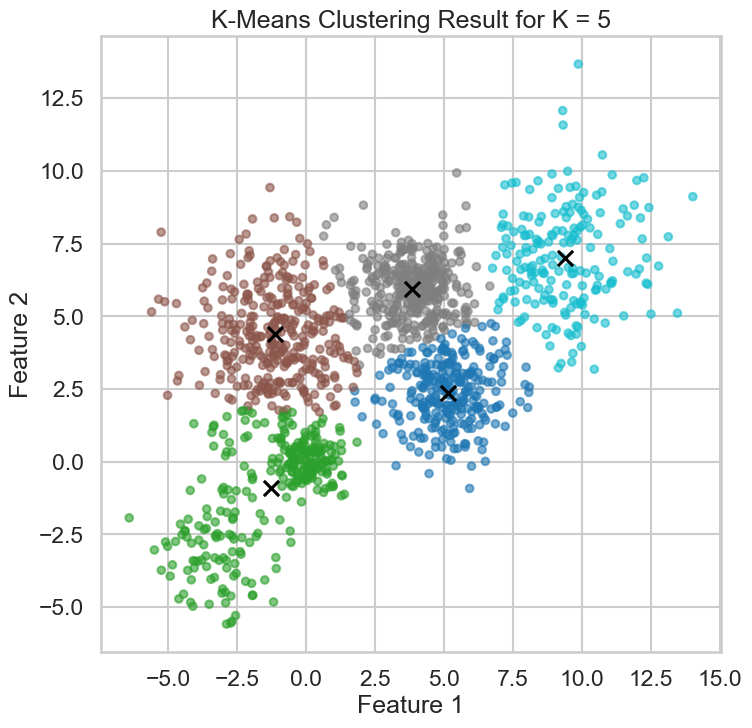

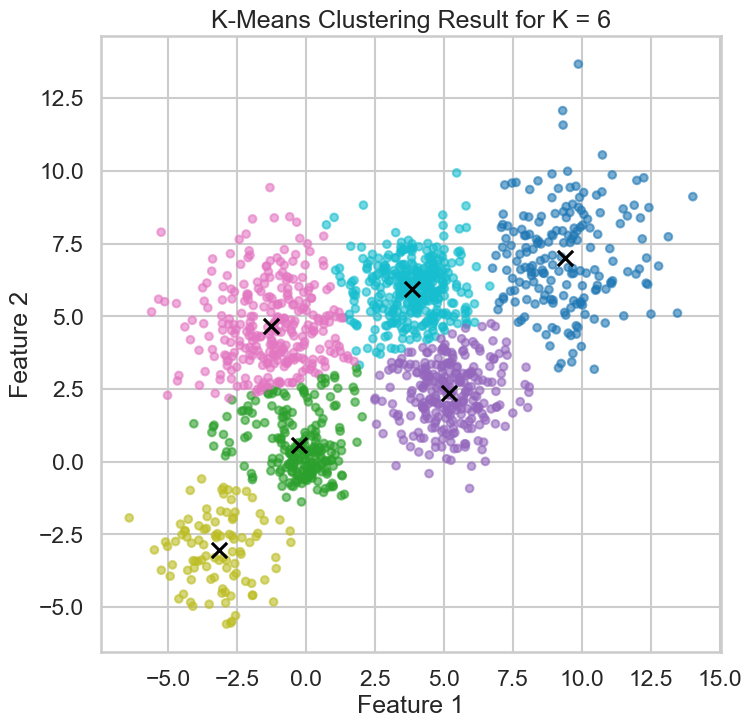

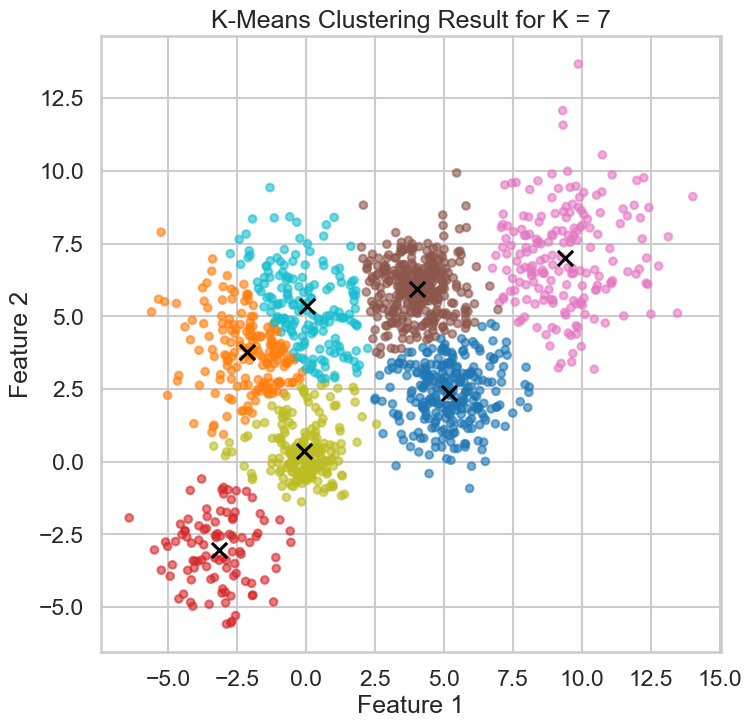

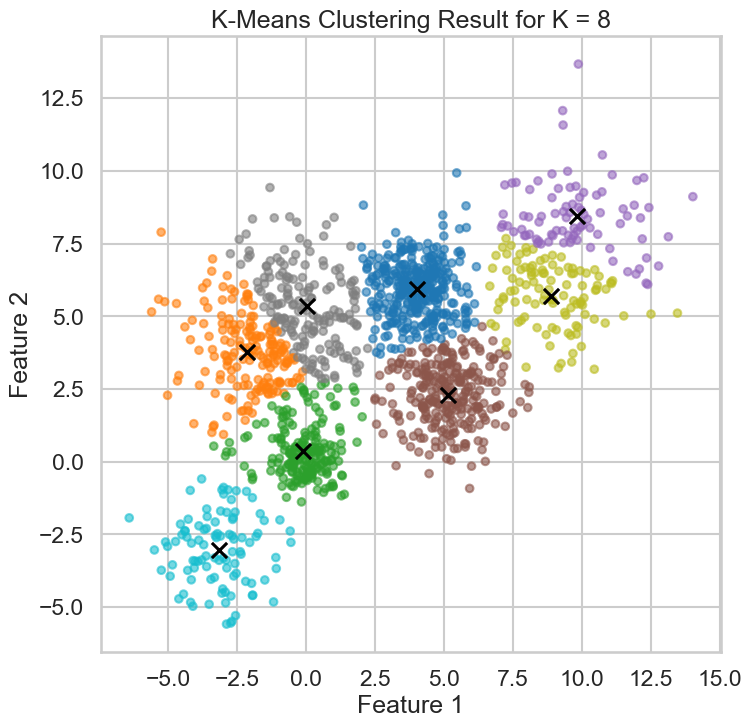

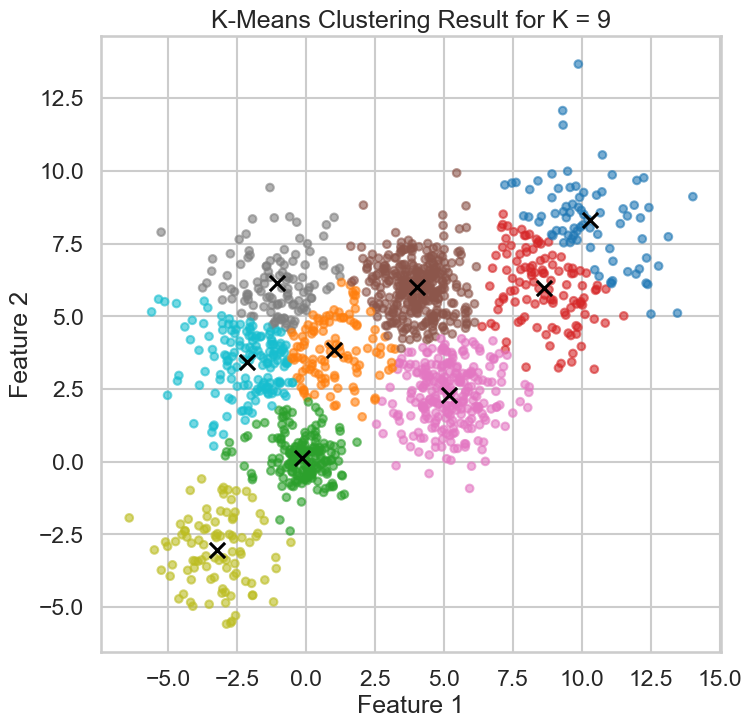

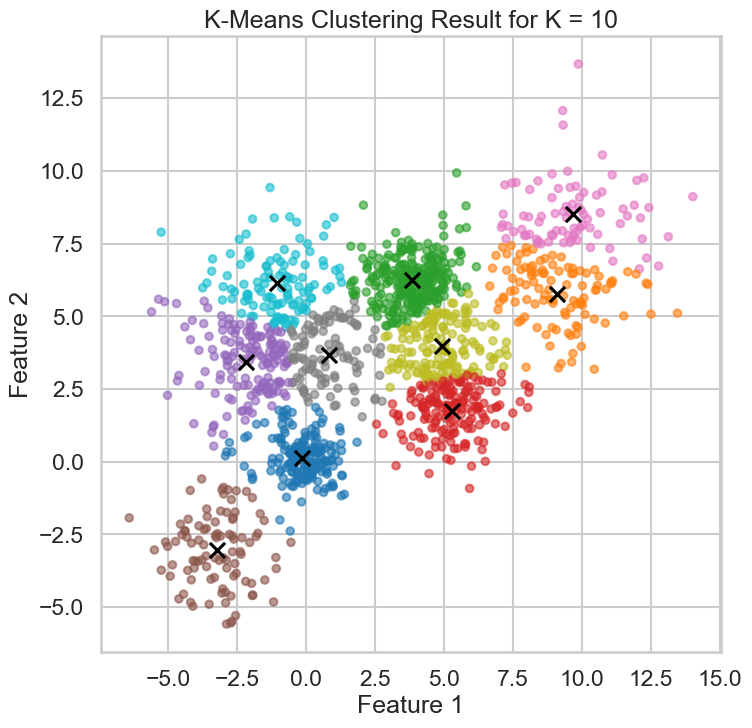

In [ ]:
# =========================================
# Step 2: Try different values of K
# =========================================

K_values = range(2, 11) #2,3,4,..,10

for k in K_values:
    km = KMeans(n_clusters=k, init='k-means++', n_init=10, random_state=42)
    labels = km.fit_predict(Multi_blob_Data) #train
    
    plt.figure(figsize=(8, 8))
    
    plt.scatter(
        Multi_blob_Data[:, 0],
        Multi_blob_Data[:, 1],
        c=labels,
        cmap='tab10',
        alpha=0.6,
        s=30
    )
    
    plt.scatter(
        km.cluster_centers_[:, 0],
        km.cluster_centers_[:, 1],
        c='black',
        marker='x',
        s=120
    )
    
    plt.title(f"K-Means Clustering Result for K = {k}")
    plt.xlabel("Feature 1")
    plt.ylabel("Feature 2")
    plt.show()

In [14]:
# =========================================
# Step 3: Compute distortion / inertia / SSD for each K
# how far the data points are for their cluster center (total squared distance between points and centroid)
# the lower the better (elbow)
# This follows the Elbow Method from Lab_1
# =========================================

distortions = []

for k in K_distortion:
    km = KMeans(n_clusters=k, init='k-means++', n_init=10, random_state=42)
    km.fit(Multi_blob_Data)
    
    # inertia_ = Sum of Squared Distances (SSD)
    distortions.append(km.inertia_)

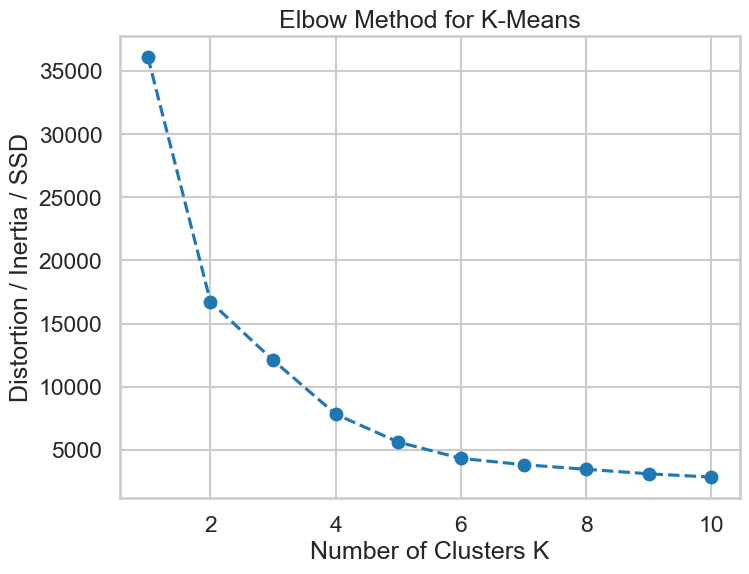

In [15]:
# =========================================
# Step 4: Plot distortion versus K
# We look for the "elbow" point
# =========================================

plt.figure(figsize=(8,6))
plt.plot(K_distortion, distortions, 'o--')
plt.xlabel("Number of Clusters K")
plt.ylabel("Distortion / Inertia / SSD")
plt.title("Elbow Method for K-Means")
plt.grid(True)
plt.show()

In [16]:
# =========================================
# Step 5: Compute silhouette score for each K
# Silhouette score helps measure clustering quality
# =========================================

sil_scores = []

for k in K_values:
    km = KMeans(n_clusters=k, init='k-means++', n_init=10, random_state=42)
    
    # fit_predict both trains the model and returns the cluster labels
    labels = km.fit_predict(Multi_blob_Data)
    
    # Compute the average silhouette score for this K
    score = silhouette_score(Multi_blob_Data, labels)
    sil_scores.append(score)

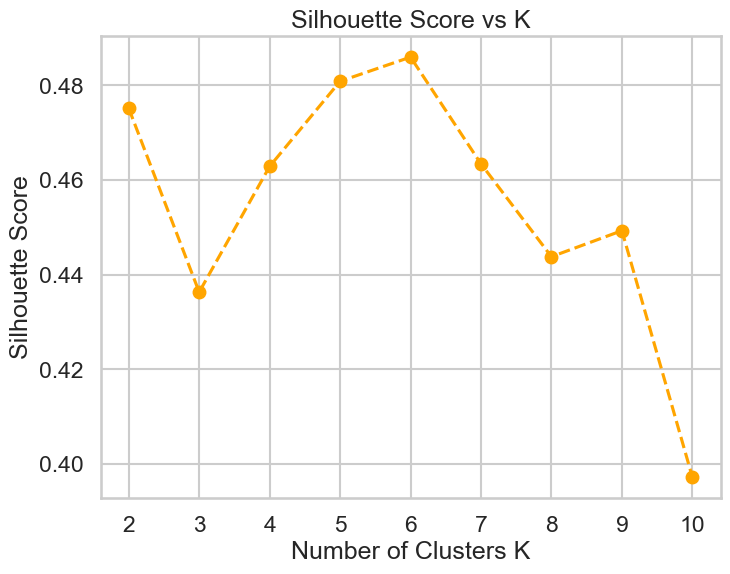

In [17]:
# =========================================
# Step 6: Plot silhouette score versus K
# The best K is usually the one with the highest silhouette score
# =========================================

plt.figure(figsize=(8,6))
plt.plot(list(K_values), sil_scores, 'o--', color='orange')
plt.xlabel("Number of Clusters K")
plt.ylabel("Silhouette Score")
plt.title("Silhouette Score vs K")
plt.grid(True)
plt.show()

data points are mostly separated at K=6

In [18]:
# =========================================
# Step 7: Create a results table
# This makes comparison between different K values easier
# =========================================

results_df = pd.DataFrame({
    "K": list(K_values),
    "Distortion": distortions[1:],   # skip K=1 to align with the silhouette list
    "Silhouette Score": sil_scores
})

print(results_df.to_string(index=False))

 K   Distortion  Silhouette Score
 2 16716.619175          0.475154
 3 12094.797074          0.436318
 4  7812.144063          0.462873
 5  5600.191497          0.480858
 6  4310.296905          0.485974
 7  3811.211822          0.463410
 8  3446.155146          0.443799
 9  3085.882011          0.449296
10  2827.946580          0.397231


### Notes and Observations on K-Means for the First Dataset

- Since **K-Means chooses random centroids** at the beginning of the algorithm, the clustering results may vary between runs.

- **K-Means++** is an improved initialization method that selects initial centroids more intelligently, which helps the algorithm converge faster and produces more stable results.  
  In our experiments, we also fixed the random seed using `random_state = 42` to make the results reproducible.

- **SSD, inertia, and distortion** refer to the same quantity in K-Means.  
  They represent the **sum of the squared distances between each data point and the centroid of the cluster it belongs to**.

- From the **Elbow Method graph**, the decrease in distortion starts to slow down significantly at **K = 6**, indicating that adding more clusters beyond this point provides diminishing improvement.

- The **Silhouette Score** measures how well-separated the clusters are.  
  It ranges between **-1 and 1**:
  - **1** indicates well-separated clusters
  - **0** indicates overlapping clusters
  - **negative values** indicate possible misclassification

- The **highest silhouette score occurs at K = 6**, which confirms that **6 clusters** provide the best clustering structure for this dataset.

### Hierarchal Clustering
* Use AgglomerativeClustering function to  to cluster the above data.
* In the  AgglomerativeClustering change the following parameters:
    * Affinity (use euclidean, manhattan and cosine)
    * Linkage(try different options)
    * Distance_threshold (try different options)
* Plot the dendrograph for one trial.
* For each of these trials, calculate the silhouette_score and display the resulting clusters.  
* Find the set of paramters that would find result in the best silhouette_score and store this score for later comparison with other clustering techniques.
* Record your observation.

some notes:
distance threshold: STOP merging when cluster distance > threshold (euclidean units for example)

In [19]:
#First Trial: Euclidean + ward(minimizes the variance)
from scipy.cluster.hierarchy import dendrogram, linkage

Z = linkage(Multi_blob_Data, method='ward', metric='euclidean')

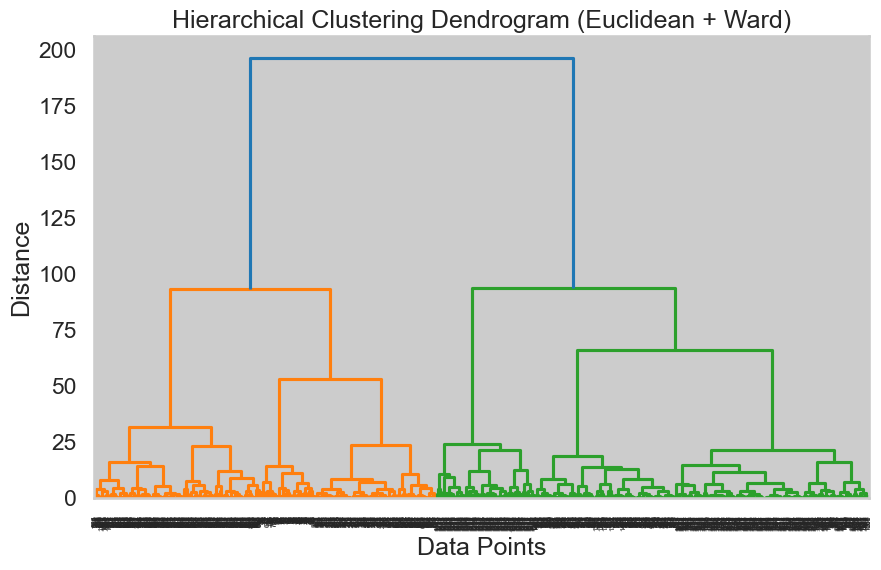

In [20]:
plt.figure(figsize=(10,6))

dendrogram(Z)

plt.title("Hierarchical Clustering Dendrogram (Euclidean + Ward)")
plt.xlabel("Data Points")
plt.ylabel("Distance")

plt.show()

biggest distance at 2 clusters, therefore the dendogram for this trial(1) suggests 2 clusters

In [21]:
#Run agglomorative clustering for 2 clusters trial 1
from sklearn.cluster import AgglomerativeClustering

model = AgglomerativeClustering(
    n_clusters=2,
    metric='euclidean',
    linkage='ward'
)

labels = model.fit_predict(Multi_blob_Data)

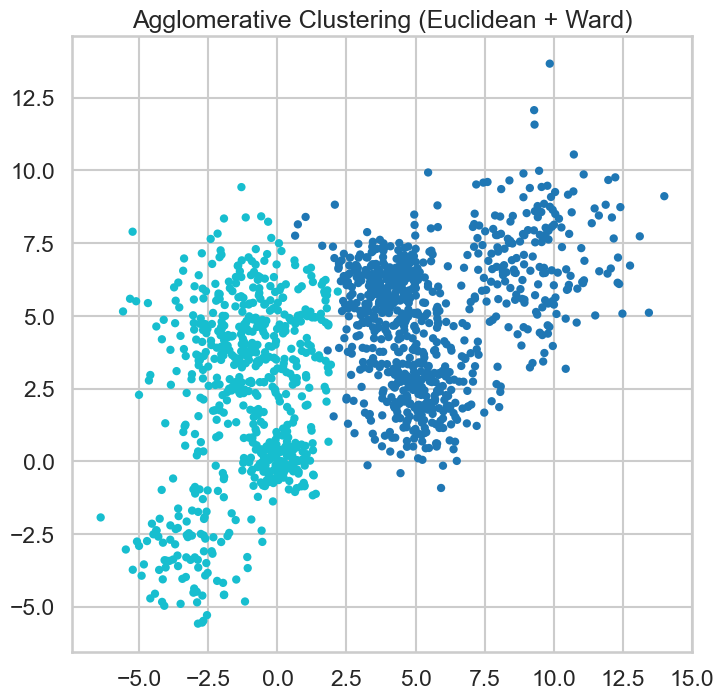

In [22]:
plt.figure(figsize=(8,8))

plt.scatter(
    Multi_blob_Data[:,0],
    Multi_blob_Data[:,1],
    c=labels,
    cmap='tab10',
    s=20
)

plt.title("Agglomerative Clustering (Euclidean + Ward)")
plt.show()

In [23]:
#Run agglomorative clustering for 6 clusters trial 1
from sklearn.cluster import AgglomerativeClustering

model = AgglomerativeClustering(
    n_clusters=6,
    metric='euclidean',
    linkage='ward'
)

labels = model.fit_predict(Multi_blob_Data)

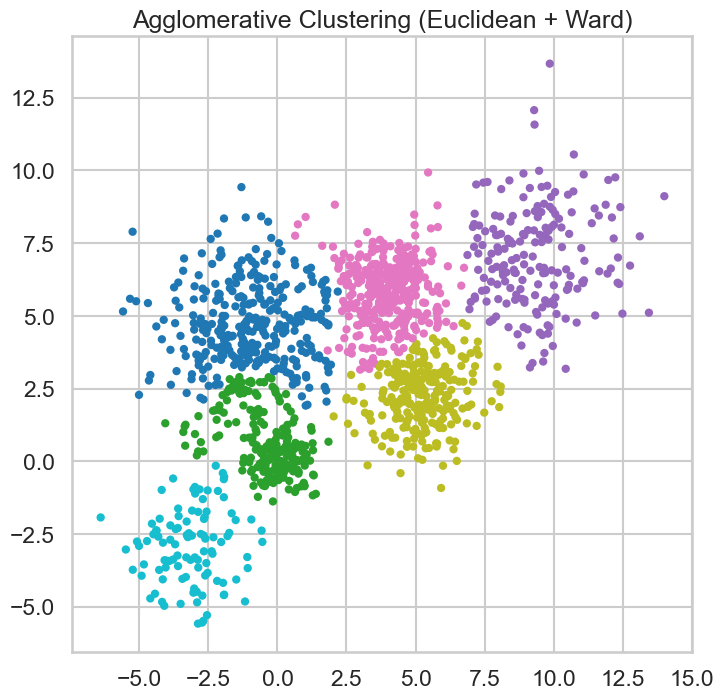

In [24]:
plt.figure(figsize=(8,8))

plt.scatter(
    Multi_blob_Data[:,0],
    Multi_blob_Data[:,1],
    c=labels,
    cmap='tab10',
    s=20
)

plt.title("Agglomerative Clustering (Euclidean + Ward)")
plt.show()

In [25]:
from sklearn.metrics import silhouette_score

score = silhouette_score(Multi_blob_Data, labels)

print("Silhouette Score:", score)

Silhouette Score: 0.4686938472105883


In [26]:
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score
import pandas as pd
import numpy as np

# Selected combinations to keep the experiment clean
trial_combinations = [
    ("euclidean", "ward"),
    ("euclidean", "complete"),
    ("euclidean", "average"),
    ("euclidean", "single"),
    ("manhattan", "complete"),
    ("manhattan", "average"),
    ("cosine", "average")
]

# Distance thresholds to try
thresholds = [50, 80, 100, 120]

hier_results = []
trial_no = 1

for metric, linkage_method in trial_combinations:
    for threshold in thresholds:
        
        model = AgglomerativeClustering(
            n_clusters=None,
            metric=metric,
            linkage=linkage_method,
            distance_threshold=threshold
        )
        
        labels = model.fit_predict(Multi_blob_Data)
        n_clusters_found = len(np.unique(labels))
        
        # Silhouette score is only valid if there is more than 1 cluster
        if n_clusters_found > 1:
            score = silhouette_score(Multi_blob_Data, labels)
        else:
            score = np.nan
        
        hier_results.append({
            "Trial": trial_no,
            "Metric": metric,
            "Linkage": linkage_method,
            "Threshold": threshold,
            "Clusters Found": n_clusters_found,
            "Silhouette": score
        })
        
        trial_no += 1

hier_results_df = pd.DataFrame(hier_results)
print(hier_results_df.to_string(index=False))

 Trial    Metric  Linkage  Threshold  Clusters Found  Silhouette
     1 euclidean     ward         50               6    0.468694
     2 euclidean     ward         80               4    0.444491
     3 euclidean     ward        100               2    0.470213
     4 euclidean     ward        120               2    0.470213
     5 euclidean complete         50               1         NaN
     6 euclidean complete         80               1         NaN
     7 euclidean complete        100               1         NaN
     8 euclidean complete        120               1         NaN
     9 euclidean  average         50               1         NaN
    10 euclidean  average         80               1         NaN
    11 euclidean  average        100               1         NaN
    12 euclidean  average        120               1         NaN
    13 euclidean   single         50               1         NaN
    14 euclidean   single         80               1         NaN
    15 euclidean   single

In [27]:
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score
import pandas as pd
import numpy as np

# Selected combinations to keep the experiment clean
trial_combinations = [
    ("euclidean", "ward"),
    ("manhattan", "complete")
]

# Distance thresholds to try
thresholds = [20, 30, 50, 80, 100, 120]

hier_results = []
trial_no = 1

for metric, linkage_method in trial_combinations:
    for threshold in thresholds:
        
        model = AgglomerativeClustering(
            n_clusters=None,
            metric=metric,
            linkage=linkage_method,
            distance_threshold=threshold
        )
        
        labels = model.fit_predict(Multi_blob_Data)
        n_clusters_found = len(np.unique(labels))
        
        # Silhouette score is only valid if there is more than 1 cluster
        if n_clusters_found > 1:
            score = silhouette_score(Multi_blob_Data, labels)
        else:
            score = np.nan
        
        hier_results.append({
            "Trial": trial_no,
            "Metric": metric,
            "Linkage": linkage_method,
            "Threshold": threshold,
            "Clusters Found": n_clusters_found,
            "Silhouette": score
        })
        
        trial_no += 1

hier_results_df = pd.DataFrame(hier_results)
print(hier_results_df.to_string(index=False))

 Trial    Metric  Linkage  Threshold  Clusters Found  Silhouette
     1 euclidean     ward         20              12    0.351484
     2 euclidean     ward         30               7    0.445005
     3 euclidean     ward         50               6    0.468694
     4 euclidean     ward         80               4    0.444491
     5 euclidean     ward        100               2    0.470213
     6 euclidean     ward        120               2    0.470213
     7 manhattan complete         20               3    0.422320
     8 manhattan complete         30               2    0.472376
     9 manhattan complete         50               1         NaN
    10 manhattan complete         80               1         NaN
    11 manhattan complete        100               1         NaN
    12 manhattan complete        120               1         NaN


### Notes and Observations on Hierarchical Clustering

- Specifying a **distance_threshold** is equivalent to drawing a **horizontal cut across the dendrogram**.  
  Cluster merges are allowed **below this line**, while merges **above the line are prevented**.

- As the **distance_threshold increases**, more merges are allowed, which results in **fewer final clusters**.  
  Conversely, a **smaller distance_threshold produces more clusters**.

- The **silhouette score results** indicate that the combination  
  **(metric = manhattan, linkage = complete, distance_threshold = 30)** produced the **highest clustering quality** among the tested configurations.

- The configuration **(metric = euclidean, linkage = ward, distance_threshold = 30)** also produced a **good silhouette score**, indicating reasonably well-separated clusters.

- When comparing clustering techniques, **K-Means produced a higher silhouette score than Agglomerative Clustering for the first dataset**, suggesting that K-Means is more suitable for this dataset.

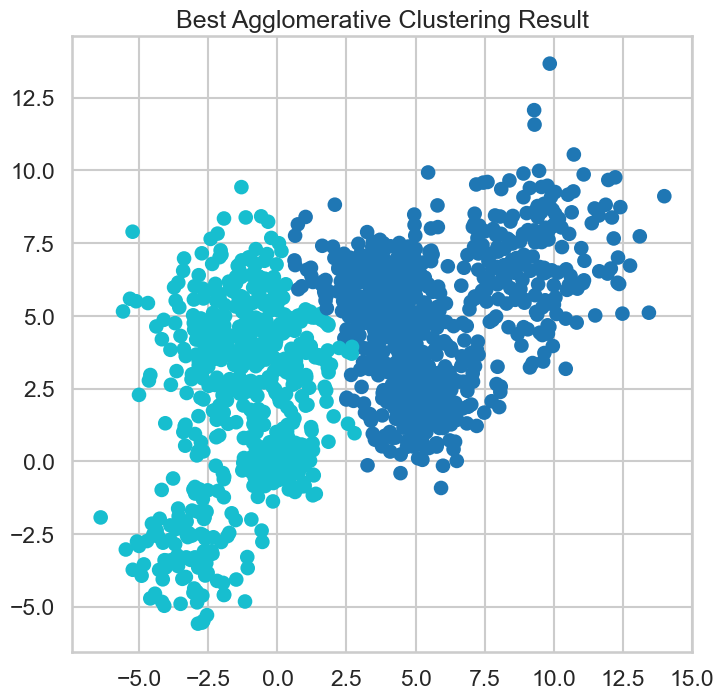

In [28]:
best_model = AgglomerativeClustering(
    n_clusters=None,
    metric="manhattan",
    linkage="complete",
    distance_threshold=30
)

labels = best_model.fit_predict(Multi_blob_Data)

plt.figure(figsize=(8,8))
plt.scatter(Multi_blob_Data[:,0], Multi_blob_Data[:,1], c=labels, cmap="tab10")
plt.title("Best Agglomerative Clustering Result")
plt.show()

### DBScan
* Use DBScan function to  to cluster the above data.
* In the  DBscan change the following parameters:
    * EPS (from 0.1 to 3)
    * Min_samples (from 5 to 25)

* Plot the silhouette_score versus the variation in the EPS and the min_samples.
* Plot the resulting Clusters in this case.
* Find the set of paramters that would find result in the best silhouette_score and store this score for later comparison with other clustering techniques.
* Record your observations and comments.

In [29]:
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score
import pandas as pd
import numpy as np

In [30]:
eps_values = [0.1,0.3,0.5,0.7,1.0,1.5,2.0,2.5,3.0]
min_samples_values = [5,10,15,20,25]

In [31]:
dbscan_results = []

for eps in eps_values:
    for min_samples in min_samples_values:

        model = DBSCAN(eps=eps, min_samples=min_samples)

        labels = model.fit_predict(Multi_blob_Data)

        # Count clusters (excluding noise)
        n_clusters = len(set(labels)) - (1 if -1 in labels else 0)

        # Silhouette requires at least 2 clusters
        if n_clusters > 1:
            score = silhouette_score(Multi_blob_Data, labels)
        else:
            score = np.nan

        dbscan_results.append({
            "eps": eps,
            "min_samples": min_samples,
            "clusters": n_clusters,
            "silhouette": score
        })

In [32]:
dbscan_results_df = pd.DataFrame(dbscan_results)

print(dbscan_results_df)

    eps  min_samples  clusters  silhouette
0   0.1            5        11   -0.542335
1   0.1           10         0         NaN
2   0.1           15         0         NaN
3   0.1           20         0         NaN
4   0.1           25         0         NaN
5   0.3            5        37   -0.137894
6   0.3           10        11   -0.310506
7   0.3           15         2   -0.205837
8   0.3           20         3   -0.377049
9   0.3           25         0         NaN
10  0.5            5        10   -0.073182
11  0.5           10         6    0.142048
12  0.5           15         4    0.028097
13  0.5           20         5   -0.013564
14  0.5           25         4   -0.133457
15  0.7            5         2    0.229521
16  0.7           10         3    0.213134
17  0.7           15         4    0.064362
18  0.7           20         4    0.128808
19  0.7           25         3    0.166107
20  1.0            5         1         NaN
21  1.0           10         1         NaN
22  1.0    

In [33]:
eps_values = [0.1,0.7,1.0,1.5,2.0,2.5,3.0]
min_samples_values = [5,10,15,20,25]

In [34]:
dbscan_results = []

for eps in eps_values:
    for min_samples in min_samples_values:

        model = DBSCAN(eps=eps, min_samples=min_samples)

        labels = model.fit_predict(Multi_blob_Data)

        # Count clusters (excluding noise)
        n_clusters = len(set(labels)) - (1 if -1 in labels else 0)

        # Silhouette requires at least 2 clusters
        if n_clusters > 1:
            score = silhouette_score(Multi_blob_Data, labels)
        else:
            score = np.nan

        dbscan_results.append({
            "eps": eps,
            "min_samples": min_samples,
            "clusters": n_clusters,
            "silhouette": score
        })

In [35]:
dbscan_results_df = pd.DataFrame(dbscan_results)

print(dbscan_results_df)

    eps  min_samples  clusters  silhouette
0   0.1            5        11   -0.542335
1   0.1           10         0         NaN
2   0.1           15         0         NaN
3   0.1           20         0         NaN
4   0.1           25         0         NaN
5   0.7            5         2    0.229521
6   0.7           10         3    0.213134
7   0.7           15         4    0.064362
8   0.7           20         4    0.128808
9   0.7           25         3    0.166107
10  1.0            5         1         NaN
11  1.0           10         1         NaN
12  1.0           15         2    0.271862
13  1.0           20         3    0.234533
14  1.0           25         3    0.197428
15  1.5            5         1         NaN
16  1.5           10         1         NaN
17  1.5           15         1         NaN
18  1.5           20         1         NaN
19  1.5           25         1         NaN
20  2.0            5         1         NaN
21  2.0           10         1         NaN
22  2.0    

In [36]:
eps_values = [0.1,0.7,1.0,3.0]
min_samples_values = [5,10,15,20,25]

In [37]:
dbscan_results = []

for eps in eps_values:
    for min_samples in min_samples_values:

        model = DBSCAN(eps=eps, min_samples=min_samples)

        labels = model.fit_predict(Multi_blob_Data)

        # Count clusters (excluding noise)
        n_clusters = len(set(labels)) - (1 if -1 in labels else 0)

        # Silhouette requires at least 2 clusters
        if n_clusters > 1:
            score = silhouette_score(Multi_blob_Data, labels)
        else:
            score = np.nan

        dbscan_results.append({
            "eps": eps,
            "min_samples": min_samples,
            "clusters": n_clusters,
            "silhouette": score
        })

        

In [38]:
dbscan_results_df = pd.DataFrame(dbscan_results)

print(dbscan_results_df)

    eps  min_samples  clusters  silhouette
0   0.1            5        11   -0.542335
1   0.1           10         0         NaN
2   0.1           15         0         NaN
3   0.1           20         0         NaN
4   0.1           25         0         NaN
5   0.7            5         2    0.229521
6   0.7           10         3    0.213134
7   0.7           15         4    0.064362
8   0.7           20         4    0.128808
9   0.7           25         3    0.166107
10  1.0            5         1         NaN
11  1.0           10         1         NaN
12  1.0           15         2    0.271862
13  1.0           20         3    0.234533
14  1.0           25         3    0.197428
15  3.0            5         1         NaN
16  3.0           10         1         NaN
17  3.0           15         1         NaN
18  3.0           20         1         NaN
19  3.0           25         1         NaN


In [39]:
eps_values = [0.7,0.8,0.9,1.0]
min_samples_values = [5,10,15,20,25]

In [40]:
dbscan_results = []

for eps in eps_values:
    for min_samples in min_samples_values:

        model = DBSCAN(eps=eps, min_samples=min_samples) #create the model

        labels = model.fit_predict(Multi_blob_Data) #train model(run the algorithm and return labels for each point)

        # Count clusters (excluding noise)
        n_clusters = len(set(labels)) - (1 if -1 in labels else 0)

        # Silhouette requires at least 2 clusters
        if n_clusters > 1:
            score = silhouette_score(Multi_blob_Data, labels)
        else:
            score = np.nan

        dbscan_results.append({
            "eps": eps,
            "min_samples": min_samples,
            "clusters": n_clusters,
            "silhouette": score
        })

        

In [41]:
dbscan_results_df = pd.DataFrame(dbscan_results)

print(dbscan_results_df)

    eps  min_samples  clusters  silhouette
0   0.7            5         2    0.229521
1   0.7           10         3    0.213134
2   0.7           15         4    0.064362
3   0.7           20         4    0.128808
4   0.7           25         3    0.166107
5   0.8            5         2    0.245261
6   0.8           10         3    0.249801
7   0.8           15         3    0.207084
8   0.8           20         3    0.144715
9   0.8           25         4    0.164208
10  0.9            5         1         NaN
11  0.9           10         2    0.283825
12  0.9           15         3    0.241779
13  0.9           20         3    0.197535
14  0.9           25         3    0.120352
15  1.0            5         1         NaN
16  1.0           10         1         NaN
17  1.0           15         2    0.271862
18  1.0           20         3    0.234533
19  1.0           25         3    0.197428


best at eps=0.9, min_smaples=10, 2 clusters and noise

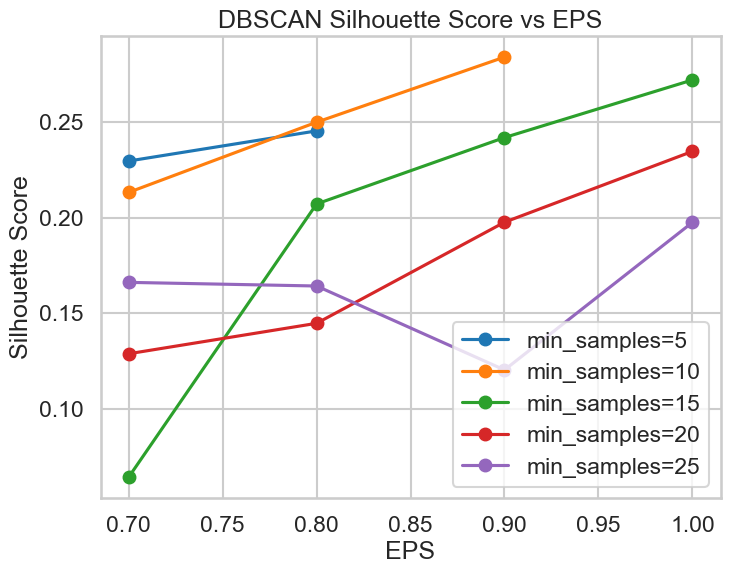

In [42]:
plt.figure(figsize=(8,6))

for m in min_samples_values:

    subset = dbscan_results_df[dbscan_results_df["min_samples"] == m]

    plt.plot(
        subset["eps"],
        subset["silhouette"],
        marker="o",
        label=f"min_samples={m}"
    )

plt.xlabel("EPS")
plt.ylabel("Silhouette Score")
plt.title("DBSCAN Silhouette Score vs EPS")
plt.legend()
plt.grid(True)

plt.show()

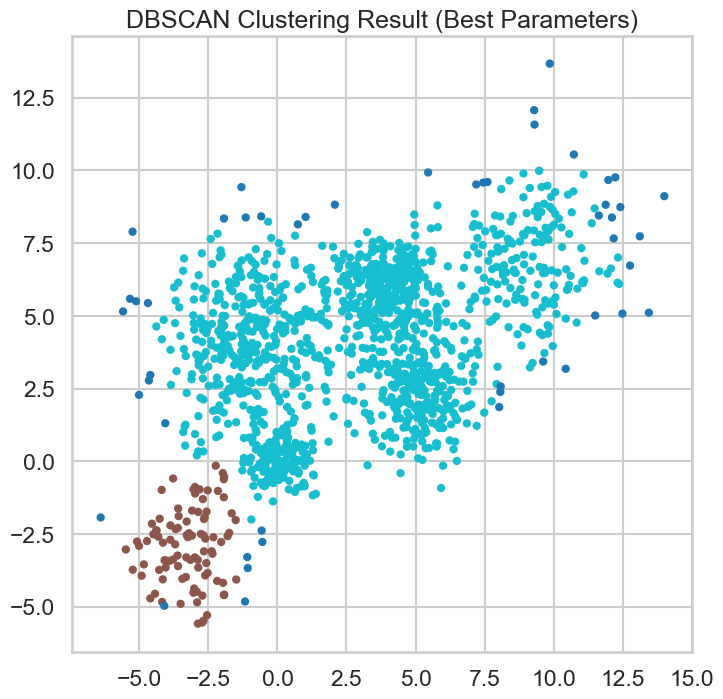

In [43]:
best_eps = 0.9
best_min_samples = 10

best_model = DBSCAN(eps=best_eps, min_samples=best_min_samples)

labels = best_model.fit_predict(Multi_blob_Data)

plt.figure(figsize=(8,8))

plt.scatter(
    Multi_blob_Data[:,0],
    Multi_blob_Data[:,1],
    c=labels,
    cmap="tab10",
    s=20
)

plt.title("DBSCAN Clustering Result (Best Parameters)")
plt.show()

## Final Comparison of Clustering Algorithms on the First Dataset

Three clustering techniques were applied to the dataset: **K-Means**, **Agglomerative (Hierarchical) Clustering**, and **DBSCAN**.  
Each method was evaluated using the **silhouette score**, which measures how well clusters are separated and how compact they are.

---

### K-Means Clustering

K-Means produced the **best performance** on this dataset.  
Using the **elbow method** and the **silhouette score**, the optimal number of clusters was found to be **K = 6**.

- Best silhouette score ≈ **0.48**
- Clusters were well separated and compact.
- The algorithm worked well because the dataset contains **spherical, evenly distributed clusters**, which matches the assumptions of K-Means.

K-Means performs best when:
- clusters are roughly **spherical**
- clusters have **similar densities**
- clusters are **well separated**

This matches the structure of the dataset, which explains its strong performance.

---

### Agglomerative (Hierarchical) Clustering

Agglomerative clustering also produced **good results**, but slightly worse than K-Means.

- Best silhouette score ≈ **0.47**
- The method successfully identified a similar cluster structure.
- The dendrogram suggested multiple possible cluster levels, and selecting a **distance threshold** allowed controlling the number of clusters.
- The best silhouette score=0.47021 at (euclidean, ward, k=2) 
- At (euclidean, ward, k=6); kmeans silhouette_score=0.486 vs 0.4687 by agllomorative clustering

Agglomerative clustering works by **iteratively merging the closest clusters**, which allows it to capture hierarchical relationships in the data.  
However, for this dataset it did not outperform K-Means because the clusters are already **simple and well separated**, making the hierarchical structure less important.

---

### DBSCAN

DBSCAN performed **significantly worse** on this dataset.

- Best silhouette score ≈ **0.283825**
- Best parameters:
  - **eps = 0.9**
  - **min_samples = 10**
- This configuration produced **2 clusters**, which does not reflect the true structure of the data.

DBSCAN is designed to detect clusters based on **density** and is particularly effective when:

- clusters have **irregular shapes**
- clusters have **varying densities**
- the dataset contains **significant noise or outliers**

However, the dataset used in this experiment consists of **compact Gaussian clusters with similar densities**, which are better suited for centroid-based methods like K-Means. As a result, DBSCAN struggled to correctly separate the clusters.

---

### Overall Comparison

| Algorithm | Best Silhouette Score | Comments |
|----------|----------------------|---------|
| **K-Means** | ~0.48 | Best performance; well suited for spherical, evenly distributed clusters |
| **Agglomerative** | ~0.46 | Good performance; slightly worse than K-Means |
| **DBSCAN** | ~0.28 | Poor performance for this dataset |

---

### Conclusion

For this dataset, **K-Means provided the best clustering performance**, followed closely by **Agglomerative clustering**.  
Both algorithms were able to identify the underlying cluster structure effectively.

**DBSCAN performed worse**, because the dataset does not contain irregular cluster shapes or varying densities where DBSCAN typically excels.

Therefore, **K-Means is the most suitable clustering method for this dataset**.

## iris data set
The iris data set is test data set that is part of the Sklearn module
which contains 150 records each with 4 features. All the features are represented by real numbers.

The data represents three classes.


In [44]:
from sklearn.datasets import load_iris
iris_data = load_iris()
iris_data.target[[10, 25, 50]]
#array([0, 0, 1])
list(iris_data.target_names)
['setosa', 'versicolor', 'virginica']


['setosa', 'versicolor', 'virginica']

* Repeat all the above clustering approaches and steps on the above data.
* Comment on the effect of scaling on clustering this dataset. Show the difference between clustering the data with and without   scaling.
* Compare between the different clustering approaches.
* Is your clustering outcome consistent with the labels?

From the data engineering course, the Iris data set has a feature that is extremely discrimnating

In [45]:
import pandas as pd

X = iris_data.data
y = iris_data.target

df = pd.DataFrame(X, columns=iris_data.feature_names)
df["class"] = y

print(df.groupby("class").mean())

       sepal length (cm)  sepal width (cm)  petal length (cm)  \
class                                                           
0                  5.006             3.428              1.462   
1                  5.936             2.770              4.260   
2                  6.588             2.974              5.552   

       petal width (cm)  
class                    
0                 0.246  
1                 1.326  
2                 2.026  


In [46]:
#ANOVA test, measures feature discrimantion, higher value means strong separation
#between class variance/ within class variance
from sklearn.feature_selection import f_classif

F_scores, p_values = f_classif(X, y)

for name, score in zip(iris_data.feature_names, F_scores):
    print(name, score)

sepal length (cm) 119.26450218449871
sepal width (cm) 49.16004008961098
petal length (cm) 1180.1611822529776
petal width (cm) 960.0071468018025


### Feature Discrimination in the Iris Dataset

Using ANOVA F-scores, we evaluated how well each feature separates the three classes.

The results show that **petal length** and **petal width** have significantly higher F-scores compared to the sepal features. This indicates that these two features provide the strongest discrimination between classes.

In particular, petal measurements clearly separate the Setosa class from the other two species, which explains why clustering algorithms perform well on this dataset.

Kmeans without scaling

In [67]:
#Load the Iris data set
from sklearn.datasets import load_iris

iris_data = load_iris()

X = iris_data.data
y_true = iris_data.target

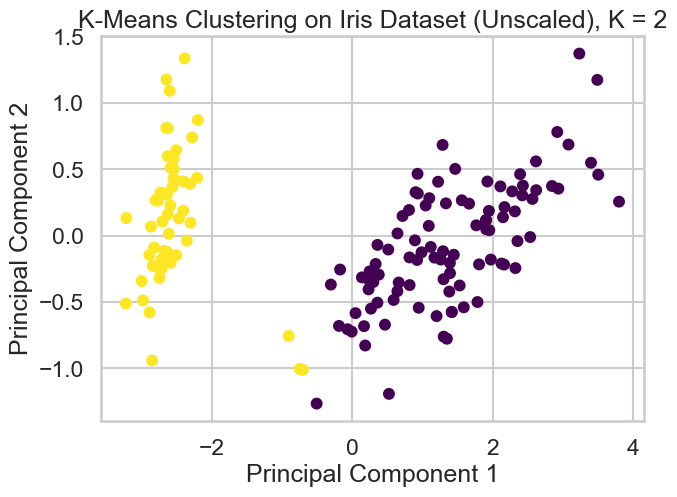

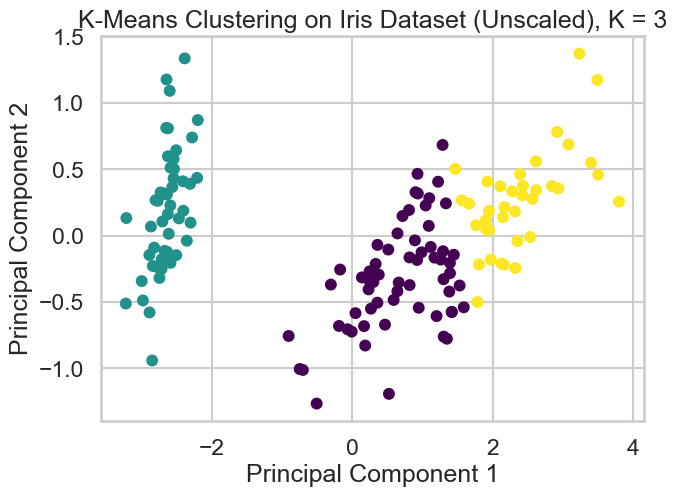

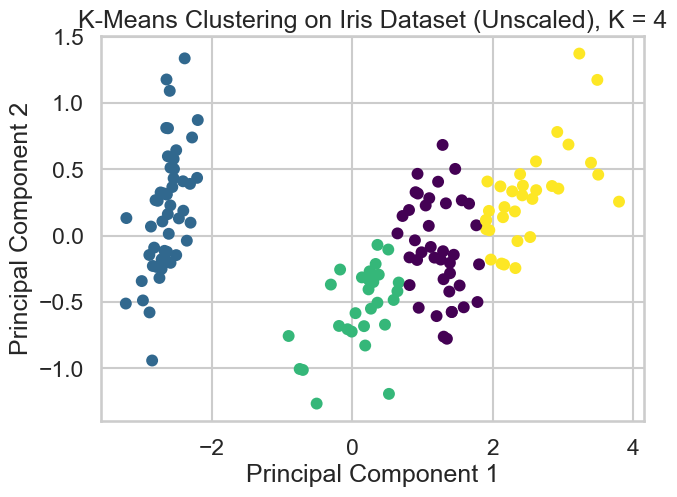

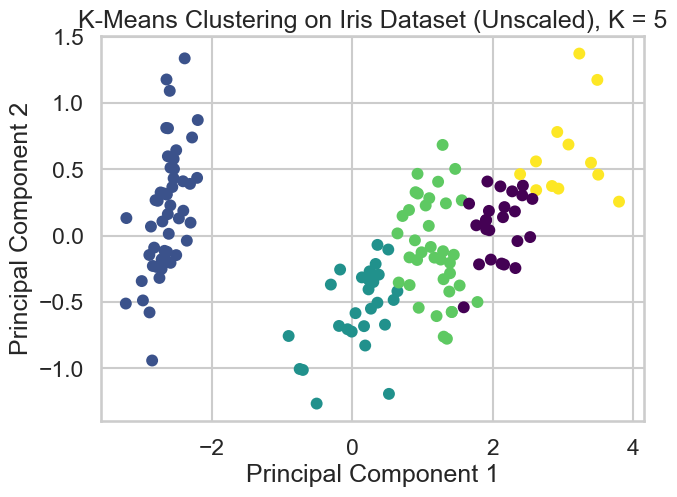

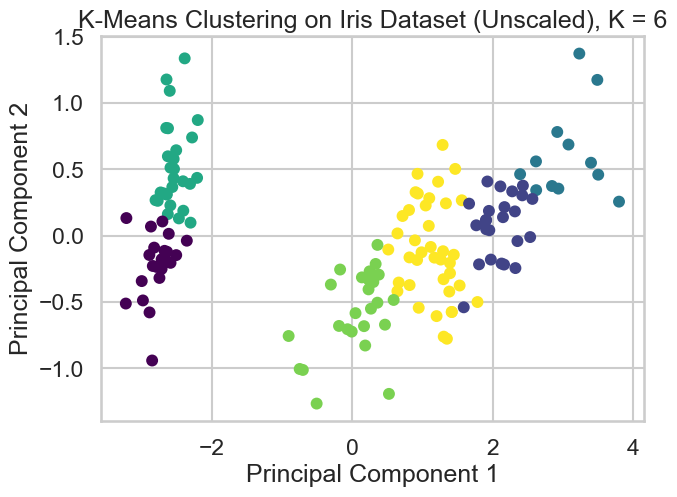

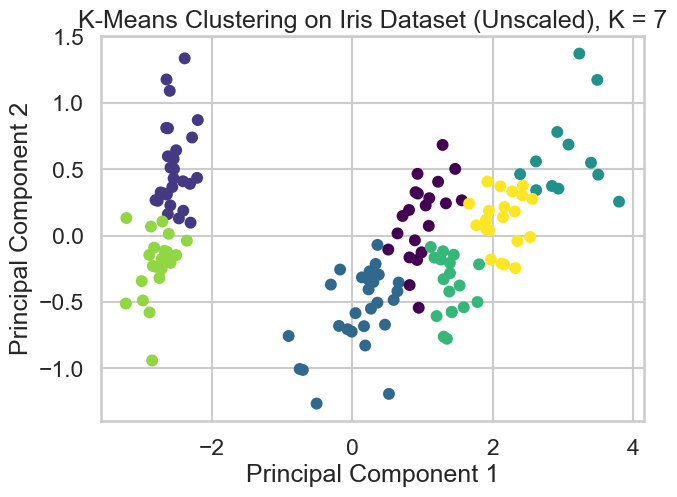

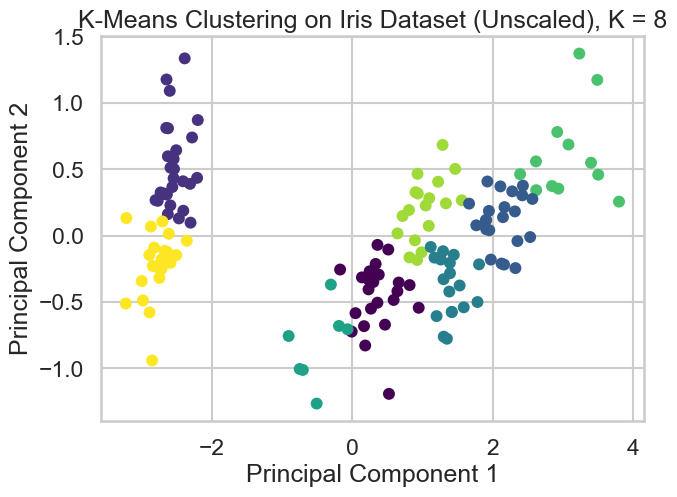

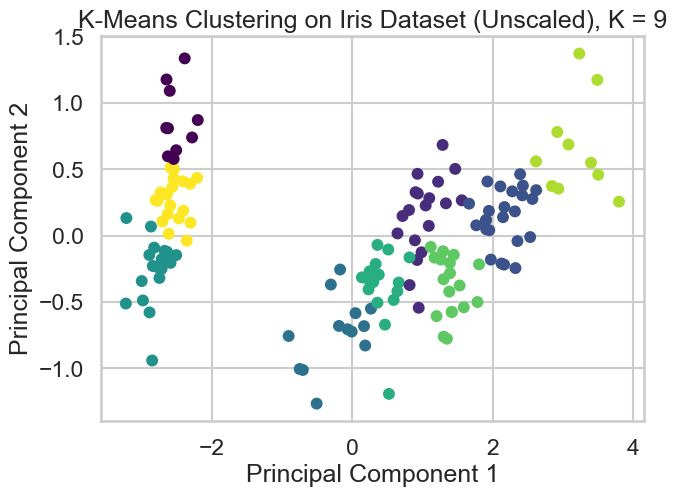

In [ ]:
#unscaled kmeans, pca, Iris
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# Iris data
X = iris_data.data
y_true = iris_data.target

distortions = []
sil_scores = []

K_values = range(2, 10)

# PCA only for visualization
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X)

for k in K_values:

    model = KMeans(n_clusters=k, init='k-means++', random_state=42, n_init=10)
    labels = model.fit_predict(X)

    distortions.append(model.inertia_)
    sil_scores.append(silhouette_score(X, labels))

    plt.figure(figsize=(7,5))
    plt.scatter(
        X_pca[:, 0],
        X_pca[:, 1],
        c=labels,
        cmap='viridis',
        s=50
    )

    plt.title(f"K-Means Clustering on Iris Dataset (Unscaled), K = {k}")
    plt.xlabel("Principal Component 1")
    plt.ylabel("Principal Component 2")
    plt.show()

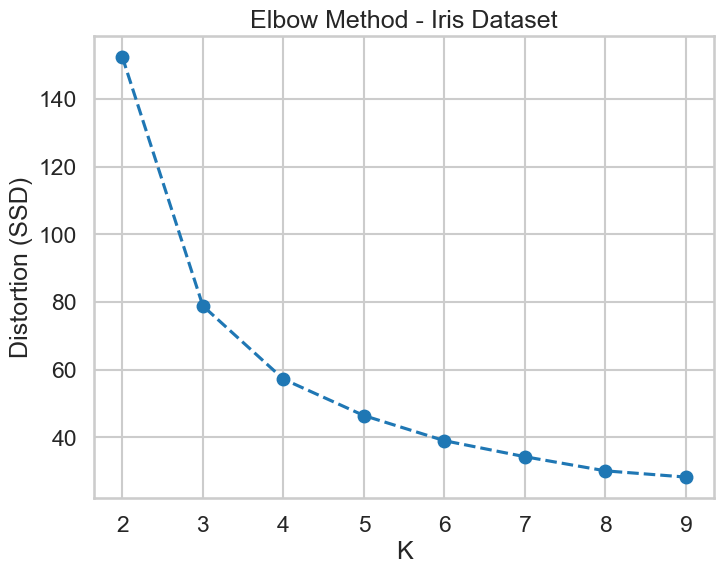

In [69]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8,6))

plt.plot(K_values, distortions, 'o--')

plt.xlabel("K")
plt.ylabel("Distortion (SSD)")
plt.title("Elbow Method - Iris Dataset")

plt.show()

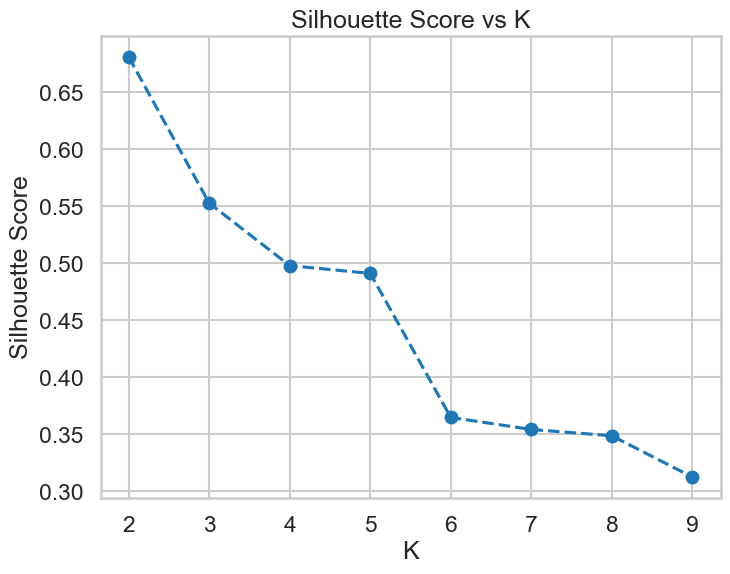

In [70]:
plt.figure(figsize=(8,6))

plt.plot(K_values, sil_scores, 'o--')

plt.xlabel("K")
plt.ylabel("Silhouette Score")
plt.title("Silhouette Score vs K")

plt.show()

In [71]:
#Train with K=3
model_unscaled = KMeans(n_clusters=3, init='k-means++', random_state=42, n_init=10)

labels_unscaled = model_unscaled.fit_predict(X)

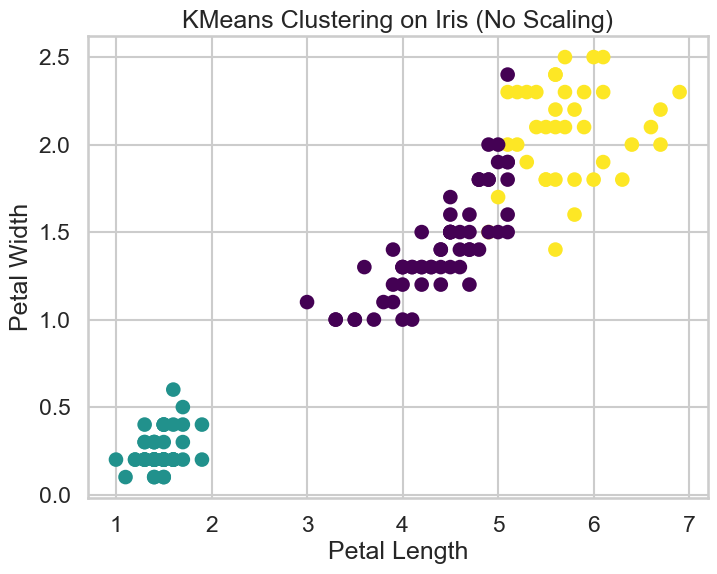

In [72]:
#Unscaled visualization using the most 2 discriminative features
plt.figure(figsize=(8,6))

plt.scatter(
    X[:,2],   # petal length
    X[:,3],   # petal width
    c=labels_unscaled,
    cmap="viridis"
)

plt.xlabel("Petal Length")
plt.ylabel("Petal Width")
plt.title("KMeans Clustering on Iris (No Scaling)")

plt.show()

In [73]:
from sklearn.decomposition import PCA

pca_unscaled = PCA(n_components=2)

X_pca_unscaled = pca_unscaled.fit_transform(X)

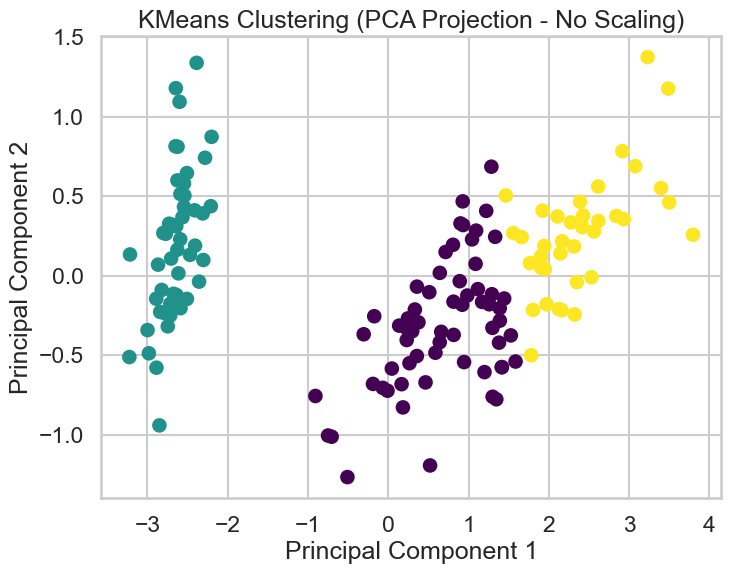

In [74]:
plt.figure(figsize=(8,6))

plt.scatter(
    X_pca_unscaled[:,0],
    X_pca_unscaled[:,1],
    c=labels_unscaled,
    cmap="viridis"
)

plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.title("KMeans Clustering (PCA Projection - No Scaling)")

plt.show()

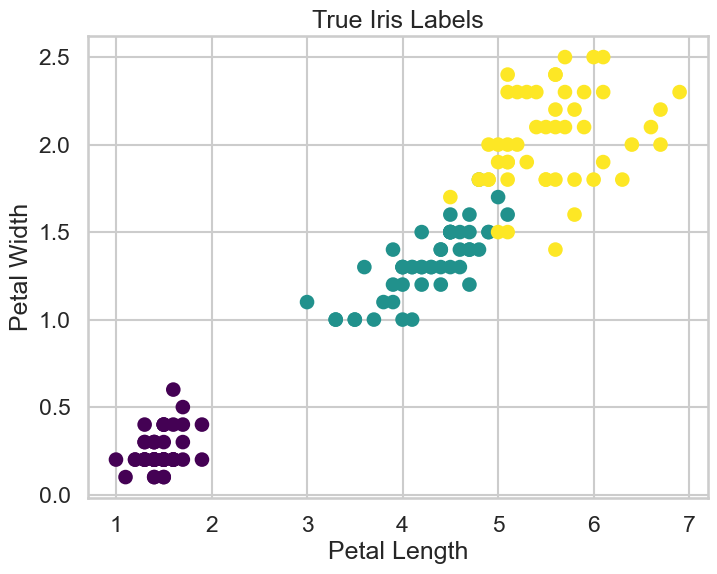

In [75]:
#True labels plot for reference
plt.figure(figsize=(8,6))

plt.scatter(
    X[:,2],
    X[:,3],
    c=y_true,
    cmap="viridis"
)

plt.xlabel("Petal Length")
plt.ylabel("Petal Width")

plt.title("True Iris Labels")

plt.show()

In [ ]:
#Comparing matrix, the diagonals are clustered correctly against labels 
#the sum of a column equals the true cluster size = 50
from sklearn.metrics import confusion_matrix
import pandas as pd
import numpy as np

cm = confusion_matrix(labels_unscaled, y_true)

cm = cm[np.argsort(np.argmax(cm, axis=1))]

species = ["Setosa","Versicolor","Virginica"]

cm_df = pd.DataFrame(
    cm,
    index=["Cluster_Setosa","Cluster_Versicolor","Cluster_Virginica"],
    columns=species
)

print(cm_df)

                    Setosa  Versicolor  Virginica
Cluster_Setosa          50           0          0
Cluster_Versicolor       0          48         14
Cluster_Virginica        0           2         36


2-Kmeans with scaling

In [77]:
#Standardize features:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

X_scaled = scaler.fit_transform(X)

In [284]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# PCA for visualization
pca_scaled = PCA(n_components=2)
X_scaled_pca = pca_scaled.fit_transform(X_scaled)

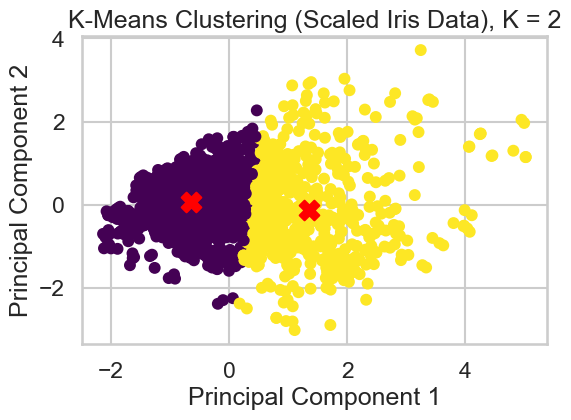

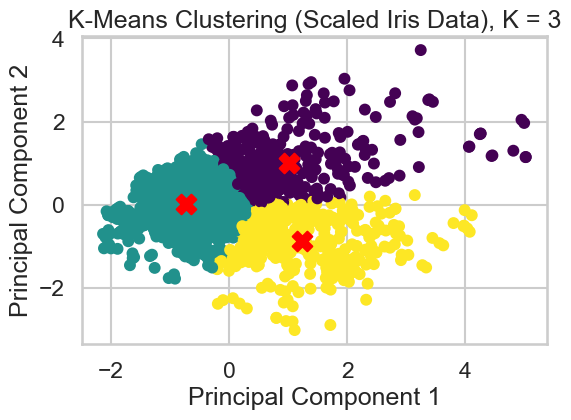

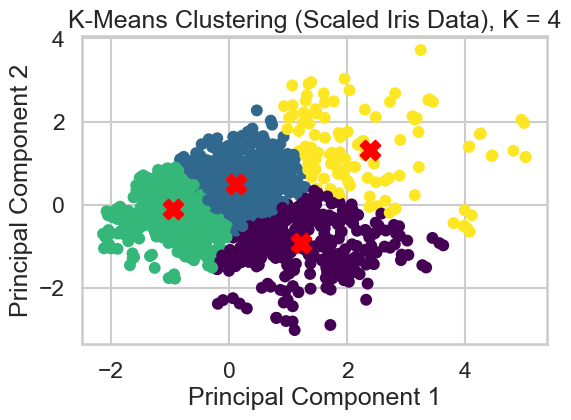

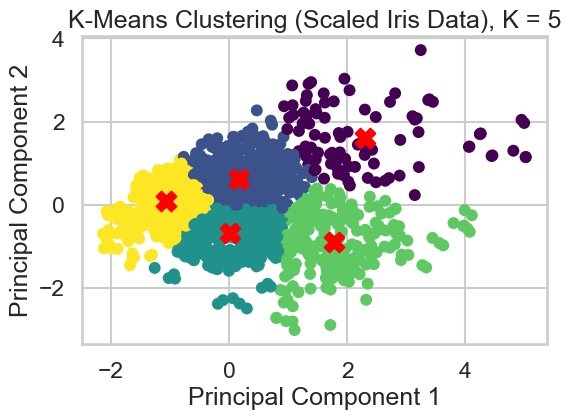

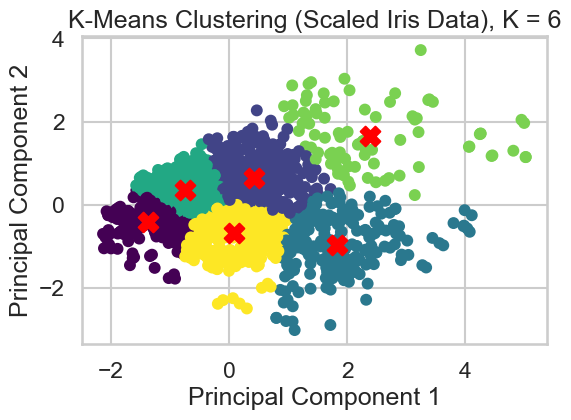

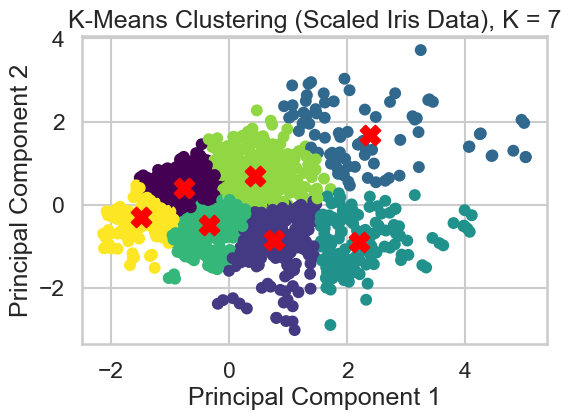

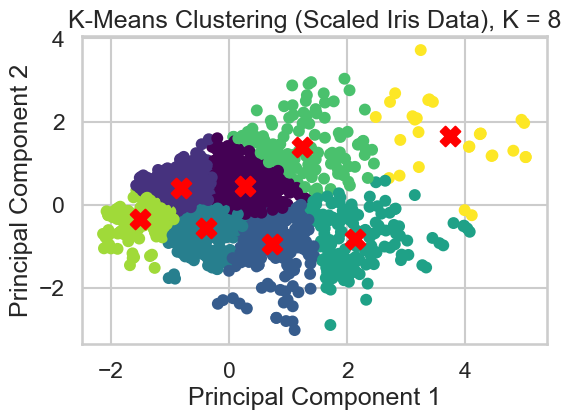

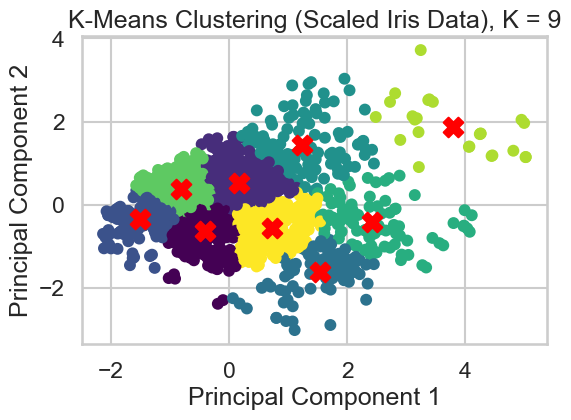

In [285]:
#Trying out different k values
distortions_scaled = []
sil_scores_scaled = []

for k in K_values:

    model = KMeans(n_clusters=k, init='k-means++', random_state=42, n_init=10)

    labels = model.fit_predict(X_scaled)

    distortions_scaled.append(model.inertia_)

    sil_scores_scaled.append(silhouette_score(X_scaled, labels))

    # transform centroids to PCA space
    centers_pca = pca_scaled.transform(model.cluster_centers_)

    plt.figure(figsize=(6,4))

    plt.scatter(
        X_scaled_pca[:,0],
        X_scaled_pca[:,1],
        c=labels,
        cmap='viridis',
        s=50
    )

    plt.scatter(
        centers_pca[:,0],
        centers_pca[:,1],
        c='red',
        marker='X',
        s=200
    )

    plt.title(f"K-Means Clustering (Scaled Iris Data), K = {k}")
    plt.xlabel("Principal Component 1")
    plt.ylabel("Principal Component 2")

    plt.show()

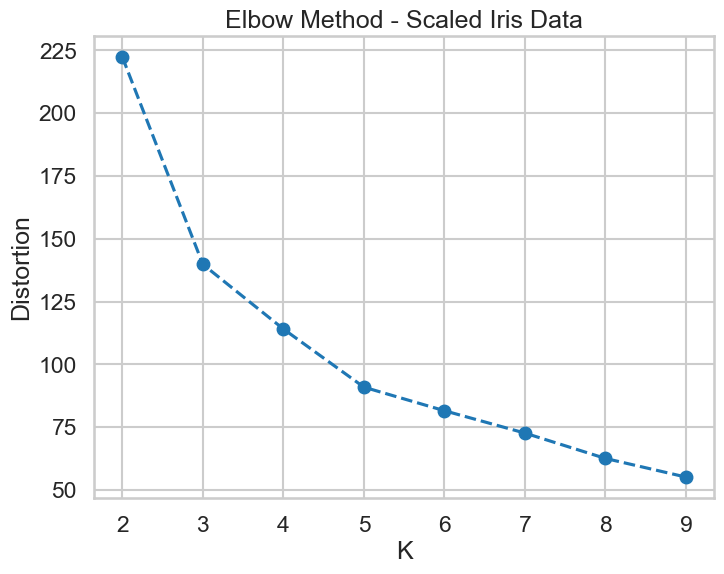

In [79]:
plt.figure(figsize=(8,6))

plt.plot(K_values, distortions_scaled, 'o--')

plt.xlabel("K")
plt.ylabel("Distortion")

plt.title("Elbow Method - Scaled Iris Data")

plt.show()

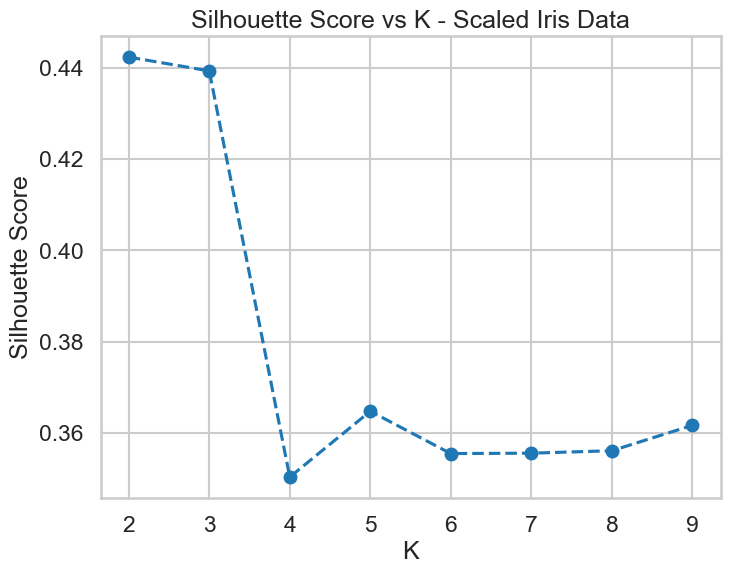

In [286]:
plt.figure(figsize=(8,6))

plt.plot(K_values, sil_scores_scaled, 'o--')

plt.xlabel("K")
plt.ylabel("Silhouette Score")

plt.title("Silhouette Score vs K - Scaled Iris Data")

plt.show()

In [80]:
model_scaled = KMeans(n_clusters=3, init='k-means++', random_state=42, n_init=10)

labels_scaled = model_scaled.fit_predict(X_scaled)

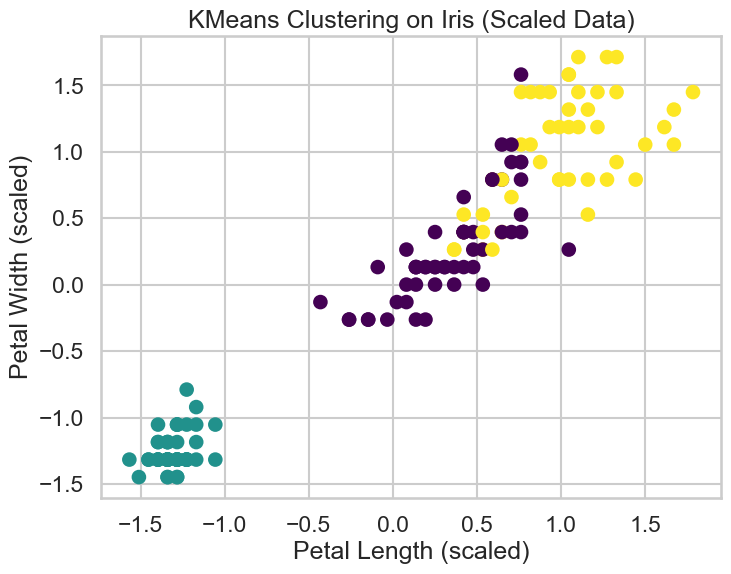

In [81]:
#Scaled visualization using the most 2 discriminative features
plt.figure(figsize=(8,6))

plt.scatter(
    X_scaled[:,2],
    X_scaled[:,3],
    c=labels_scaled,
    cmap="viridis"
)

plt.xlabel("Petal Length (scaled)")
plt.ylabel("Petal Width (scaled)")

plt.title("KMeans Clustering on Iris (Scaled Data)")

plt.show()

In [82]:
pca_scaled = PCA(n_components=2)

X_pca_scaled = pca_scaled.fit_transform(X_scaled)

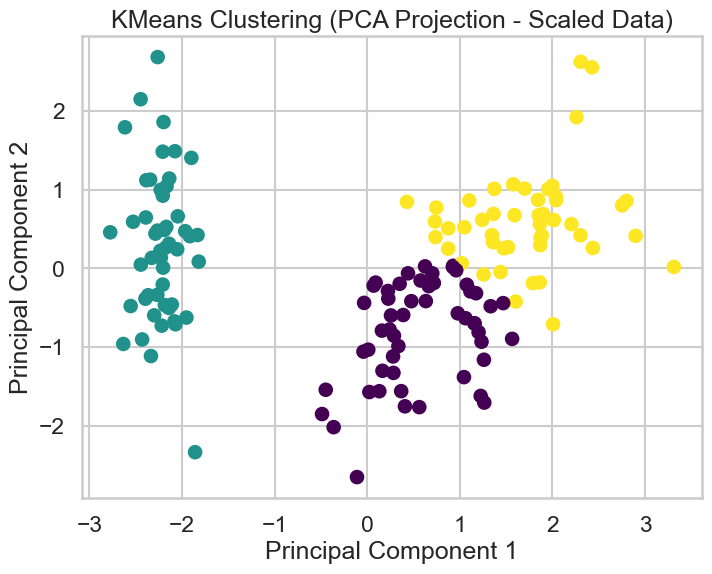

In [83]:
plt.figure(figsize=(8,6))

plt.scatter(
    X_pca_scaled[:,0],
    X_pca_scaled[:,1],
    c=labels_scaled,
    cmap="viridis"
)

plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")

plt.title("KMeans Clustering (PCA Projection - Scaled Data)")

plt.show()

In [84]:
#diagonals are true, the columns sum to the true cluster
cm = confusion_matrix(labels_scaled, y_true)

cm = cm[np.argsort(np.argmax(cm, axis=1))]

cm_df = pd.DataFrame(
    cm,
    index=["Cluster_Setosa","Cluster_Versicolor","Cluster_Virginica"],
    columns=species
)

print(cm_df)

                    Setosa  Versicolor  Virginica
Cluster_Setosa          50           0          0
Cluster_Versicolor       0          39         14
Cluster_Virginica        0          11         36


### K-Means Clustering Results (Iris Dataset)

- The Iris dataset contains **150 samples**, with **50 samples for each class**:
  - Setosa
  - Versicolor
  - Virginica

- **Setosa was perfectly clustered in both experiments**, indicating that this class is highly separable from the others.

- Most clustering errors occurred between **Versicolor and Virginica**, which is expected because their feature distributions overlap.

- **Result A**
  - Correct classifications: **134 / 150**
  - Errors: **16 samples**
  - Agreement with true labels: **≈ 89%**
  - Versicolor was classified correctly **48 out of 50 times**

- **Result B**
  - Correct classifications: **125 / 150**
  - Errors: **25 samples**
  - Agreement with true labels: **≈ 83%**
  - Versicolor classification dropped to **39 out of 50**

- The difference between the two runs comes from **scaling**, which alter the cluster boundaries.

- In both cases, the **same structural pattern appears**:
  - Setosa forms a distinct cluster
  - Versicolor and Virginica partially overlap

- Therefore, the clustering outcome is **largely consistent with the true labels**, but perfect separation is not possible using K-Means because the latter two species share similar feature distributions.

The petal length and petal width features are the most discriminative in the Iris dataset. These features also have larger numeric ranges compared to the sepal features. 

Before scaling, K-Means distance calculations were dominated by the petal features, which helped the algorithm separate the species more effectively. 

After scaling, all features were normalized to have equal variance, meaning that the less informative features (such as sepal width) contributed equally to the distance computation. This reduced the relative influence of the highly discriminative petal features, slightly decreasing the clustering accuracy.

HIERARICHAL:

1-unscaled


In [85]:
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score
from sklearn.datasets import load_iris
import numpy as np
import matplotlib.pyplot as plt

In [86]:
iris = load_iris()

X = iris.data
y_true = iris.target

In [87]:


K_values = range(2,10)

metrics = ["euclidean","manhattan","cosine"]
linkages = ["ward","complete","average"]

In [287]:
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score
import pandas as pd
import numpy as np

threshold_values = [2, 4, 6, 8, 10, 12, 15]
metrics = ["euclidean", "manhattan", "cosine"]
linkages = ["ward", "complete", "average", "single"]

results_threshold = []

for threshold in threshold_values:
    
    for metric in metrics:
        
        for linkage in linkages:
            
            # ward only works with euclidean
            if linkage == "ward" and metric != "euclidean":
                continue
            
            model = AgglomerativeClustering(
                n_clusters=None,                  # let threshold decide cluster count
                distance_threshold=threshold,     # stop merging above this distance
                metric=metric,                    # distance metric
                linkage=linkage,                  # linkage criterion
                compute_full_tree=True            # needed when using distance_threshold
            )
            
            labels = model.fit_predict(X)
            
            n_clusters = len(np.unique(labels))
            
            # silhouette needs at least 2 clusters and less than n_samples clusters
            if n_clusters > 1 and n_clusters < len(X):
                score = silhouette_score(X, labels)
            else:
                score = np.nan
            
            results_threshold.append({
                "Distance_Threshold": threshold,
                "Metric": metric,
                "Linkage": linkage,
                "Num_Clusters": n_clusters,
                "Silhouette": score
            })

df_results_threshold = pd.DataFrame(results_threshold)
df_results_threshold = df_results_threshold.sort_values(
    by=["Silhouette", "Num_Clusters"],
    ascending=[False, True]
)

df_results_threshold

,Distance_Threshold,Metric,Linkage,Num_Clusters,Silhouette
2,2,euclidean,average,2,0.686735
6,2,manhattan,single,2,0.686735
12,4,euclidean,average,2,0.686735
15,4,manhattan,average,2,0.686735
25,6,manhattan,average,2,0.686735
...,...,...,...,...,...
65,15,manhattan,average,1,NaN
66,15,manhattan,single,1,NaN
67,15,cosine,complete,1,NaN
68,15,cosine,average,1,NaN


In [288]:
df_results_threshold[df_results_threshold["Num_Clusters"] == 3]

,Distance_Threshold,Metric,Linkage,Num_Clusters,Silhouette
24,6,manhattan,complete,3,0.554367
34,8,manhattan,complete,3,0.554367
30,8,euclidean,ward,3,0.554324
40,10,euclidean,ward,3,0.554324
50,12,euclidean,ward,3,0.554324
11,4,euclidean,complete,3,0.513595


In [88]:
results = []

for k in K_values:
    
    for metric in metrics:
        
        for linkage in linkages:
            
            # ward only works with euclidean
            if linkage == "ward" and metric != "euclidean":
                continue
            
            model = AgglomerativeClustering(
                n_clusters=k,
                metric=metric,
                linkage=linkage
            )
            
            labels = model.fit_predict(X)
            
            score = silhouette_score(X, labels)
            
            results.append({
                "K": k,
                "Metric": metric,
                "Linkage": linkage,
                "Silhouette": score
            })

In [89]:
results_df = pd.DataFrame(results)

print(results_df)

    K     Metric   Linkage  Silhouette
0   2  euclidean      ward    0.686735
1   2  euclidean  complete    0.515983
2   2  euclidean   average    0.686735
3   2  manhattan  complete    0.309068
4   2  manhattan   average    0.686735
5   2     cosine  complete    0.686735
6   2     cosine   average    0.686735
7   3  euclidean      ward    0.554324
8   3  euclidean  complete    0.513595
9   3  euclidean   average    0.554161
10  3  manhattan  complete    0.554367
11  3  manhattan   average    0.553537
12  3     cosine  complete    0.399594
13  3     cosine   average    0.553808
14  4  euclidean      ward    0.488967
15  4  euclidean  complete    0.499813
16  4  euclidean   average    0.471994
17  4  manhattan  complete    0.485554
18  4  manhattan   average    0.471952
19  4     cosine  complete    0.271669
20  4     cosine   average    0.359404
21  5  euclidean      ward    0.484383
22  5  euclidean  complete    0.346174
23  5  euclidean   average    0.430670
24  5  manhattan  complet

In [90]:
results = []

k=3
    
for metric in metrics:
        
        for linkage in linkages:
            
            # ward only works with euclidean
            if linkage == "ward" and metric != "euclidean":
                continue
            
            model = AgglomerativeClustering(
                n_clusters=k,
                metric=metric,
                linkage=linkage
            )
            
            labels = model.fit_predict(X)
            
            score = silhouette_score(X, labels)
            
            results.append({
                "K": k,
                "Metric": metric,
                "Linkage": linkage,
                "Silhouette": score
            })

In [91]:
results_df = pd.DataFrame(results)

print(results_df)

   K     Metric   Linkage  Silhouette
0  3  euclidean      ward    0.554324
1  3  euclidean  complete    0.513595
2  3  euclidean   average    0.554161
3  3  manhattan  complete    0.554367
4  3  manhattan   average    0.553537
5  3     cosine  complete    0.399594
6  3     cosine   average    0.553808


best at k=3, manhattan ,complete, silhouette=0.554367


In [92]:
from scipy.cluster.hierarchy import linkage, dendrogram

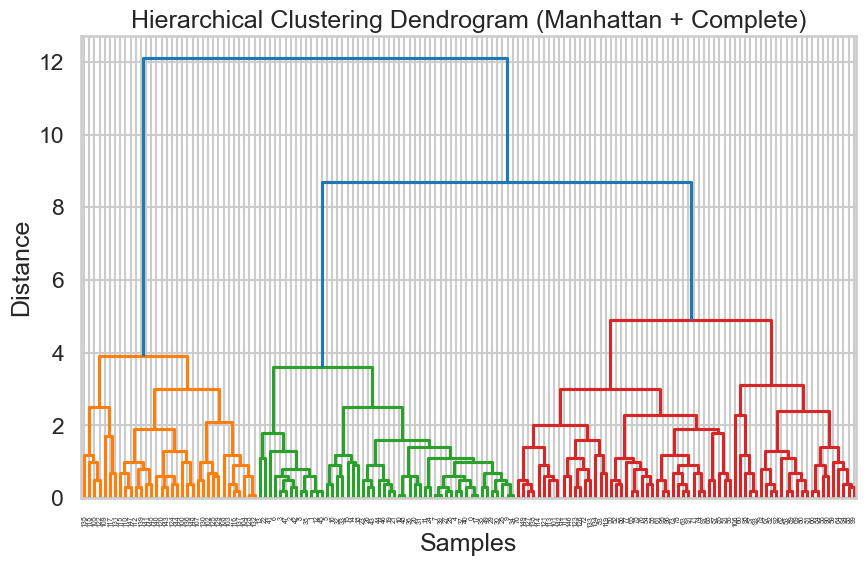

In [93]:
from scipy.cluster.hierarchy import linkage, dendrogram
import matplotlib.pyplot as plt

Z = linkage(X, method='complete', metric='cityblock')   # cityblock = manhattan

plt.figure(figsize=(10,6))
dendrogram(Z)

plt.title("Hierarchical Clustering Dendrogram (Manhattan + Complete)")
plt.xlabel("Samples")
plt.ylabel("Distance")
plt.show()

In [94]:
from sklearn.cluster import AgglomerativeClustering

agg_model = AgglomerativeClustering(
    n_clusters=3,
    metric="manhattan",
    linkage="complete"
)

agg_labels = agg_model.fit_predict(X)

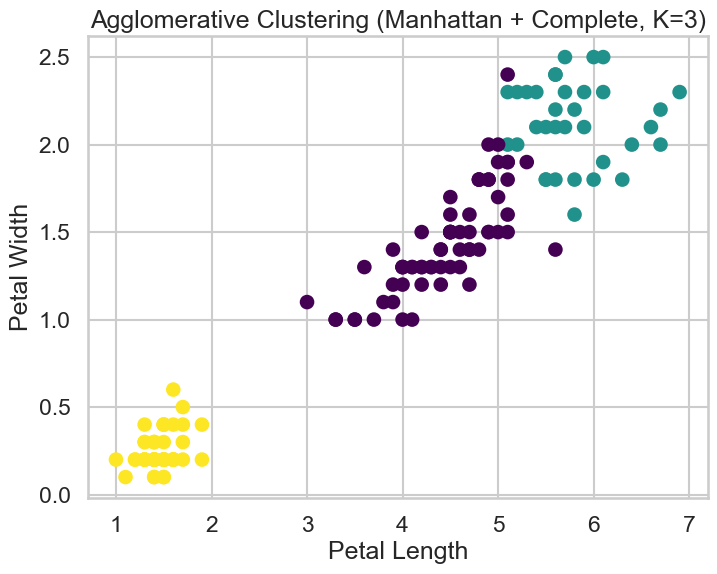

In [ ]:
#most 2 discriminating features visualization 
import matplotlib.pyplot as plt

plt.figure(figsize=(8,6))

plt.scatter(
    X[:,2],   # petal length
    X[:,3],   # petal width
    c=agg_labels,
    cmap="viridis"
)

plt.xlabel("Petal Length")
plt.ylabel("Petal Width")
plt.title("Agglomerative Clustering (Manhattan + Complete, K=3)")

plt.show()

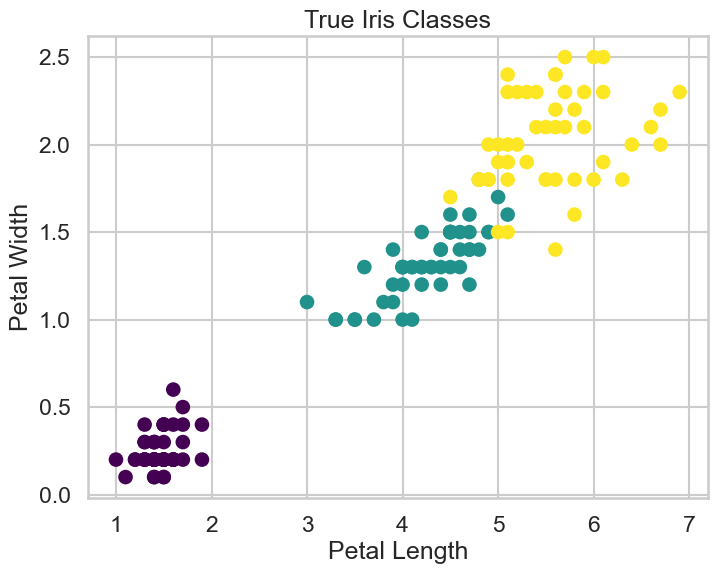

In [96]:
#PCA
plt.figure(figsize=(8,6))

plt.scatter(
    X[:,2],
    X[:,3],
    c=y_true,
    cmap="viridis"
)

plt.xlabel("Petal Length")
plt.ylabel("Petal Width")
plt.title("True Iris Classes")

plt.show()

In [97]:
from sklearn.metrics import confusion_matrix
import numpy as np
import pandas as pd

cm = confusion_matrix(agg_labels, y_true)

cm = cm[np.argsort(np.argmax(cm, axis=1))]

species = ["Setosa","Versicolor","Virginica"]

cm_df = pd.DataFrame(
    cm,
    index=["Cluster_Setosa","Cluster_Versicolor","Cluster_Virginica"],
    columns=species
)

print(cm_df)

                    Setosa  Versicolor  Virginica
Cluster_Setosa          50           0          0
Cluster_Versicolor       0          50         16
Cluster_Virginica        0           0         34


Agglomorative scaled:

In [98]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

X_scaled = scaler.fit_transform(X)

In [99]:
from sklearn.cluster import AgglomerativeClustering

agg_scaled = AgglomerativeClustering(
    n_clusters=3,
    metric="manhattan",
    linkage="complete"
)

labels_scaled = agg_scaled.fit_predict(X_scaled)

In [289]:
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score
import pandas as pd
import numpy as np

threshold_values = [0.5, 1, 1.5, 2, 2.5, 3, 4, 5]
metrics = ["euclidean", "manhattan", "cosine"]
linkages = ["ward", "complete", "average"]

results_threshold_scaled = []

for threshold in threshold_values:
    for metric in metrics:
        for linkage in linkages:

            # ward only works with euclidean
            if linkage == "ward" and metric != "euclidean":
                continue

            model = AgglomerativeClustering(
                n_clusters=None,                # let threshold determine clusters
                distance_threshold=threshold,
                metric=metric,
                linkage=linkage,
                compute_full_tree=True
            )

            labels = model.fit_predict(X_scaled)

            n_clusters = len(np.unique(labels))

            # silhouette only valid when >1 clusters and < number of samples
            if 1 < n_clusters < len(X_scaled):
                score = silhouette_score(X_scaled, labels)
            else:
                score = np.nan

            results_threshold_scaled.append({
                "Distance_Threshold": threshold,
                "Metric": metric,
                "Linkage": linkage,
                "Num_Clusters": n_clusters,
                "Silhouette": score
            })

results_threshold_scaled_df = pd.DataFrame(results_threshold_scaled)
results_threshold_scaled_df = results_threshold_scaled_df.sort_values(
    by="Silhouette", ascending=False
)

print(results_threshold_scaled_df)

    Distance_Threshold     Metric   Linkage  Num_Clusters  Silhouette
53                 5.0  manhattan   average             2    0.601113
46                 4.0  manhattan   average             2    0.601113
44                 4.0  euclidean   average             2    0.580216
37                 3.0  euclidean   average             2    0.580216
39                 3.0  manhattan   average             3    0.547097
30                 2.5  euclidean   average             3    0.535893
32                 2.5  manhattan   average             5    0.419678
13                 1.0     cosine   average             3    0.405184
20                 1.5     cosine   average             2    0.383186
23                 2.0  euclidean   average             6    0.382214
16                 1.5  euclidean   average             9    0.367191
0                  0.5  euclidean      ward           201    0.365136
50                 5.0  euclidean  complete             4    0.357814
25                 2

In [100]:
#Try all compinations on the scaled data
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score
import pandas as pd

K_values = range(2, 10)
metrics = ["euclidean", "manhattan", "cosine"]
linkages = ["ward", "complete", "average"]

results_scaled = []

for k in K_values:
    for metric in metrics:
        for linkage in linkages:
            
            # ward only works with euclidean
            if linkage == "ward" and metric != "euclidean":
                continue
            
            model = AgglomerativeClustering(
                n_clusters=k,
                metric=metric,
                linkage=linkage
            )
            
            labels = model.fit_predict(X_scaled)
            score = silhouette_score(X_scaled, labels)
            
            results_scaled.append({
                "K": k,
                "Metric": metric,
                "Linkage": linkage,
                "Silhouette": score
            })

results_scaled_df = pd.DataFrame(results_scaled)
results_scaled_df = results_scaled_df.sort_values(by="Silhouette", ascending=False)

print(results_scaled_df)

    K     Metric   Linkage  Silhouette
2   2  euclidean   average    0.581750
4   2  manhattan   average    0.581750
0   2  euclidean      ward    0.577035
6   2     cosine   average    0.577035
9   3  euclidean   average    0.480267
11  3  manhattan   average    0.452958
8   3  euclidean  complete    0.449618
7   3  euclidean      ward    0.446689
12  3     cosine  complete    0.446625
1   2  euclidean  complete    0.440812
10  3  manhattan  complete    0.435012
3   2  manhattan  complete    0.430244
13  3     cosine   average    0.430242
5   2     cosine  complete    0.411857
15  4  euclidean  complete    0.410607
16  4  euclidean   average    0.406746
17  4  manhattan  complete    0.405498
18  4  manhattan   average    0.400730
14  4  euclidean      ward    0.400636
25  5  manhattan   average    0.383839
32  6  manhattan   average    0.377065
23  5  euclidean   average    0.374601
19  4     cosine  complete    0.358309
24  5  manhattan  complete    0.353098
22  5  euclidean  complet

In [102]:
#fix k=2
results_scaled_k3 = []

k = 2

for metric in metrics:
    for linkage in linkages:
        
        # ward only works with euclidean
        if linkage == "ward" and metric != "euclidean":
            continue
        
        model = AgglomerativeClustering(
            n_clusters=k,
            metric=metric,
            linkage=linkage
        )
        
        labels = model.fit_predict(X_scaled)
        score = silhouette_score(X_scaled, labels)
        
        results_scaled_k3.append({
            "K": k,
            "Metric": metric,
            "Linkage": linkage,
            "Silhouette": score
        })

results_scaled_k3_df = pd.DataFrame(results_scaled_k3)
results_scaled_k3_df = results_scaled_k3_df.sort_values(by="Silhouette", ascending=False)

print(results_scaled_k3_df)

   K     Metric   Linkage  Silhouette
2  2  euclidean   average    0.581750
4  2  manhattan   average    0.581750
0  2  euclidean      ward    0.577035
6  2     cosine   average    0.577035
1  2  euclidean  complete    0.440812
3  2  manhattan  complete    0.430244
5  2     cosine  complete    0.411857


In [101]:
#fix k=3
results_scaled_k3 = []

k = 3

for metric in metrics:
    for linkage in linkages:
        
        # ward only works with euclidean
        if linkage == "ward" and metric != "euclidean":
            continue
        
        model = AgglomerativeClustering(
            n_clusters=k,
            metric=metric,
            linkage=linkage
        )
        
        labels = model.fit_predict(X_scaled)
        score = silhouette_score(X_scaled, labels)
        
        results_scaled_k3.append({
            "K": k,
            "Metric": metric,
            "Linkage": linkage,
            "Silhouette": score
        })

results_scaled_k3_df = pd.DataFrame(results_scaled_k3)
results_scaled_k3_df = results_scaled_k3_df.sort_values(by="Silhouette", ascending=False)

print(results_scaled_k3_df)

   K     Metric   Linkage  Silhouette
2  3  euclidean   average    0.480267
4  3  manhattan   average    0.452958
1  3  euclidean  complete    0.449618
0  3  euclidean      ward    0.446689
5  3     cosine  complete    0.446625
3  3  manhattan  complete    0.435012
6  3     cosine   average    0.430242


fo the scaled agglomorative, manhattan complete has a slightly worse silhouette score than that of the unscaled due to equalizing the effect of the most discrimnating features with the other features.

I will apply euclidean average since it shows the best sillhouette score for the scaled agglomorative

In [103]:
best_metric = "euclidean"
best_linkage = "average"
k = 3

agg_scaled = AgglomerativeClustering(
    n_clusters=k,
    metric=best_metric,
    linkage=best_linkage
)

labels_scaled = agg_scaled.fit_predict(X_scaled)

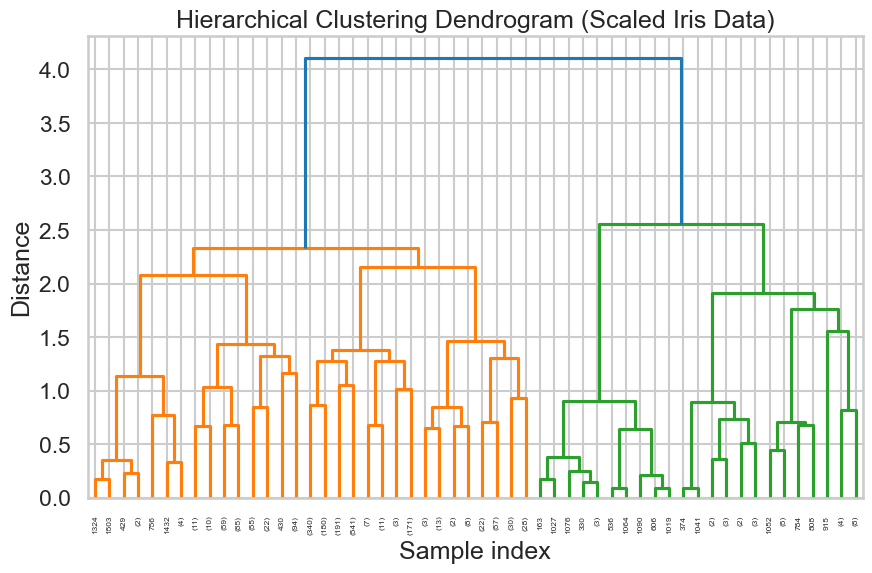

In [ ]:
#the dendogram euclidean, average
from scipy.cluster.hierarchy import dendrogram
from sklearn.cluster import AgglomerativeClustering
import matplotlib.pyplot as plt
import numpy as np

# Fit full hierarchical tree
model = AgglomerativeClustering(
    distance_threshold=0,
    n_clusters=None,
    metric="euclidean",
    linkage="average"
)

model = model.fit(X_scaled)

# Function to create linkage matrix
def plot_dendrogram(model, **kwargs):
    
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)

    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack(
        [model.children_, model.distances_, counts]
    ).astype(float)

    dendrogram(linkage_matrix, **kwargs)

# Plot dendrogram
plt.figure(figsize=(10,6))

plot_dendrogram(model, truncate_mode="level", p=5)

plt.title("Hierarchical Clustering Dendrogram (Scaled Iris Data)")
plt.xlabel("Sample index")
plt.ylabel("Distance")

plt.show()

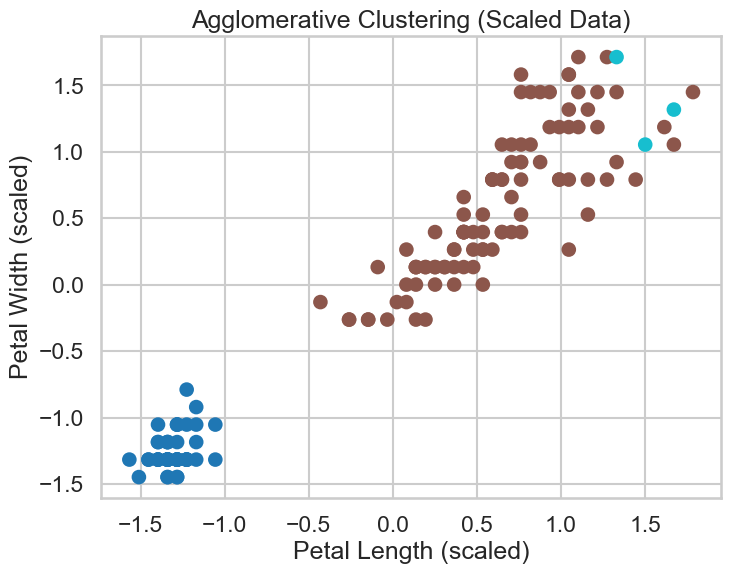

In [ ]:
#using petal length and width (most discriminating)
plt.figure(figsize=(8,6))

plt.scatter(
    X_scaled[:,2],
    X_scaled[:,3],
    c=labels_scaled,
    cmap="tab10"
)

plt.xlabel("Petal Length (scaled)")
plt.ylabel("Petal Width (scaled)")
plt.title("Agglomerative Clustering (Scaled Data)")
plt.show()

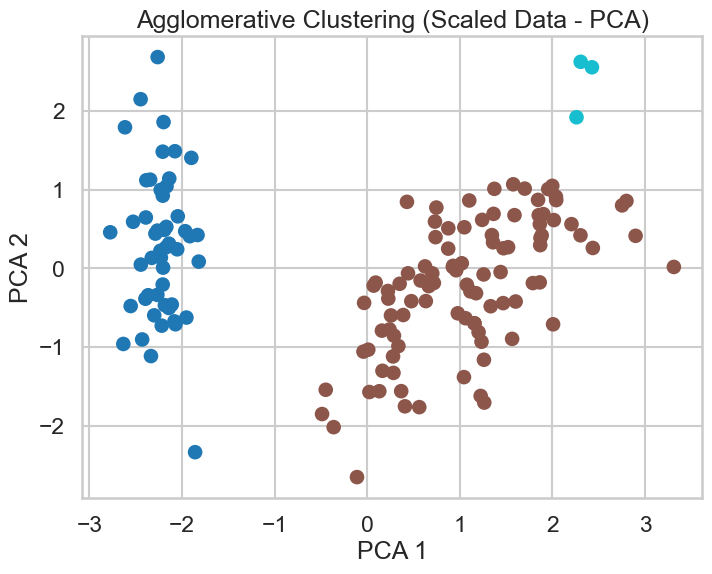

In [105]:
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
X_pca_scaled = pca.fit_transform(X_scaled)

plt.figure(figsize=(8,6))

plt.scatter(
    X_pca_scaled[:,0],
    X_pca_scaled[:,1],
    c=labels_scaled,
    cmap="tab10"
)

plt.title("Agglomerative Clustering (Scaled Data - PCA)")
plt.xlabel("PCA 1")
plt.ylabel("PCA 2")
plt.show()

In [109]:
from sklearn.metrics import confusion_matrix
import numpy as np
import pandas as pd

# clusters vs true labels
cm = confusion_matrix(labels_scaled, y_true)

# reorder clusters so dominant class aligns with diagonal
order = np.argsort(np.argmax(cm, axis=1))
cm = cm[order]

species = ["Setosa","Versicolor","Virginica"]

cm_df = pd.DataFrame(
    cm,
    index=["Cluster_Setosa","Cluster_Versicolor","Cluster_Virginica"],
    columns=species
)

print(cm_df)

                    Setosa  Versicolor  Virginica
Cluster_Setosa          50           0          0
Cluster_Versicolor       0          50         47
Cluster_Virginica        0           0          3


### Agglomerative Clustering and Comparison with K-Means

Agglomerative hierarchical clustering was applied to the Iris dataset using several combinations of **distance metrics** (Euclidean, Manhattan, Cosine) and **linkage methods** (Ward, Complete, Average).  
For the **unscaled dataset**, the best result was obtained with **Manhattan distance and Complete linkage**, producing a silhouette score of **0.554367**.

The confusion matrix for this configuration showed that **Setosa was perfectly separated**, while most misclassifications occurred between **Versicolor and Virginica**, which share overlapping feature distributions. In particular, several Virginica samples were grouped with the Versicolor cluster.

After **scaling the features**, the best parameter combination became **Euclidean distance with Average linkage**, with a silhouette score of **0.480267**. Although scaling equalized the contribution of all features, it reduced the dominance of the highly discriminative **petal features**, leading the algorithm to merge many **Versicolor and Virginica samples into the same cluster**, the silhouette score of the **manhattan, complete and 3 clusters** reduced to 0.435012.

When compared with **K-Means clustering**, Agglomerative clustering showed similar structural behavior:  
- **Setosa consistently formed a perfectly separated cluster.**  
- Most errors occurred between **Versicolor and Virginica** due to their overlapping feature space.

However, **K-Means produced better overall classification accuracy**, correctly clustering **134 out of 150 samples (≈89%)** without scaling, while Agglomerative clustering showed a larger overlap between the latter two species.

Although the **silhouette score suggested that K = 2 could produce a slightly better clustering structure**, the experiments were conducted with **K = 3** to reflect the known biological structure of the dataset containing three species.

DBSCAN unscaled:

In [293]:
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

eps_values = [0.1, 0.3, 0.5, 0.7, 1.0, 1.5, 2.0, 2.5, 3.0]
min_samples_values = [5, 10, 15, 20, 25]

dbscan_results_iris_unscaled = []

for eps in eps_values:
    for min_samples in min_samples_values:

        model = DBSCAN(eps=eps, min_samples=min_samples)
        labels = model.fit_predict(X)   # unscaled Iris data

        # number of clusters excluding noise
        n_clusters = len(set(labels)) - (1 if -1 in labels else 0)

        if n_clusters > 1:
            score = silhouette_score(X, labels)
        else:
            score = np.nan

        dbscan_results_iris_unscaled.append({
            "eps": eps,
            "min_samples": min_samples,
            "clusters": n_clusters,
            "silhouette": score
        })

dbscan_results_iris_unscaled_df = pd.DataFrame(dbscan_results_iris_unscaled)

print(dbscan_results_iris_unscaled_df)

    eps  min_samples  clusters  silhouette
0   0.1            5         0         NaN
1   0.1           10         0         NaN
2   0.1           15         0         NaN
3   0.1           20         0         NaN
4   0.1           25         0         NaN
5   0.3            5         3   -0.052064
6   0.3           10         2    0.307750
7   0.3           15         0         NaN
8   0.3           20         0         NaN
9   0.3           25         0         NaN
10  0.5            5         2    0.486034
11  0.5           10         2    0.422685
12  0.5           15         2    0.277611
13  0.5           20         1         NaN
14  0.5           25         1         NaN
15  0.7            5         2    0.501834
16  0.7           10         2    0.538592
17  0.7           15         2    0.524849
18  0.7           20         2    0.528361
19  0.7           25         2    0.487820
20  1.0            5         2    0.686735
21  1.0           10         2    0.686735
22  1.0    

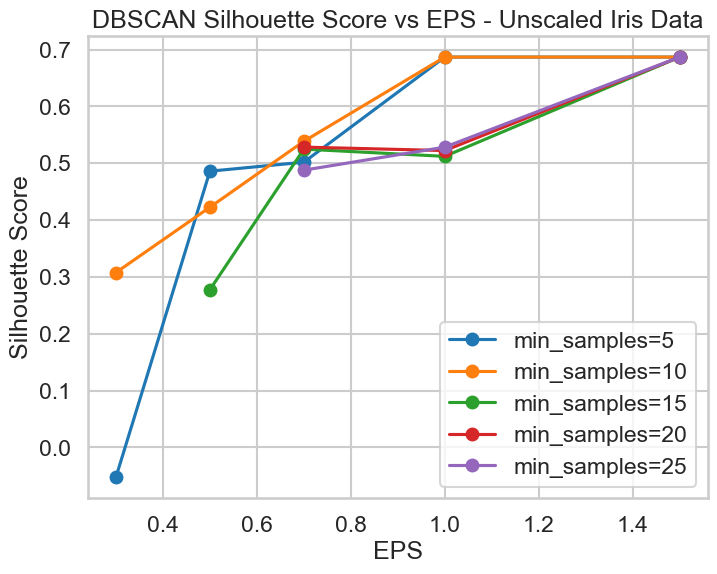

In [294]:
plt.figure(figsize=(8, 6))

for m in min_samples_values:

    subset = dbscan_results_iris_unscaled_df[
        (dbscan_results_iris_unscaled_df["min_samples"] == m) &
        (dbscan_results_iris_unscaled_df["silhouette"].notna())
    ]

    plt.plot(
        subset["eps"],
        subset["silhouette"],
        marker="o",
        label=f"min_samples={m}"
    )

plt.xlabel("EPS")
plt.ylabel("Silhouette Score")
plt.title("DBSCAN Silhouette Score vs EPS - Unscaled Iris Data")
plt.legend()
plt.grid(True)
plt.show()

In [110]:
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score
import numpy as np
import pandas as pd

eps_values = [0.1,0.3,0.5,0.7,1.0,1.5,2.0,2.5,3.0]
min_samples_values = [5,10,15,20,25]

dbscan_results = []

for eps in eps_values:
    for min_samples in min_samples_values:

        model = DBSCAN(eps=eps, min_samples=min_samples)

        labels = model.fit_predict(X)   # X = Iris feature matrix

        # number of clusters excluding noise
        n_clusters = len(set(labels)) - (1 if -1 in labels else 0)

        if n_clusters > 1:
            score = silhouette_score(X, labels)
        else:
            score = np.nan

        dbscan_results.append({
            "eps": eps,
            "min_samples": min_samples,
            "clusters": n_clusters,
            "silhouette": score
        })

dbscan_results_df = pd.DataFrame(dbscan_results)

print(dbscan_results_df)

    eps  min_samples  clusters  silhouette
0   0.1            5         0         NaN
1   0.1           10         0         NaN
2   0.1           15         0         NaN
3   0.1           20         0         NaN
4   0.1           25         0         NaN
5   0.3            5         3   -0.052064
6   0.3           10         2    0.307750
7   0.3           15         0         NaN
8   0.3           20         0         NaN
9   0.3           25         0         NaN
10  0.5            5         2    0.486034
11  0.5           10         2    0.422685
12  0.5           15         2    0.277611
13  0.5           20         1         NaN
14  0.5           25         1         NaN
15  0.7            5         2    0.501834
16  0.7           10         2    0.538592
17  0.7           15         2    0.524849
18  0.7           20         2    0.528361
19  0.7           25         2    0.487820
20  1.0            5         2    0.686735
21  1.0           10         2    0.686735
22  1.0    

In [114]:
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score
import numpy as np
import pandas as pd

eps_values = [0.3,0.5,0.7,1.0,1.5,2.0]
min_samples_values = [5,10,15,20,25]

dbscan_results = []

for eps in eps_values:
    for min_samples in min_samples_values:

        model = DBSCAN(eps=eps, min_samples=min_samples)

        labels = model.fit_predict(X)   # X = Iris feature matrix

        # number of clusters excluding noise
        n_clusters = len(set(labels)) - (1 if -1 in labels else 0)

        if n_clusters > 1:
            score = silhouette_score(X, labels)
        else:
            score = np.nan

        dbscan_results.append({
            "eps": eps,
            "min_samples": min_samples,
            "clusters": n_clusters,
            "silhouette": score
        })

dbscan_results_df = pd.DataFrame(dbscan_results)

print(dbscan_results_df)

    eps  min_samples  clusters  silhouette
0   0.3            5         3   -0.052064
1   0.3           10         2    0.307750
2   0.3           15         0         NaN
3   0.3           20         0         NaN
4   0.3           25         0         NaN
5   0.5            5         2    0.486034
6   0.5           10         2    0.422685
7   0.5           15         2    0.277611
8   0.5           20         1         NaN
9   0.5           25         1         NaN
10  0.7            5         2    0.501834
11  0.7           10         2    0.538592
12  0.7           15         2    0.524849
13  0.7           20         2    0.528361
14  0.7           25         2    0.487820
15  1.0            5         2    0.686735
16  1.0           10         2    0.686735
17  1.0           15         2    0.512111
18  1.0           20         2    0.522307
19  1.0           25         2    0.528335
20  1.5            5         2    0.686735
21  1.5           10         2    0.686735
22  1.5    

In [119]:
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score
import numpy as np
import pandas as pd

eps_values = [0.7,1.0,1.5,1.6]
min_samples_values = [5,10,15,20,25]

dbscan_results = []

for eps in eps_values:
    for min_samples in min_samples_values:

        model = DBSCAN(eps=eps, min_samples=min_samples)

        labels = model.fit_predict(X)   # X = Iris feature matrix

        # number of clusters excluding noise
        n_clusters = len(set(labels)) - (1 if -1 in labels else 0)

        if n_clusters > 1:
            score = silhouette_score(X, labels)
        else:
            score = np.nan

        dbscan_results.append({
            "eps": eps,
            "min_samples": min_samples,
            "clusters": n_clusters,
            "silhouette": score
        })

dbscan_results_df = pd.DataFrame(dbscan_results)

print(dbscan_results_df)

    eps  min_samples  clusters  silhouette
0   0.7            5         2    0.501834
1   0.7           10         2    0.538592
2   0.7           15         2    0.524849
3   0.7           20         2    0.528361
4   0.7           25         2    0.487820
5   1.0            5         2    0.686735
6   1.0           10         2    0.686735
7   1.0           15         2    0.512111
8   1.0           20         2    0.522307
9   1.0           25         2    0.528335
10  1.5            5         2    0.686735
11  1.5           10         2    0.686735
12  1.5           15         2    0.686735
13  1.5           20         2    0.686735
14  1.5           25         2    0.686735
15  1.6            5         2    0.686735
16  1.6           10         2    0.686735
17  1.6           15         2    0.686735
18  1.6           20         2    0.686735
19  1.6           25         2    0.686735


In [ ]:
#Looking for the runs that produced 3 clusters
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score
import numpy as np
import pandas as pd

eps_values = [0.1,0.2,0.3,0.5,0.7,1.0,1.5,2.0,2.5,3.0]
min_samples_values = [5,10,15,20,25]

dbscan_results = []

for eps in eps_values:
    for min_samples in min_samples_values:

        model = DBSCAN(eps=eps, min_samples=min_samples)

        labels = model.fit_predict(X)

        n_clusters = len(set(labels)) - (1 if -1 in labels else 0)

        # keep only configurations producing 3 clusters
        if n_clusters == 3:

            score = silhouette_score(X, labels)

            dbscan_results.append({
                "eps": eps,
                "min_samples": min_samples,
                "clusters": n_clusters,
                "silhouette": score
            })

dbscan_results_df = pd.DataFrame(dbscan_results)

print(dbscan_results_df)

   eps  min_samples  clusters  silhouette
0  0.3            5         3   -0.052064


In [132]:
#Looking for the runs that produced 3 clusters
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score
import numpy as np
import pandas as pd

eps_values = [0.1,0.2,0.3,0.35,0.4,0.45,0.5,0.53,0.55,0.6]
min_samples_values = [5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,25]

dbscan_results = []

for eps in eps_values:
    for min_samples in min_samples_values:

        model = DBSCAN(eps=eps, min_samples=min_samples)

        labels = model.fit_predict(X)

        n_clusters = len(set(labels)) - (1 if -1 in labels else 0)

        # keep only configurations producing 3 clusters
        if n_clusters == 3:

            score = silhouette_score(X, labels)

            dbscan_results.append({
                "eps": eps,
                "min_samples": min_samples,
                "clusters": n_clusters,
                "silhouette": score
            })

dbscan_results_df = pd.DataFrame(dbscan_results)

print(dbscan_results_df)

     eps  min_samples  clusters  silhouette
0   0.30            5         3   -0.052064
1   0.35            6         3    0.154378
2   0.35            7         3    0.148138
3   0.40            9         3    0.164402
4   0.40           10         3    0.121403
5   0.50           11         3    0.365458
6   0.50           12         3    0.328604
7   0.50           13         3    0.327635
8   0.53           14         3    0.393133
9   0.53           15         3    0.344597
10  0.53           16         3    0.337295
11  0.55           17         3    0.358215
12  0.55           18         3    0.345778
13  0.60           20         3    0.349961


given the analysis done earlier, the best DBSCAN parameters found for 3 clusters:
eps = 0.53
min_samples = 14
clusters = 3
silhouette = 0.393133
slightly worse than agglomorative and kmeans

In [133]:
best_eps = 0.53
best_min_samples = 14

best_dbscan = DBSCAN(eps=best_eps, min_samples=best_min_samples)
labels_dbscan = best_dbscan.fit_predict(X)

best_dbscan_score = silhouette_score(X, labels_dbscan)

print("Best EPS:", best_eps)
print("Best min_samples:", best_min_samples)
print("Best silhouette score:", best_dbscan_score)

Best EPS: 0.53
Best min_samples: 14
Best silhouette score: 0.3931331036747175


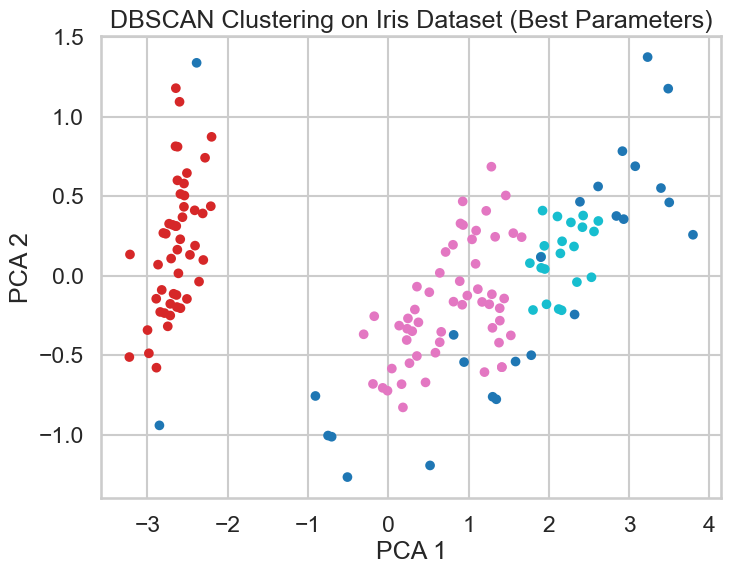

In [134]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

pca = PCA(n_components=2)
X_pca = pca.fit_transform(X)

plt.figure(figsize=(8,6))
plt.scatter(
    X_pca[:,0],
    X_pca[:,1],
    c=labels_dbscan,
    cmap="tab10",
    s=30
)

plt.xlabel("PCA 1")
plt.ylabel("PCA 2")
plt.title("DBSCAN Clustering on Iris Dataset (Best Parameters)")
plt.show()

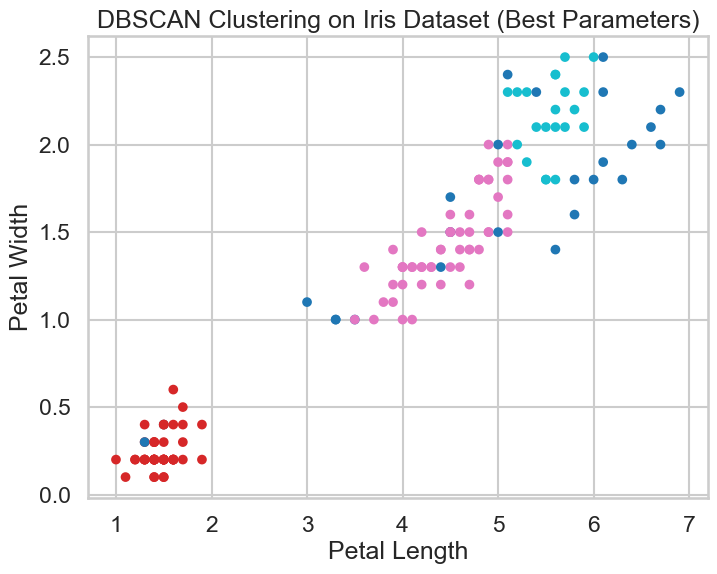

In [136]:
plt.figure(figsize=(8,6))

plt.scatter(
    X[:,2],   # petal length
    X[:,3],   # petal width
    c=labels_dbscan,
    cmap="tab10",
    s=30
)

plt.xlabel("Petal Length")
plt.ylabel("Petal Width")
plt.title("DBSCAN Clustering on Iris Dataset (Best Parameters)")
plt.show()

In [138]:
from sklearn.metrics import confusion_matrix
import numpy as np
import pandas as pd

# remove noise points (-1)
mask = labels_dbscan != -1

cm = confusion_matrix(labels_dbscan[mask], y_true[mask])

# reorder rows so the dominant class appears on the diagonal
cm = cm[np.argsort(np.argmax(cm, axis=1))]

species = ["Setosa","Versicolor","Virginica"]

cm_df = pd.DataFrame(
    cm,
    index=["Cluster_Setosa","Cluster_Versicolor","Cluster_Virginica"],
    columns=species
)

print(cm_df)

# optional: show how many points were treated as noise
print("\nNumber of noise points:", np.sum(labels_dbscan == -1))

                    Setosa  Versicolor  Virginica
Cluster_Setosa          48           0          0
Cluster_Versicolor       0          44         11
Cluster_Virginica        0           0         21

Number of noise points: 26


Note: In the Iris data set we forced K=3 for dbscan

DBSCAN SCALED 

In [139]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [296]:
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score
import numpy as np
import pandas as pd

eps_values = [0.1,0.2,0.3,0.35,0.4,0.45,0.5,0.53,0.55,0.6,0.7,0.8,0.9,1.0,1.2,1.5,2.0,2.5,3.0]
min_samples_values = [5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,25]

dbscan_scaled_results = []

for eps in eps_values:
    for min_samples in min_samples_values:

        model = DBSCAN(eps=eps, min_samples=min_samples)
        labels = model.fit_predict(X_scaled)

        # number of clusters excluding noise
        n_clusters = len(set(labels)) - (1 if -1 in labels else 0)

        # compute silhouette when clusters are greater than 1
        if n_clusters > 1:
            score = silhouette_score(X_scaled, labels)

            dbscan_scaled_results.append({
                "eps": eps,
                "min_samples": min_samples,
                "clusters": n_clusters,
                "silhouette": score
            })

dbscan_scaled_results_df = pd.DataFrame(dbscan_scaled_results)
dbscan_scaled_results_df = dbscan_scaled_results_df.sort_values(by="silhouette", ascending=False)

print(dbscan_scaled_results_df)

    eps  min_samples  clusters  silhouette
76  0.7            6         2    0.626229
75  0.7            5         2    0.626229
78  0.7            8         2    0.626229
79  0.7            9         2    0.626229
77  0.7            7         2    0.626229
..  ...          ...       ...         ...
4   0.1            9        14   -0.259297
10  0.1           15         5   -0.271255
16  0.1           25         4   -0.278353
9   0.1           14         7   -0.292264
8   0.1           13        14   -0.327101

[97 rows x 4 columns]


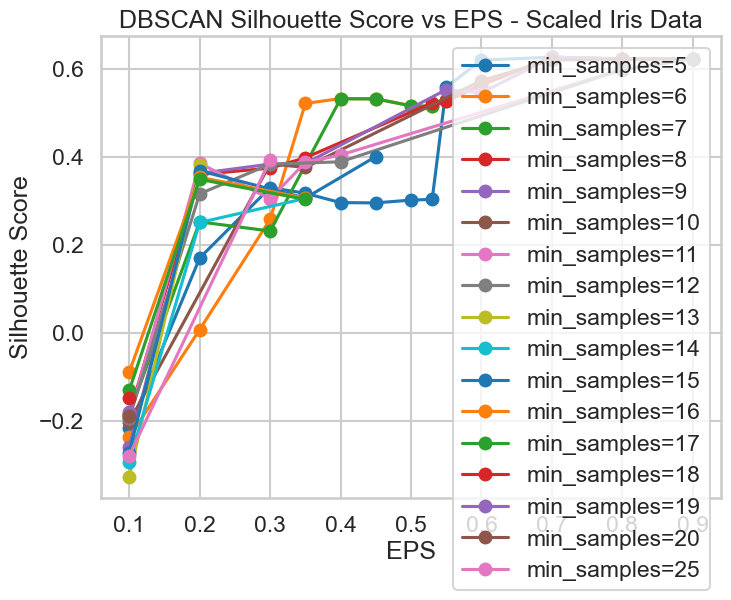

In [297]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8,6))

for m in min_samples_values:

    subset = dbscan_scaled_results_df[
        dbscan_scaled_results_df["min_samples"] == m
    ]

    if subset.empty:
        continue

    subset = subset.sort_values("eps")

    plt.plot(
        subset["eps"],
        subset["silhouette"],
        marker="o",
        label=f"min_samples={m}"
    )

plt.xlabel("EPS")
plt.ylabel("Silhouette Score")
plt.title("DBSCAN Silhouette Score vs EPS - Scaled Iris Data")

plt.legend()
plt.grid(True)

plt.show()

In [144]:
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score
import numpy as np
import pandas as pd

eps_values = [0.1,0.2,0.3,0.35,0.4,0.45,0.5,0.53,0.55,0.6,0.7,0.8,0.9,1.0,1.2,1.5,2.0,2.5,3.0]
min_samples_values = [5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,25]

dbscan_scaled_results = []

for eps in eps_values:
    for min_samples in min_samples_values:

        model = DBSCAN(eps=eps, min_samples=min_samples)
        labels = model.fit_predict(X_scaled)

        # number of clusters excluding noise
        n_clusters = len(set(labels)) - (1 if -1 in labels else 0)

        # compute silhouette only when exactly 3 clusters are formed
        if n_clusters == 3:
            score = silhouette_score(X_scaled, labels)

            dbscan_scaled_results.append({
                "eps": eps,
                "min_samples": min_samples,
                "clusters": n_clusters,
                "silhouette": score
            })

dbscan_scaled_results_df = pd.DataFrame(dbscan_scaled_results)
dbscan_scaled_results_df = dbscan_scaled_results_df.sort_values(by="silhouette", ascending=False)

print(dbscan_scaled_results_df)

     eps  min_samples  clusters  silhouette
8   0.60           11         3    0.235481
6   0.53            8         3    0.221223
4   0.50            8         3    0.188217
10  0.70           17         3    0.188142
2   0.45            5         3    0.180598
11  0.70           18         3    0.153311
9   0.60           13         3    0.145044
7   0.53           10         3    0.108290
5   0.50           10         3    0.009426
3   0.45            8         3    0.004619
1   0.40            7         3   -0.151645
0   0.30            5         3   -0.194195


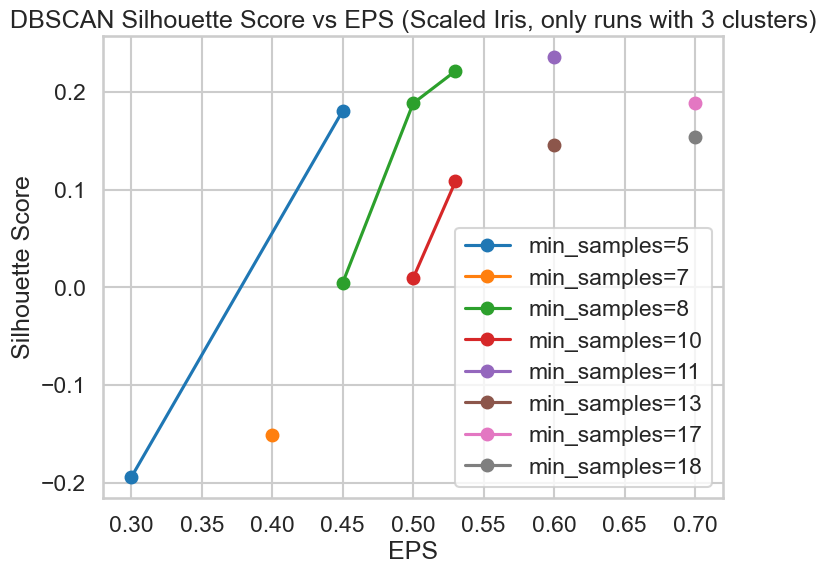

In [145]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8,6))

for m in min_samples_values:
    subset = dbscan_scaled_results_df[dbscan_scaled_results_df["min_samples"] == m]

    if not subset.empty:
        plt.plot(
            subset["eps"],
            subset["silhouette"],
            marker="o",
            label=f"min_samples={m}"
        )

plt.xlabel("EPS")
plt.ylabel("Silhouette Score")
plt.title("DBSCAN Silhouette Score vs EPS (Scaled Iris, only runs with 3 clusters)")
plt.legend()
plt.grid(True)
plt.show()

Best DBSCAN scaled results:
eps = 0.60
min_samples = 11
clusters = 3
silhouette = 0.235481
the dbscan with the scaled data is worse due to equalizing the effect of the most dicriminating features with the other features
DBSCAN is worse than the other clustering algorithms for the Iris data sets because DBSCAN does not force data into clusters.


In [146]:
best_eps_scaled = 0.60
best_min_samples_scaled = 11

best_dbscan_scaled = DBSCAN(
    eps=best_eps_scaled,
    min_samples=best_min_samples_scaled
)

labels_dbscan_scaled = best_dbscan_scaled.fit_predict(X_scaled)

print("Best DBSCAN silhouette:", silhouette_score(X_scaled, labels_dbscan_scaled))

Best DBSCAN silhouette: 0.2354813977987615


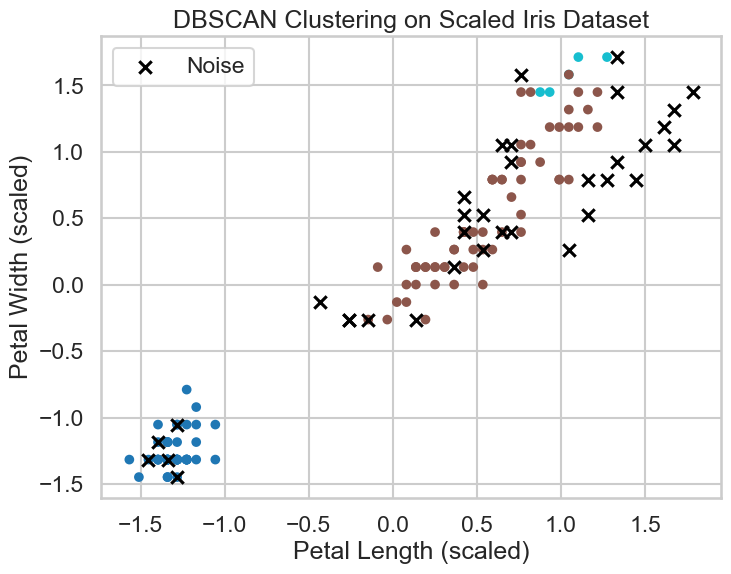

In [ ]:
#using the two most discriminating features
plt.figure(figsize=(8,6))

# clustered points
plt.scatter(
    X_scaled[labels_dbscan_scaled != -1,2],
    X_scaled[labels_dbscan_scaled != -1,3],
    c=labels_dbscan_scaled[labels_dbscan_scaled != -1],
    cmap="tab10",
    s=30
)

# noise points
plt.scatter(
    X_scaled[labels_dbscan_scaled == -1,2],
    X_scaled[labels_dbscan_scaled == -1,3],
    c="black",
    marker="x",
    s=80,
    label="Noise"
)

plt.xlabel("Petal Length (scaled)")
plt.ylabel("Petal Width (scaled)")
plt.title("DBSCAN Clustering on Scaled Iris Dataset")
plt.legend()

plt.show()

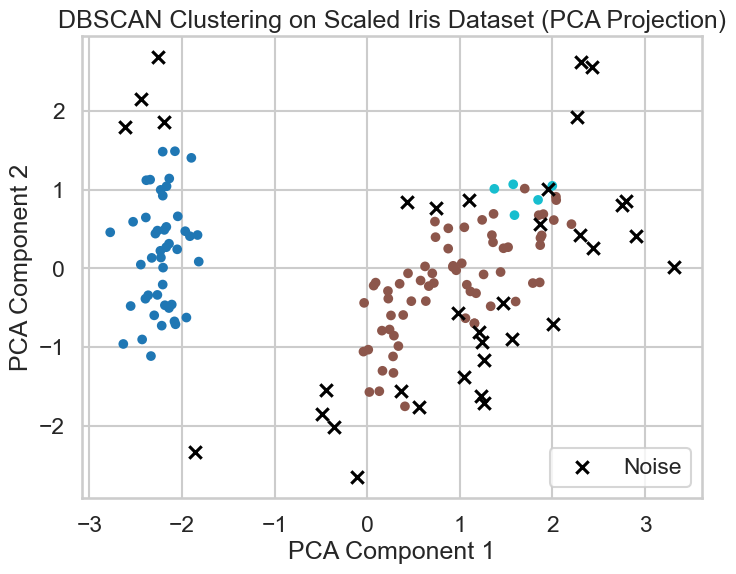

In [149]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import numpy as np

# PCA on scaled data
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

plt.figure(figsize=(8,6))

# clustered points
plt.scatter(
    X_pca[labels_dbscan_scaled != -1, 0],
    X_pca[labels_dbscan_scaled != -1, 1],
    c=labels_dbscan_scaled[labels_dbscan_scaled != -1],
    cmap="tab10",
    s=30
)

# noise points
plt.scatter(
    X_pca[labels_dbscan_scaled == -1, 0],
    X_pca[labels_dbscan_scaled == -1, 1],
    c="black",
    marker="x",
    s=80,
    label="Noise"
)

plt.xlabel("PCA Component 1")
plt.ylabel("PCA Component 2")
plt.title("DBSCAN Clustering on Scaled Iris Dataset (PCA Projection)")
plt.legend()
plt.show()

In [148]:
from sklearn.metrics import confusion_matrix
import numpy as np
import pandas as pd

# remove noise
mask = labels_dbscan_scaled != -1

cm = confusion_matrix(labels_dbscan_scaled[mask], y_true[mask])

# reorder clusters to align with species
cm = cm[np.argsort(np.argmax(cm, axis=1))]

species = ["Setosa","Versicolor","Virginica"]

cm_df = pd.DataFrame(
    cm,
    index=["Cluster_Setosa","Cluster_Versicolor","Cluster_Virginica"],
    columns=species
)

print(cm_df)

print("\nNoise points:", np.sum(labels_dbscan_scaled == -1))

                    Setosa  Versicolor  Virginica
Cluster_Setosa          45           0          0
Cluster_Versicolor       0          39         26
Cluster_Virginica        0           0          5

Noise points: 35


For the Iris dataset, DBSCAN cannot be configured to produce a fixed number of clusters like K-Means or Agglomerative clustering. Instead, different combinations of **eps** and **min_samples** were tested, and only the parameter settings that produced **three clusters** were considered in order to allow comparison with the known three species of Iris.

DBSCAN generally showed **weaker performance** than the other clustering techniques. The best result for the **unscaled data** produced a silhouette score of **0.3931** with **eps = 0.53** and **min_samples = 14**, while the best result for the **scaled data** produced a silhouette score of **0.2355** with **eps = 0.6** and **min_samples = 11**.

The scaled data resulted in lower silhouette scores because standardization equalizes the influence of all features. In the Iris dataset, **petal length and petal width are the most discriminative features**, and scaling reduces their natural dominance relative to sepal features, leading to weaker cluster separation.

## Customer dataset
Repeat all the above on the customer data set

In [150]:
import warnings
warnings.filterwarnings('ignore')

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
df = pd.read_csv("Customer data.csv")

# Show first rows
df.head()

,ID,Sex,Marital status,Age,Education,Income,Occupation,Settlement size
0,100000001,0,0,67,2,124670,1,2
1,100000002,1,1,22,1,150773,1,2
2,100000003,0,0,49,1,89210,0,0
3,100000004,0,0,45,1,171565,1,1
4,100000005,0,0,53,1,149031,1,1


In [151]:
print("Shape:", df.shape)
print("\nColumns:")
print(df.columns.tolist())

Shape: (2000, 8)

Columns:
['ID', 'Sex', 'Marital status', 'Age', 'Education', 'Income', 'Occupation', 'Settlement size']


In [152]:
# Basic information
df.info()

<class 'pandas.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 8 columns):
 #   Column           Non-Null Count  Dtype
---  ------           --------------  -----
 0   ID               2000 non-null   int64
 1   Sex              2000 non-null   int64
 2   Marital status   2000 non-null   int64
 3   Age              2000 non-null   int64
 4   Education        2000 non-null   int64
 5   Income           2000 non-null   int64
 6   Occupation       2000 non-null   int64
 7   Settlement size  2000 non-null   int64
dtypes: int64(8)
memory usage: 125.1 KB


The data seems to be encoded and pre-processed


In [153]:
# Quick statistical summary
df.describe(include='all')

,ID,Sex,Marital status,Age,Education,Income,Occupation,Settlement size
count,2.000000e+03,2000.000000,2000.000000,2000.000000,2000.00000,2000.000000,2000.000000,2000.000000
mean,1.000010e+08,0.457000,0.496500,35.909000,1.03800,120954.419000,0.810500,0.739000
std,5.774946e+02,0.498272,0.500113,11.719402,0.59978,38108.824679,0.638587,0.812533
min,1.000000e+08,0.000000,0.000000,18.000000,0.00000,35832.000000,0.000000,0.000000
25%,1.000005e+08,0.000000,0.000000,27.000000,1.00000,97663.250000,0.000000,0.000000
50%,1.000010e+08,0.000000,0.000000,33.000000,1.00000,115548.500000,1.000000,1.000000
75%,1.000015e+08,1.000000,1.000000,42.000000,1.00000,138072.250000,1.000000,1.000000
max,1.000020e+08,1.000000,1.000000,76.000000,3.00000,309364.000000,2.000000,2.000000


In [154]:
# Check first few rows clearly
display(df.head(10))

,ID,Sex,Marital status,Age,Education,Income,Occupation,Settlement size
0,100000001,0,0,67,2,124670,1,2
1,100000002,1,1,22,1,150773,1,2
2,100000003,0,0,49,1,89210,0,0
3,100000004,0,0,45,1,171565,1,1
4,100000005,0,0,53,1,149031,1,1
5,100000006,0,0,35,1,144848,0,0
6,100000007,0,0,53,1,156495,1,1
7,100000008,0,0,35,1,193621,2,1
8,100000009,0,1,61,2,151591,0,0
9,100000010,0,1,28,1,174646,2,0


Settlement size 0,1,2 == small,med,large city

In [156]:
for col in df.columns:
    print(f"\nColumn: {col}")
    print("Number of unique values:", df[col].nunique())
    print("Unique values:", sorted(df[col].unique()))


Column: ID
Number of unique values: 2000
Unique values: [100000001, 100000002, 100000003, 100000004, 100000005, 100000006, 100000007, 100000008, 100000009, 100000010, 100000011, 100000012, 100000013, 100000014, 100000015, 100000016, 100000017, 100000018, 100000019, 100000020, 100000021, 100000022, 100000023, 100000024, 100000025, 100000026, 100000027, 100000028, 100000029, 100000030, 100000031, 100000032, 100000033, 100000034, 100000035, 100000036, 100000037, 100000038, 100000039, 100000040, 100000041, 100000042, 100000043, 100000044, 100000045, 100000046, 100000047, 100000048, 100000049, 100000050, 100000051, 100000052, 100000053, 100000054, 100000055, 100000056, 100000057, 100000058, 100000059, 100000060, 100000061, 100000062, 100000063, 100000064, 100000065, 100000066, 100000067, 100000068, 100000069, 100000070, 100000071, 100000072, 100000073, 100000074, 100000075, 100000076, 100000077, 100000078, 100000079, 100000080, 100000081, 100000082, 100000083, 100000084, 100000085, 1000000

In [158]:
for col in df.columns.drop('ID'):
    print(f"\nColumn: {col}")
    print(df[col].value_counts())


Column: Sex
Sex
0    1086
1     914
Name: count, dtype: int64

Column: Marital status
Marital status
0    1007
1     993
Name: count, dtype: int64

Column: Age
Age
26    116
27    111
25     88
24     83
28     80
35     79
23     77
31     76
36     73
30     70
29     70
32     67
33     66
34     60
40     58
37     56
38     51
22     49
42     48
39     40
46     35
21     34
41     33
43     33
45     31
44     30
49     29
48     29
47     26
50     23
20     23
57     20
52     19
51     19
54     17
53     16
63     15
64     14
61     13
60     13
58     12
65     12
67     10
56     10
55     10
66      9
62      8
68      7
19      5
59      5
71      5
74      4
70      3
73      3
18      3
75      2
72      1
76      1
Name: count, dtype: int64

Column: Education
Education
1    1386
2     291
0     287
3      36
Name: count, dtype: int64

Column: Income
Income
214364    2
120262    2
131242    2
83687     2
136812    2
         ..
123525    1
117744    1
86400     1
979

In [159]:
# Missing values
missing_values = df.isnull().sum()
print(missing_values)

ID                 0
Sex                0
Marital status     0
Age                0
Education          0
Income             0
Occupation         0
Settlement size    0
dtype: int64


In [162]:
numeric_features = ['Age', 'Income']
categorical_features = ['Sex', 'Marital status', 'Education', 'Occupation', 'Settlement size']

print("Numeric features:", numeric_features)
print("Categorical features:", categorical_features)

Numeric features: ['Age', 'Income']
Categorical features: ['Sex', 'Marital status', 'Education', 'Occupation', 'Settlement size']


In [ ]:


numeric_summary = df[numeric_features].agg(['min', 'max', 'mean', 'std', 'median']).T
numeric_summary['skewness'] = df[numeric_features].skew()
numeric_summary
#data looks positively skewed, long right tail

,min,max,mean,std,median,skewness
Age,18.0,76.0,35.909,11.719402,33.0,1.009940
Income,35832.0,309364.0,120954.419,38108.824679,115548.5,1.196085


In [166]:
corr_matrix = df[numeric_features].corr()
corr_matrix

,Age,Income
Age,1.00000,0.34061
Income,0.34061,1.00000


In [168]:
for col in numeric_features:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1

    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    outliers = df[(df[col] < lower_bound) | (df[col] > upper_bound)]

    print(f"{col}:")
    print(f"  Q1 = {Q1}")
    print(f"  Q3 = {Q3}")
    print(f"  IQR = {IQR}")
    print(f"  Lower bound = {lower_bound}")
    print(f"  Upper bound = {upper_bound}")
    print(f"  Number of outliers = {len(outliers)}\n")

Age:
  Q1 = 27.0
  Q3 = 42.0
  IQR = 15.0
  Lower bound = 4.5
  Upper bound = 64.5
  Number of outliers = 57

Income:
  Q1 = 97663.25
  Q3 = 138072.25
  IQR = 40409.0
  Lower bound = 37049.75
  Upper bound = 198685.75
  Number of outliers = 83



kmeans is senstive to outliers

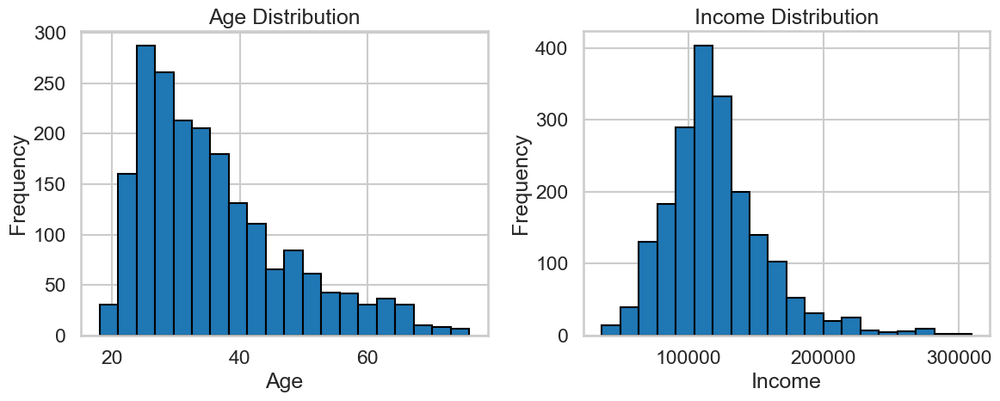

In [170]:
plt.figure(figsize=(12,5))

plt.subplot(1,2,1)
plt.hist(df['Age'], bins=20, edgecolor='black')
plt.title("Age Distribution")
plt.xlabel("Age")
plt.ylabel("Frequency")

plt.subplot(1,2,2)
plt.hist(df['Income'], bins=20, edgecolor='black')
plt.title("Income Distribution")
plt.xlabel("Income")
plt.ylabel("Frequency")

plt.tight_layout()
plt.show()

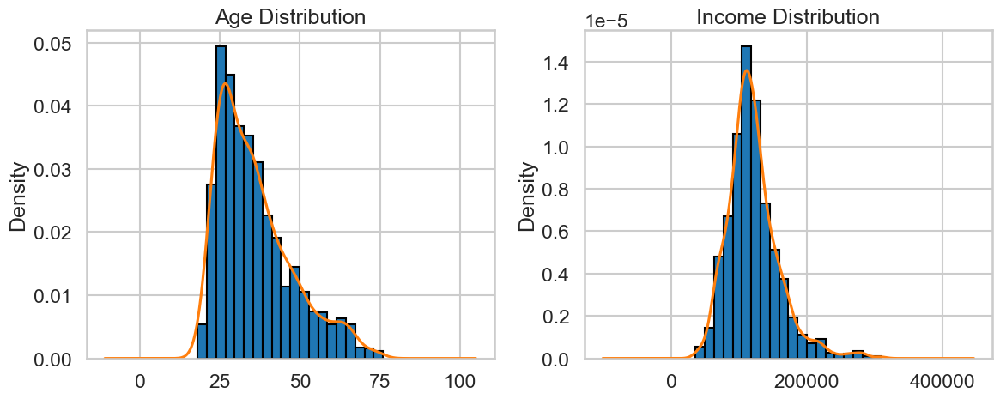

In [171]:
plt.figure(figsize=(12,5))

plt.subplot(1,2,1)
plt.hist(df['Age'], bins=20, edgecolor='black', density=True)
df['Age'].plot(kind='kde', title='Age Distribution')

plt.subplot(1,2,2)
plt.hist(df['Income'], bins=20, edgecolor='black', density=True)
df['Income'].plot(kind='kde', title='Income Distribution')

plt.tight_layout()
plt.show()

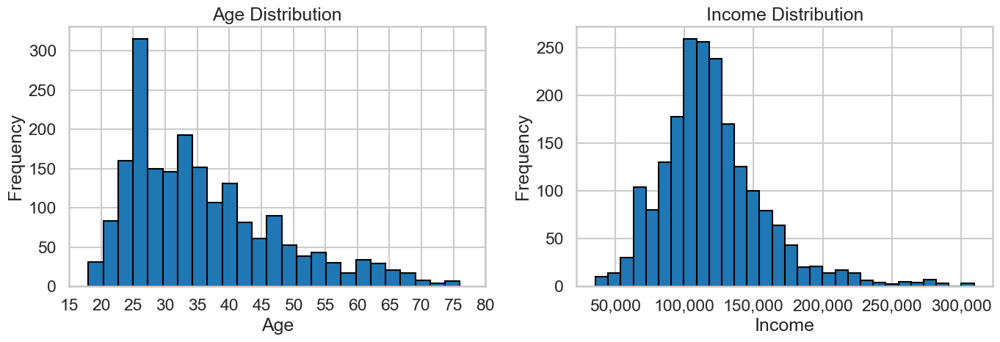

In [172]:
import matplotlib.ticker as ticker

plt.figure(figsize=(14,5))

# AGE DISTRIBUTION
plt.subplot(1,2,1)
plt.hist(df['Age'], bins=25, edgecolor='black')
plt.title("Age Distribution")
plt.xlabel("Age")
plt.ylabel("Frequency")

plt.xticks(range(15,85,5))  # clearer age ticks


# INCOME DISTRIBUTION
plt.subplot(1,2,2)
plt.hist(df['Income'], bins=30, edgecolor='black')
plt.title("Income Distribution")
plt.xlabel("Income")
plt.ylabel("Frequency")

# disable scientific notation
plt.ticklabel_format(style='plain', axis='x')

# format numbers with commas
plt.gca().xaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))

plt.tight_layout()
plt.show()

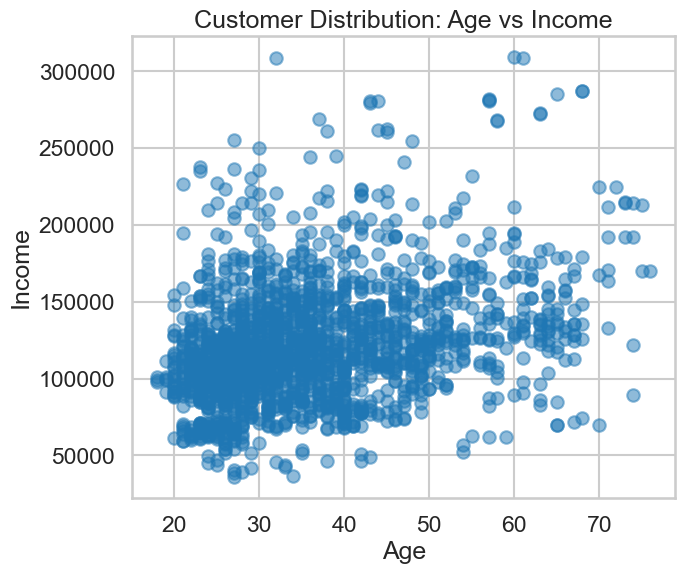

In [173]:
#scatter plot age vs income:
plt.figure(figsize=(7,6))
plt.scatter(df['Age'], df['Income'], alpha=0.5)
plt.xlabel("Age")
plt.ylabel("Income")
plt.title("Customer Distribution: Age vs Income")
plt.show()

In [187]:
# Remove the ID column if it exists
if 'ID' in df.columns:
    df = df.drop(columns=['ID'])

In [188]:
# Scale the age and income
# Select the features used for clustering, age and income because they are continous and informative
X = df[['Age', 'Income']]

# Scale the features
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Convert back to DataFrame (optional but cleaner for debugging)
import pandas as pd
X_scaled = pd.DataFrame(X_scaled, columns=X.columns)

# Verify dimensions
print("Original dataset shape:", df.shape)
print("Clustering features shape:", X.shape)
print("Scaled data shape:", X_scaled.shape)

X_scaled.head()

Original dataset shape: (2000, 7)
Clustering features shape: (2000, 2)
Scaled data shape: (2000, 2)


,Age,Income
0,2.653614,0.097524
1,-1.187132,0.782654
2,1.117316,-0.833202
3,0.775916,1.328386
4,1.458716,0.736932


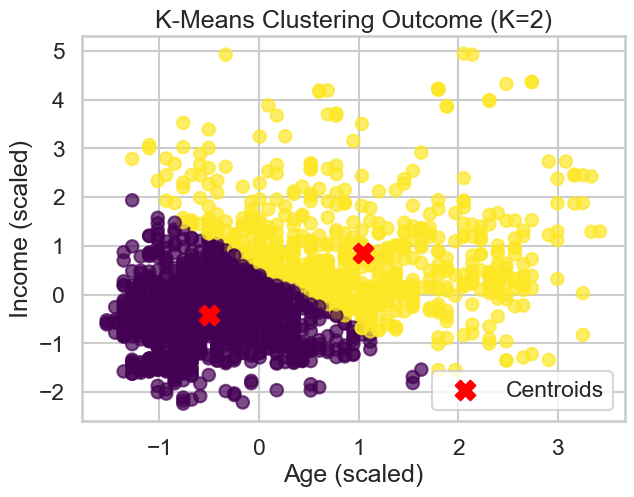

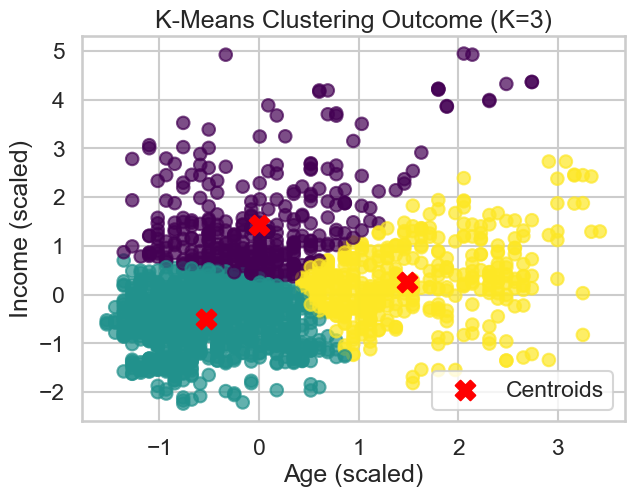

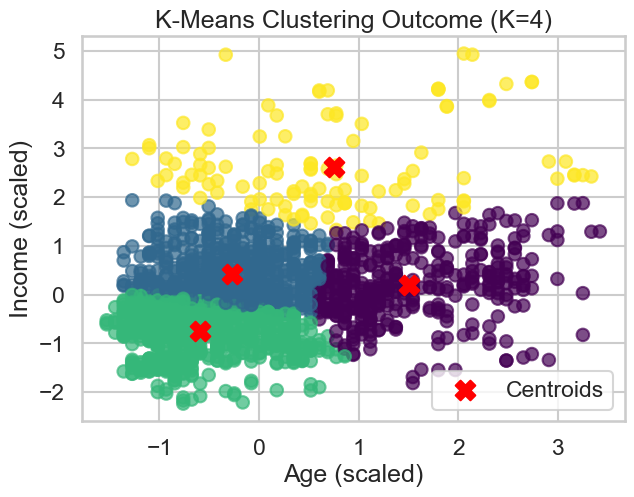

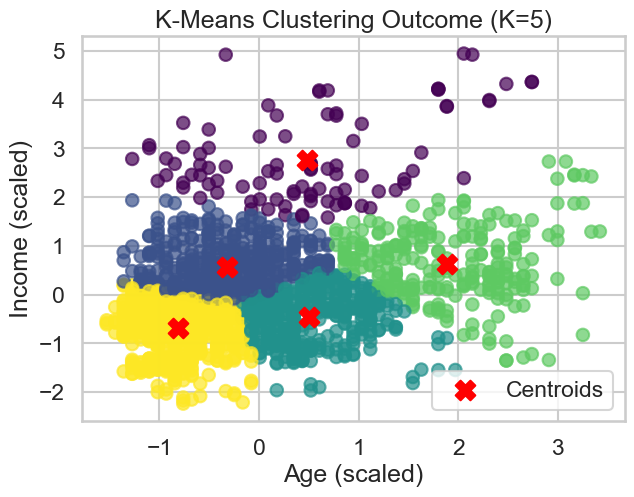

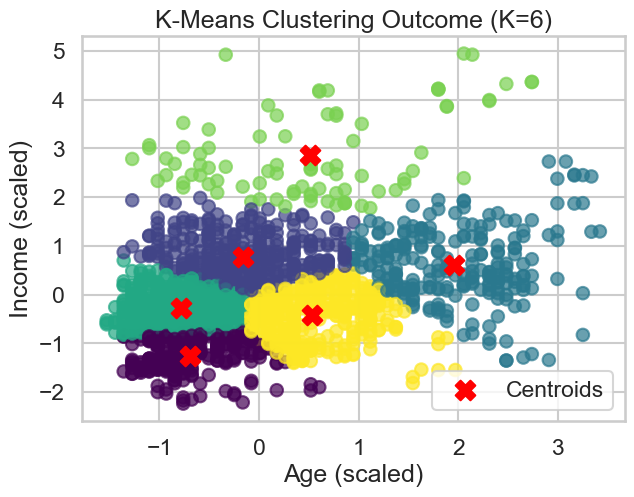

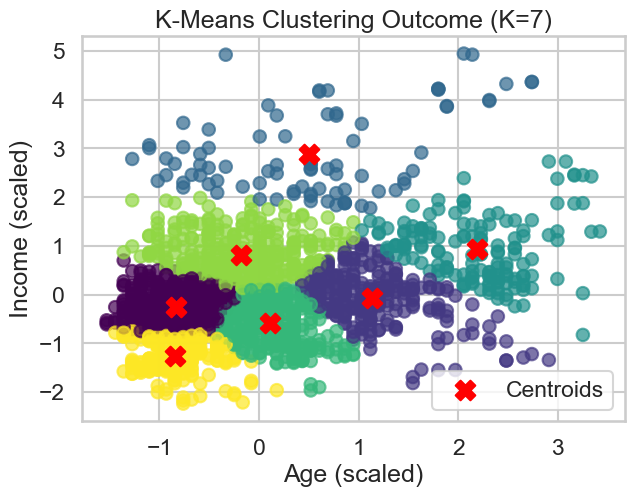

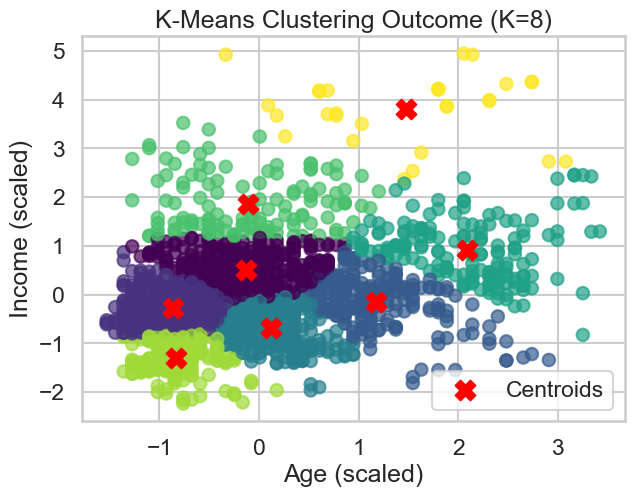

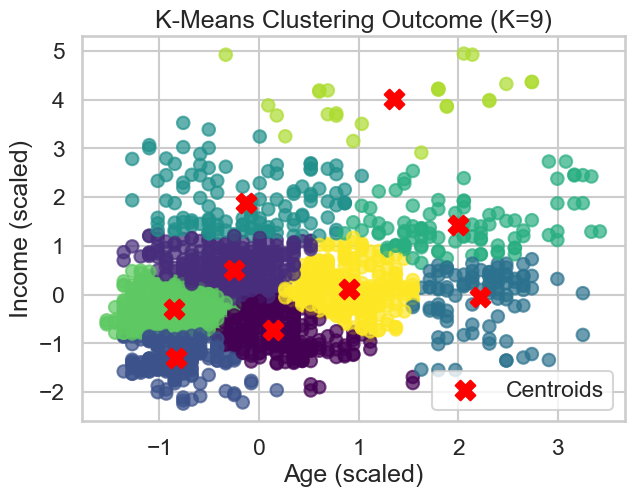

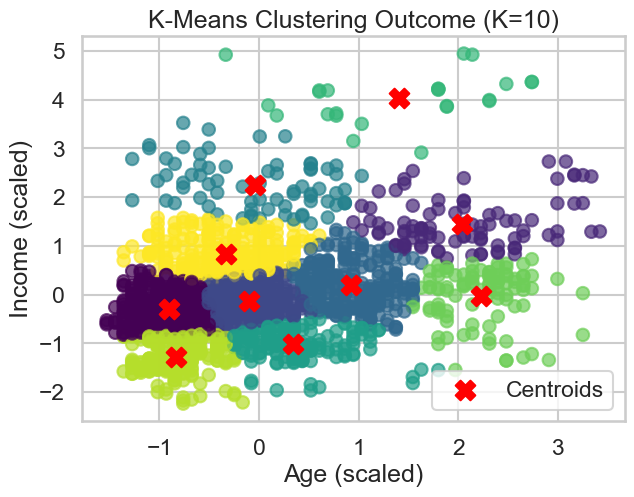

In [298]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt

inertias = []
silhouette_scores = []
K_range = range(2, 11)   # start from 2 because silhouette is not defined for K=1

for k in K_range:
    kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42, n_init=10)
    labels = kmeans.fit_predict(X_scaled)

    # store metrics
    inertias.append(kmeans.inertia_)
    silhouette_scores.append(silhouette_score(X_scaled, labels))

    # display clustering outcome for each K
    plt.figure(figsize=(7, 5))
    plt.scatter(
        X_scaled.iloc[:, 0],
        X_scaled.iloc[:, 1],
        c=labels,
        cmap='viridis',
        alpha=0.7
    )

    plt.scatter(
        kmeans.cluster_centers_[:, 0],
        kmeans.cluster_centers_[:, 1],
        color='red',
        marker='X',
        s=200,
        label='Centroids'
    )

    plt.xlabel("Age (scaled)")
    plt.ylabel("Income (scaled)")
    plt.title(f"K-Means Clustering Outcome (K={k})")
    plt.legend()
    plt.grid(True)
    plt.show()

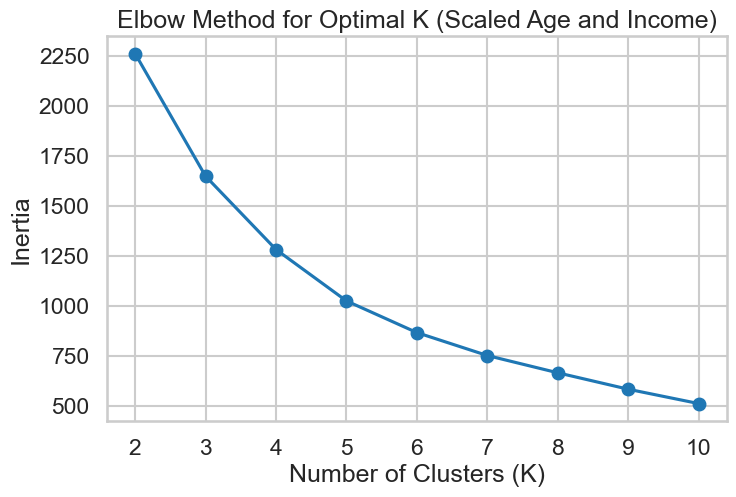

In [299]:
plt.figure(figsize=(8, 5))
plt.plot(K_range, inertias, marker='o')
plt.title("Elbow Method for Optimal K (Scaled Age and Income)")
plt.xlabel("Number of Clusters (K)")
plt.ylabel("Inertia")
plt.xticks(K_range)
plt.grid(True)
plt.show()

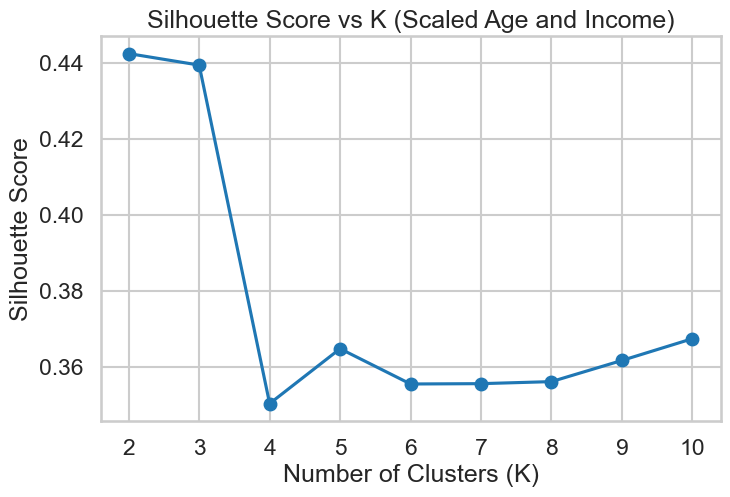

K = 2, Silhouette Score = 0.4424
K = 3, Silhouette Score = 0.4394
K = 4, Silhouette Score = 0.3503
K = 5, Silhouette Score = 0.3648
K = 6, Silhouette Score = 0.3555
K = 7, Silhouette Score = 0.3556
K = 8, Silhouette Score = 0.3561
K = 9, Silhouette Score = 0.3617
K = 10, Silhouette Score = 0.3674


In [300]:
plt.figure(figsize=(8, 5))
plt.plot(K_range, silhouette_scores, marker='o')
plt.title("Silhouette Score vs K (Scaled Age and Income)")
plt.xlabel("Number of Clusters (K)")
plt.ylabel("Silhouette Score")
plt.xticks(K_range)
plt.grid(True)
plt.show()

for k, score in zip(K_range, silhouette_scores):
    print(f"K = {k}, Silhouette Score = {score:.4f}")

From the elbow graph, 3 or 4 clusters looks nice

From the silhouette score 3 looks better tha 4

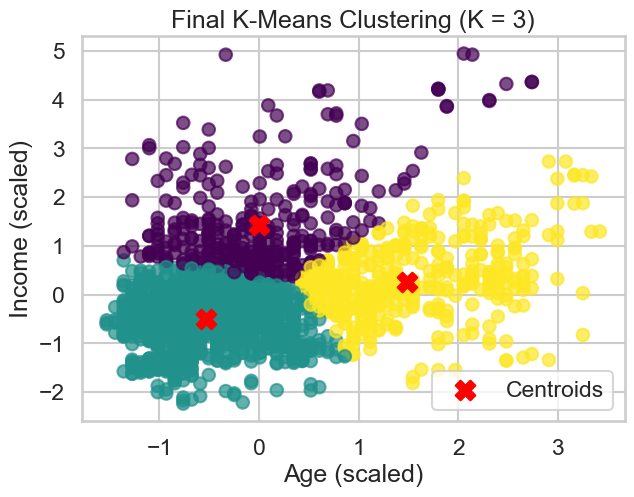

In [301]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# final model
kmeans_final = KMeans(n_clusters=3, init='k-means++', random_state=42, n_init=10)

labels_final = kmeans_final.fit_predict(X_scaled)

# plot clusters
plt.figure(figsize=(7,5))

plt.scatter(
    X_scaled.iloc[:,0],
    X_scaled.iloc[:,1],
    c=labels_final,
    cmap='viridis',
    alpha=0.7
)

# plot centroids
plt.scatter(
    kmeans_final.cluster_centers_[:,0],
    kmeans_final.cluster_centers_[:,1],
    color='red',
    marker='X',
    s=200,
    label='Centroids'
)

plt.xlabel("Age (scaled)")
plt.ylabel("Income (scaled)")
plt.title("Final K-Means Clustering (K = 3)")
plt.legend()
plt.grid(True)

plt.show()

7 features scaled kmeans

In [ ]:
#scale all 7 features
from sklearn.preprocessing import StandardScaler

scaler_all = StandardScaler()

X_all_scaled = scaler_all.fit_transform(X_all)   # X_all = your 7 selected features

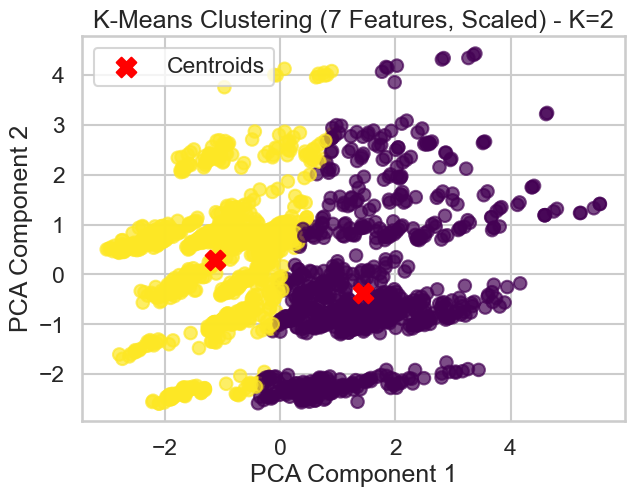

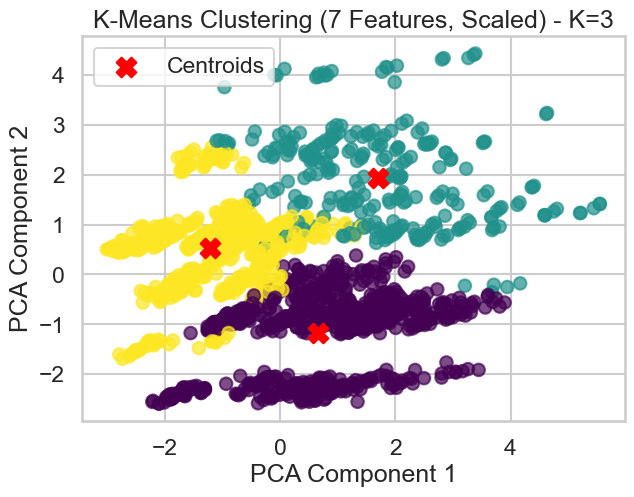

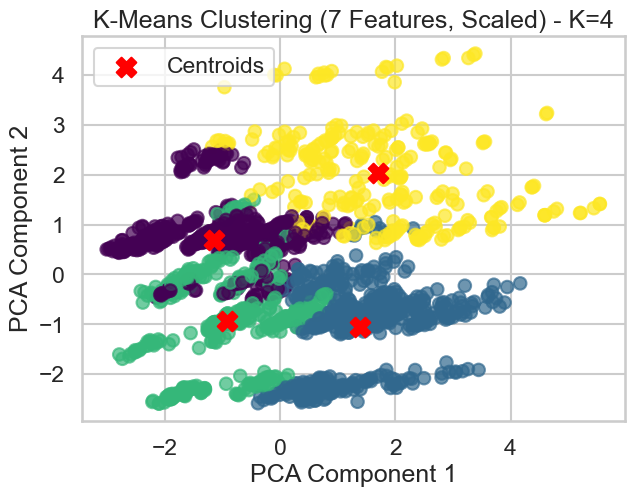

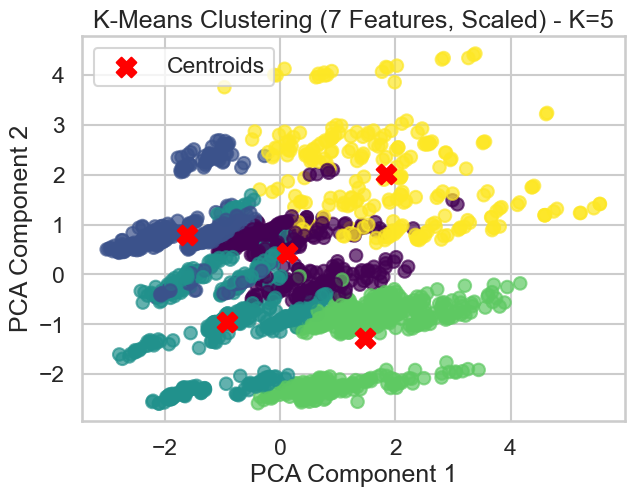

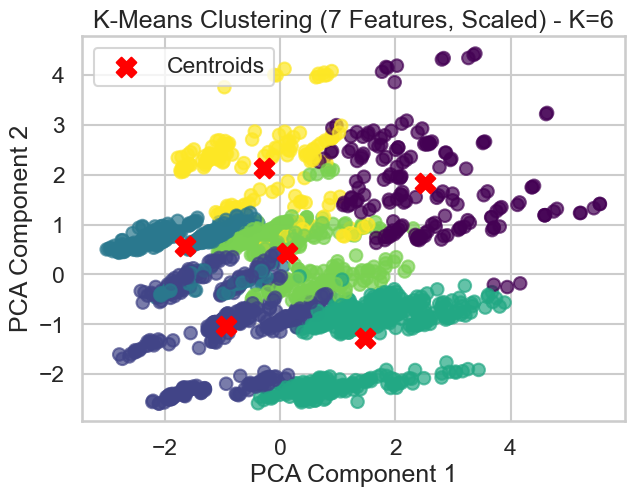

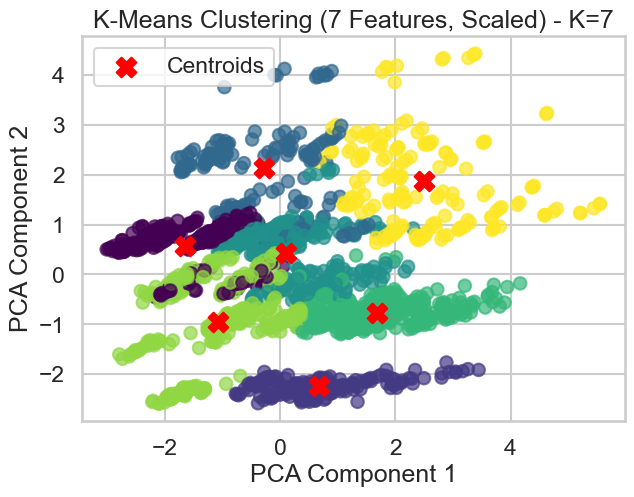

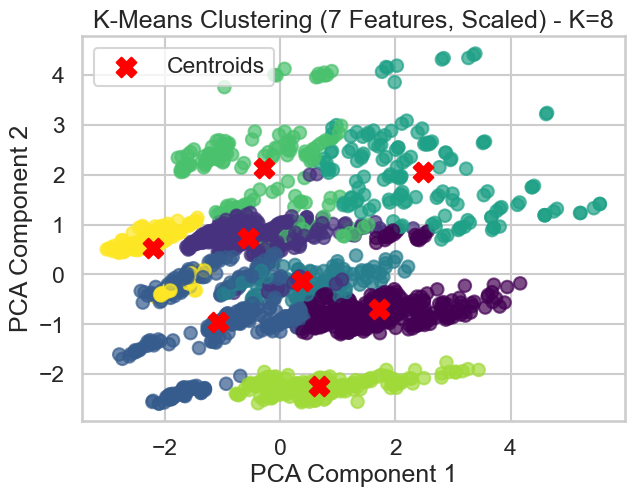

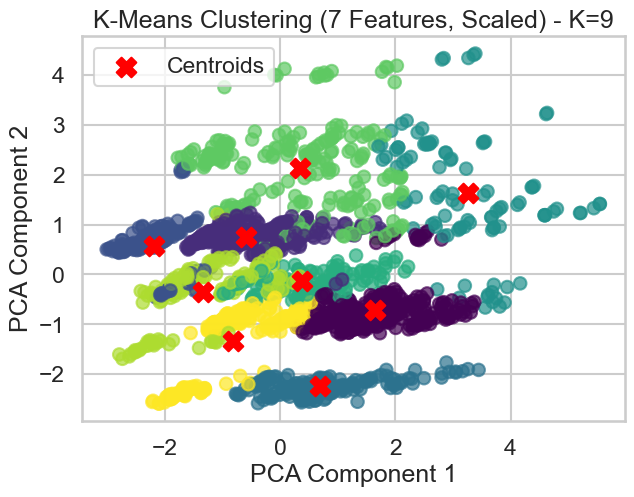

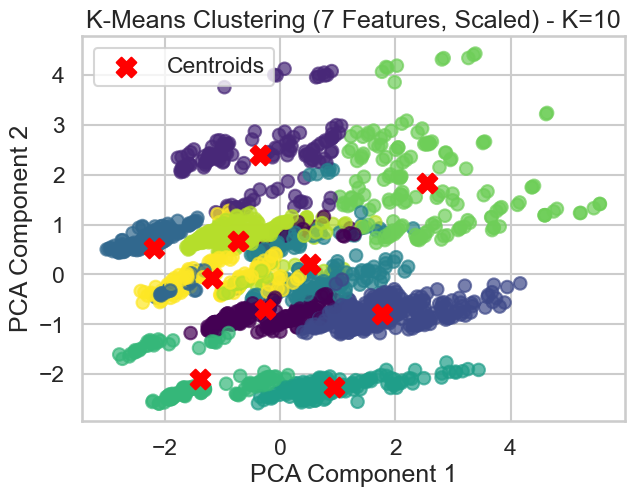

In [303]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

inertias_all = []
sil_scores_all = []

K_range = range(2, 11)

# PCA for visualization
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_all_scaled)

for k in K_range:
    
    kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42, n_init=10)
    labels = kmeans.fit_predict(X_all_scaled)

    inertias_all.append(kmeans.inertia_)
    sil_scores_all.append(silhouette_score(X_all_scaled, labels))

    # project centroids to PCA space
    centers_pca = pca.transform(kmeans.cluster_centers_)

    # plot
    plt.figure(figsize=(7,5))
    plt.scatter(X_pca[:,0], X_pca[:,1], c=labels, cmap='viridis', alpha=0.7)

    plt.scatter(
        centers_pca[:,0],
        centers_pca[:,1],
        c='red',
        marker='X',
        s=200,
        label='Centroids'
    )

    plt.title(f"K-Means Clustering (7 Features, Scaled) - K={k}")
    plt.xlabel("PCA Component 1")
    plt.ylabel("PCA Component 2")
    plt.legend()
    plt.grid(True)
    plt.show()

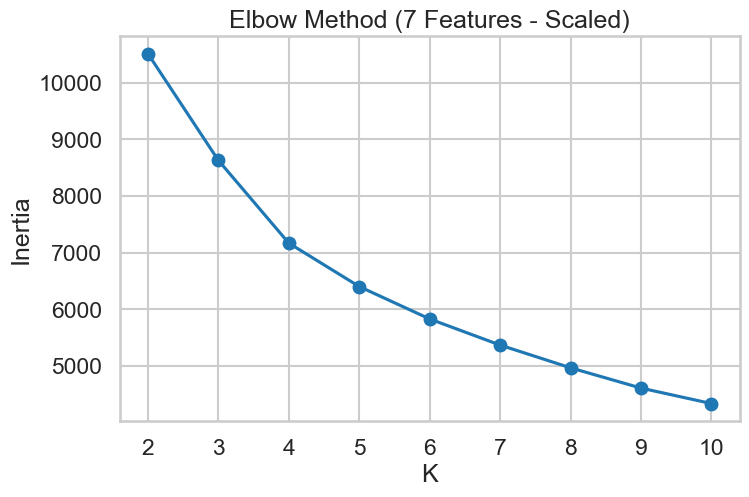

In [304]:
plt.figure(figsize=(8,5))
plt.plot(K_range, inertias_all, marker='o')

plt.title("Elbow Method (7 Features - Scaled)")
plt.xlabel("K")
plt.ylabel("Inertia")
plt.xticks(K_range)
plt.grid(True)

plt.show()

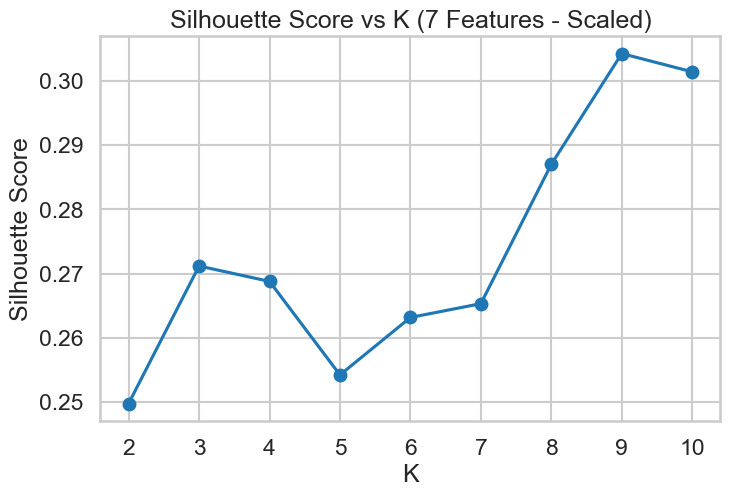

K = 2, Silhouette = 0.2498
K = 3, Silhouette = 0.2712
K = 4, Silhouette = 0.2688
K = 5, Silhouette = 0.2542
K = 6, Silhouette = 0.2632
K = 7, Silhouette = 0.2653
K = 8, Silhouette = 0.2870
K = 9, Silhouette = 0.3042
K = 10, Silhouette = 0.3014


In [305]:
plt.figure(figsize=(8,5))
plt.plot(K_range, sil_scores_all, marker='o')

plt.title("Silhouette Score vs K (7 Features - Scaled)")
plt.xlabel("K")
plt.ylabel("Silhouette Score")
plt.xticks(K_range)
plt.grid(True)

plt.show()

for k, score in zip(K_range, sil_scores_all):
    print(f"K = {k}, Silhouette = {score:.4f}")

for the clustering using the 2 most informative features age and income:


@k=3, s=0.4394 (satisfying the elbow then the silhouette score)


note: @k=9, s=0.3617 


for the clustering using the 7 features:


@k=3, s=0.2712 which is reasonable and satisfies the elbow graph


@k=9, s=0.3042 which is a better silhouette score

Agglomorative 

#try hierarchial combinations scaled

In [306]:
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler
import pandas as pd
import numpy as np

# Scale all 7 features
scaler_threshold = StandardScaler()
X_all_scaled_threshold = scaler_threshold.fit_transform(X_all)

metrics_threshold = ['euclidean', 'manhattan', 'cosine']
linkages_threshold = ['complete', 'average', 'single', 'ward']
distance_threshold_values = [2, 4, 6, 8, 10, 12, 15, 18, 20]

results_threshold = []

for threshold in distance_threshold_values:
    for metric in metrics_threshold:
        for linkage in linkages_threshold:

            # ward only works with euclidean
            if linkage == 'ward' and metric != 'euclidean':
                continue

            model = AgglomerativeClustering(
                n_clusters=None,
                distance_threshold=threshold,
                metric=metric,
                linkage=linkage,
                compute_full_tree=True
            )

            labels = model.fit_predict(X_all_scaled_threshold)

            # number of resulting clusters
            n_clusters = len(np.unique(labels))

            # silhouette is only valid if there is more than one cluster
            # and less than the number of samples
            if 1 < n_clusters < len(X_all_scaled_threshold):
                score = silhouette_score(X_all_scaled_threshold, labels)
            else:
                score = np.nan

            results_threshold.append({
                "Distance_Threshold": threshold,
                "Metric": metric,
                "Linkage": linkage,
                "Num_Clusters": n_clusters,
                "Silhouette": score
            })

results_threshold_df = pd.DataFrame(results_threshold)
results_threshold_df = results_threshold_df.sort_values(
    by=["Silhouette", "Num_Clusters"],
    ascending=[False, True]
)

results_threshold_df

,Distance_Threshold,Metric,Linkage,Num_Clusters,Silhouette
5,2,manhattan,average,108,0.464149
14,4,manhattan,complete,73,0.458447
3,2,euclidean,ward,189,0.446813
23,6,euclidean,ward,56,0.442116
4,2,manhattan,complete,176,0.442017
...,...,...,...,...,...
85,20,manhattan,average,1,NaN
86,20,manhattan,single,1,NaN
87,20,cosine,complete,1,NaN
88,20,cosine,average,1,NaN


In [307]:
# =========================================================
# AGGLOMERATIVE CLUSTERING - 2 FEATURES (Age, Income) - SCALED
# Try different K, metric, and linkage combinations
# =========================================================

from sklearn.preprocessing import StandardScaler
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score
import pandas as pd

# Select the 2 features
X_hier_2 = df[['Age', 'Income']]

# Scale the 2 features
scaler_hier_2 = StandardScaler()
X_hier_2_scaled = scaler_hier_2.fit_transform(X_hier_2)

# Parameters to try
metrics_hier_2 = ['euclidean', 'manhattan', 'cosine']
linkages_hier_2 = ['complete', 'average', 'single', 'ward']
k_values_hier_2 = range(2, 11)

results_hier_2 = []

for k in k_values_hier_2:
    for metric in metrics_hier_2:
        for linkage_method in linkages_hier_2:

            # Ward linkage only works with Euclidean distance
            if linkage_method == 'ward' and metric != 'euclidean':
                continue

            model_hier_2 = AgglomerativeClustering(
                n_clusters=k,
                metric=metric,
                linkage=linkage_method
            )

            labels_hier_2 = model_hier_2.fit_predict(X_hier_2_scaled)
            score_hier_2 = silhouette_score(X_hier_2_scaled, labels_hier_2)

            results_hier_2.append({
                "K": k,
                "Metric": metric,
                "Linkage": linkage_method,
                "Silhouette": score_hier_2
            })

results_hier_2_df = pd.DataFrame(results_hier_2)
results_hier_2_df = results_hier_2_df.sort_values(
    by="Silhouette",
    ascending=False
).reset_index(drop=True)

display(results_hier_2_df)

,K,Metric,Linkage,Silhouette
0,2,euclidean,single,0.642018
1,2,manhattan,single,0.642018
2,3,manhattan,single,0.621973
3,3,euclidean,single,0.621973
4,4,manhattan,single,0.613701
...,...,...,...,...
85,9,cosine,complete,0.136252
86,9,cosine,single,0.081461
87,7,cosine,single,0.076928
88,8,cosine,single,0.075233


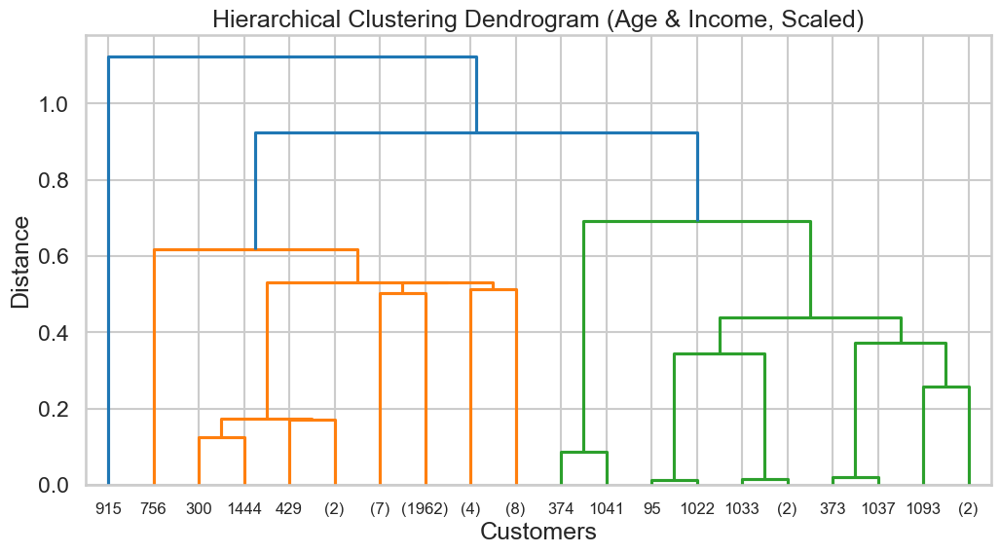

In [308]:
# =========================================================
# DENDROGRAM - 2 FEATURES (Age, Income) - SCALED
# For the selected linkage configuration: Euclidean + Single
# =========================================================

from scipy.cluster.hierarchy import linkage, dendrogram
import matplotlib.pyplot as plt

# Build the hierarchical linkage matrix
linked_2features = linkage(
    X_hier_2_scaled,
    method='single',
    metric='euclidean'
)

# Plot dendrogram
plt.figure(figsize=(12, 6))

dendrogram(
    linked_2features,
    truncate_mode='level',
    p=5
)

plt.title("Hierarchical Clustering Dendrogram (Age & Income, Scaled)")
plt.xlabel("Customers")
plt.ylabel("Distance")

plt.show()

Although the dendrogram may visually suggest another possible cut, the final configuration was selected based on the silhouette score, which favored K = 2.

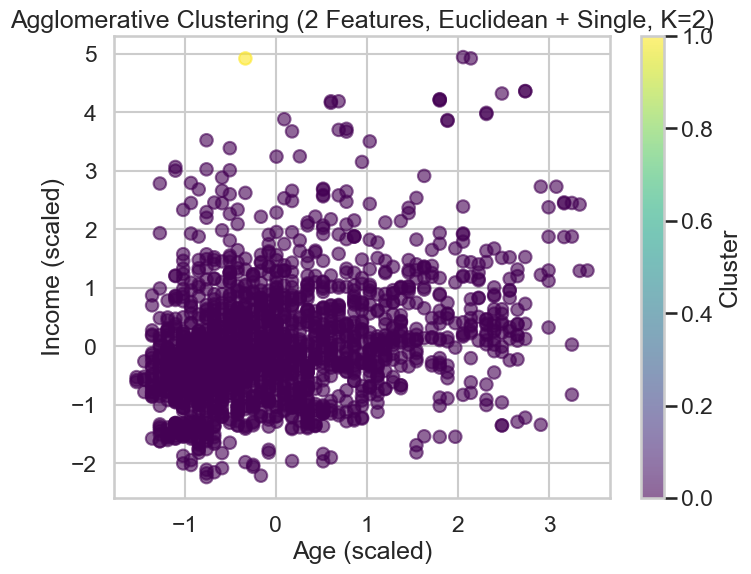

AggCluster_2Features
0    1999
1       1
Name: count, dtype: int64


In [309]:
# =========================================================
# FINAL AGGLOMERATIVE MODEL - 2 FEATURES (Age, Income) - SCALED
# Selected configuration: Euclidean + Single + K = 2
# =========================================================

from sklearn.cluster import AgglomerativeClustering
import matplotlib.pyplot as plt

agg_model_2 = AgglomerativeClustering(
    n_clusters=2,
    metric='euclidean',
    linkage='single'
)

# Fit model and store cluster labels
df['AggCluster_2Features'] = agg_model_2.fit_predict(X_hier_2_scaled)

# Plot the clusters
plt.figure(figsize=(8, 6))

scatter = plt.scatter(
    X_hier_2_scaled[:, 0],
    X_hier_2_scaled[:, 1],
    c=df['AggCluster_2Features'],
    cmap='viridis',
    alpha=0.6
)

plt.title("Agglomerative Clustering (2 Features, Euclidean + Single, K=2)")
plt.xlabel("Age (scaled)")
plt.ylabel("Income (scaled)")
plt.colorbar(scatter, label="Cluster")
plt.grid(True)

plt.show()

# Show cluster sizes
print(df['AggCluster_2Features'].value_counts().sort_index())

In [310]:
# =========================================================
# AGGLOMERATIVE CLUSTERING - 7 FEATURES - SCALED
# Try different K, metric, and linkage combinations
# =========================================================

from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler
import pandas as pd

# Scale all 7 features
scaler_all = StandardScaler()
X_all_scaled = scaler_all.fit_transform(X_all)

metrics_all = ['euclidean', 'manhattan', 'cosine']
linkages_all = ['complete', 'average', 'single', 'ward']
k_values_all = range(2, 11)

results_all = []

for k in k_values_all:
    for metric in metrics_all:
        for linkage_method in linkages_all:

            # Ward linkage only works with Euclidean distance
            if linkage_method == 'ward' and metric != 'euclidean':
                continue

            model_all = AgglomerativeClustering(
                n_clusters=k,
                metric=metric,
                linkage=linkage_method
            )

            labels_all = model_all.fit_predict(X_all_scaled)
            score_all = silhouette_score(X_all_scaled, labels_all)

            results_all.append({
                "K": k,
                "Metric": metric,
                "Linkage": linkage_method,
                "Silhouette": score_all
            })

results_all_df = pd.DataFrame(results_all)
results_all_df = results_all_df.sort_values(
    by="Silhouette",
    ascending=False
).reset_index(drop=True)

display(results_all_df)

,K,Metric,Linkage,Silhouette
0,2,euclidean,average,0.396970
1,2,manhattan,single,0.349167
2,2,euclidean,single,0.349167
3,3,euclidean,single,0.315911
4,10,euclidean,ward,0.312866
...,...,...,...,...
85,8,cosine,single,-0.180429
86,10,cosine,single,-0.185177
87,5,cosine,single,-0.194018
88,6,cosine,single,-0.204678


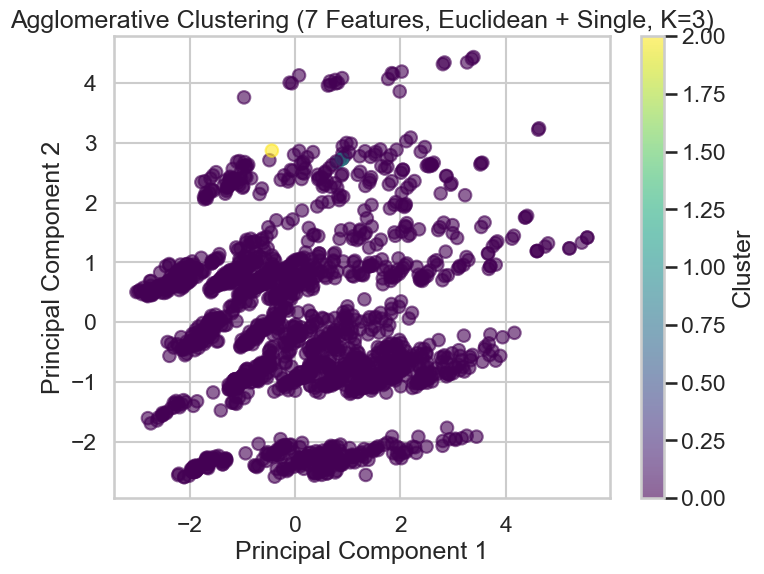

AggCluster_7Features
0    1997
1       2
2       1
Name: count, dtype: int64


In [311]:
# =========================================================
# FINAL AGGLOMERATIVE MODEL - 7 FEATURES - SCALED
# Selected configuration: Euclidean + Single + K = 3
# =========================================================

from sklearn.cluster import AgglomerativeClustering
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

agg_model_7 = AgglomerativeClustering(
    n_clusters=3,
    metric='euclidean',
    linkage='single'
)

# Fit model and store labels
df['AggCluster_7Features'] = agg_model_7.fit_predict(X_all_scaled)

# PCA projection for visualization
pca_7 = PCA(n_components=2)
X_all_pca = pca_7.fit_transform(X_all_scaled)

# Plot clusters in PCA space
plt.figure(figsize=(8, 6))

scatter = plt.scatter(
    X_all_pca[:, 0],
    X_all_pca[:, 1],
    c=df['AggCluster_7Features'],
    cmap='viridis',
    alpha=0.6
)

plt.title("Agglomerative Clustering (7 Features, Euclidean + Single, K=3)")
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.colorbar(scatter, label="Cluster")
plt.grid(True)

plt.show()

# Display cluster sizes
print(df['AggCluster_7Features'].value_counts().sort_index())

Single linkage merges clusters based on the closest pair of points between clusters. Therefore the result is very bad containing most of the data in one cluster, this should be rejected

Trying out euclidean average

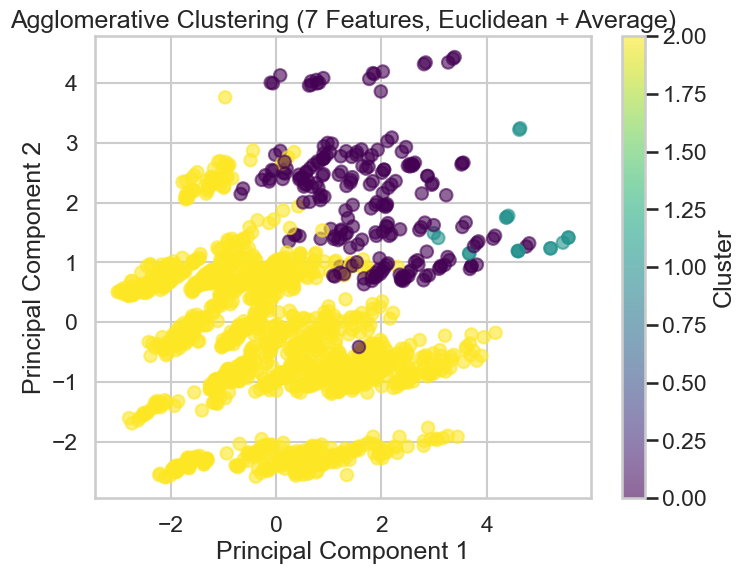

AggCluster_7Features_avg
0     218
1      17
2    1765
Name: count, dtype: int64


In [228]:
# Display clusters for 7-feature hierarchical clustering (Euclidean + Average, K=3)

from sklearn.cluster import AgglomerativeClustering
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

agg_model_7_avg = AgglomerativeClustering(
    n_clusters=3,
    metric='euclidean',
    linkage='average'
)

df['AggCluster_7Features_avg'] = agg_model_7_avg.fit_predict(X_all_scaled)

# PCA projection for visualization
pca_7 = PCA(n_components=2)
X_all_pca = pca_7.fit_transform(X_all_scaled)

plt.figure(figsize=(8,6))

scatter = plt.scatter(
    X_all_pca[:,0],
    X_all_pca[:,1],
    c=df['AggCluster_7Features_avg'],
    cmap='viridis',
    alpha=0.6
)

plt.title("Agglomerative Clustering (7 Features, Euclidean + Average)")
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.colorbar(scatter, label="Cluster")

plt.show()

print(df['AggCluster_7Features_avg'].value_counts().sort_index())

In [312]:
# =========================================================
# SILHOUETTE SCORE - 7 FEATURES (Euclidean + Average, K=3)
# =========================================================

from sklearn.metrics import silhouette_score

silhouette_7_avg = silhouette_score(
    X_all_scaled,
    df['AggCluster_7Features_avg']
)

print("Silhouette Score (7 Features, Euclidean + Average, K=3):", silhouette_7_avg)

Silhouette Score (7 Features, Euclidean + Average, K=3): 0.2551064475794948


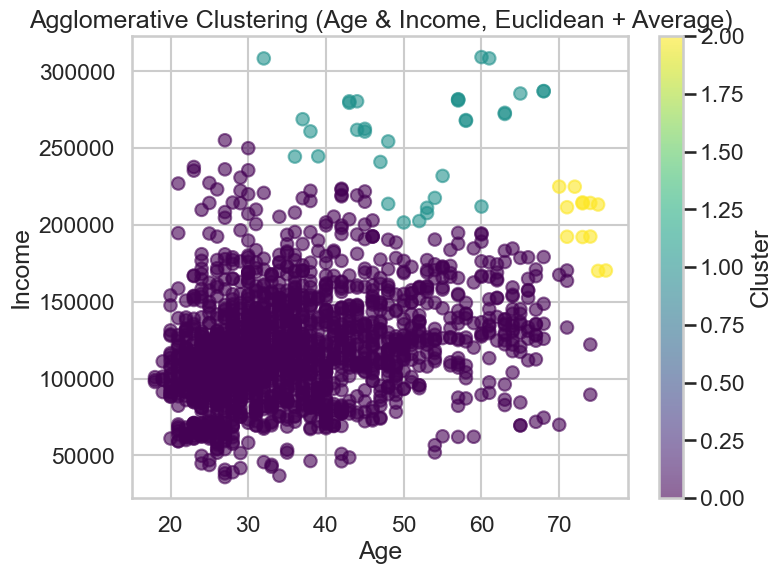

AggCluster_2Features_avg
0    1955
1      33
2      12
Name: count, dtype: int64


In [229]:
# Display clusters for 2-feature hierarchical clustering (Age & Income, Euclidean + Average, K=3)

from sklearn.cluster import AgglomerativeClustering
import matplotlib.pyplot as plt

agg_model_2_avg = AgglomerativeClustering(
    n_clusters=3,
    metric='euclidean',
    linkage='average'
)

df['AggCluster_2Features_avg'] = agg_model_2_avg.fit_predict(X_hier_2_scaled)

plt.figure(figsize=(8,6))

scatter = plt.scatter(
    df['Age'],
    df['Income'],
    c=df['AggCluster_2Features_avg'],
    cmap='viridis',
    alpha=0.6
)

plt.title("Agglomerative Clustering (Age & Income, Euclidean + Average)")
plt.xlabel("Age")
plt.ylabel("Income")
plt.colorbar(scatter, label="Cluster")

plt.show()

print(df['AggCluster_2Features_avg'].value_counts().sort_index())

In [313]:
# =========================================================
# SILHOUETTE SCORE - 2 FEATURES (Age & Income, Euclidean + Average, K=3)
# =========================================================

from sklearn.metrics import silhouette_score

silhouette_2_avg = silhouette_score(
    X_hier_2_scaled,
    df['AggCluster_2Features_avg']
)

print("Silhouette Score (2 Features, Euclidean + Average, K=3):", silhouette_2_avg)

Silhouette Score (2 Features, Euclidean + Average, K=3): 0.5358930407548949


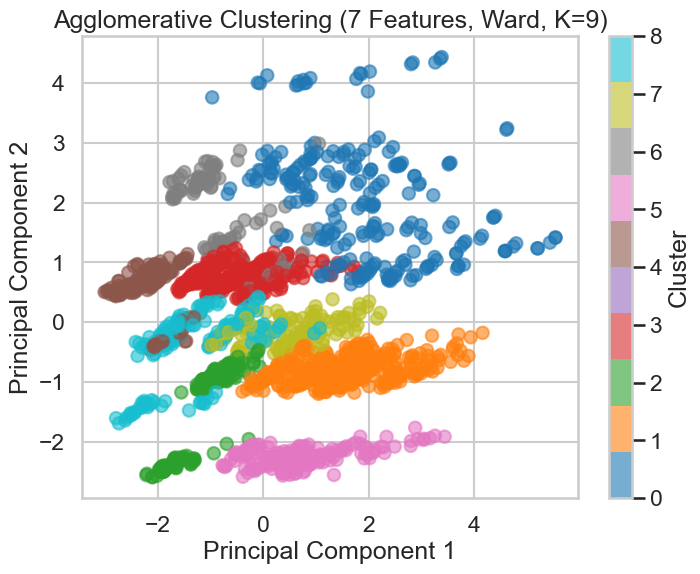

AggCluster_7Features_ward10
0    241
1    390
2    169
3    378
4    229
5    189
6     91
7    153
8    160
Name: count, dtype: int64


In [237]:
# Agglomerative clustering (7 features, Ward linkage, K=9) (euclidean)

from sklearn.cluster import AgglomerativeClustering
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

agg_model_7_ward = AgglomerativeClustering(
    n_clusters=9,
    linkage='ward'
)

df['AggCluster_7Features_ward10'] = agg_model_7_ward.fit_predict(X_all_scaled)

# PCA projection for visualization
pca_7 = PCA(n_components=2)
X_all_pca = pca_7.fit_transform(X_all_scaled)

plt.figure(figsize=(8,6))

scatter = plt.scatter(
    X_all_pca[:,0],
    X_all_pca[:,1],
    c=df['AggCluster_7Features_ward10'],
    cmap='tab10',
    alpha=0.6
)

plt.title("Agglomerative Clustering (7 Features, Ward, K=9)")
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.colorbar(scatter, label="Cluster")

plt.show()

print(df['AggCluster_7Features_ward10'].value_counts().sort_index())

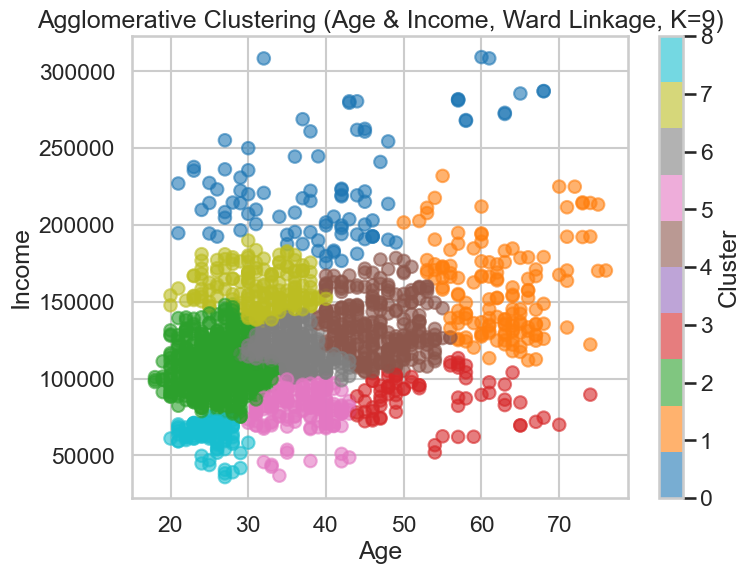

AggCluster_2Features_ward7
0     93
1    144
2    635
3     72
4    278
5    174
6    296
7    191
8    117
Name: count, dtype: int64


In [238]:

# Agglomerative clustering (Age & Income, Ward linkage, K=9)

from sklearn.cluster import AgglomerativeClustering
import matplotlib.pyplot as plt

agg_model_2_ward7 = AgglomerativeClustering(
    n_clusters=9,
    linkage='ward'
)

df['AggCluster_2Features_ward7'] = agg_model_2_ward7.fit_predict(X_hier_2_scaled)

plt.figure(figsize=(8,6))

scatter = plt.scatter(
    df['Age'],
    df['Income'],
    c=df['AggCluster_2Features_ward7'],
    cmap='tab10',
    alpha=0.6
)

plt.title("Agglomerative Clustering (Age & Income, Ward Linkage, K=9)")
plt.xlabel("Age")
plt.ylabel("Income")
plt.colorbar(scatter, label="Cluster")

plt.show()

# Display cluster sizes
print(df['AggCluster_2Features_ward7'].value_counts().sort_index())

In [239]:
from sklearn.metrics import silhouette_score

# Silhouette score for 7 features (Ward, K=9)
silhouette_7features_ward10 = silhouette_score(
    X_all_scaled,
    df['AggCluster_7Features_ward10']
)

print("Silhouette Score (7 Features, Ward, K=9):", round(silhouette_7features_ward10, 4))


# Silhouette score for 2 features (Ward, K=9)
silhouette_2features_ward10 = silhouette_score(
    X_hier_2_scaled,
    df['AggCluster_2Features_ward7']
)

print("Silhouette Score (Age & Income, Ward, K=9):", round(silhouette_2features_ward10, 4))

Silhouette Score (7 Features, Ward, K=9): 0.3016
Silhouette Score (Age & Income, Ward, K=9): 0.3216


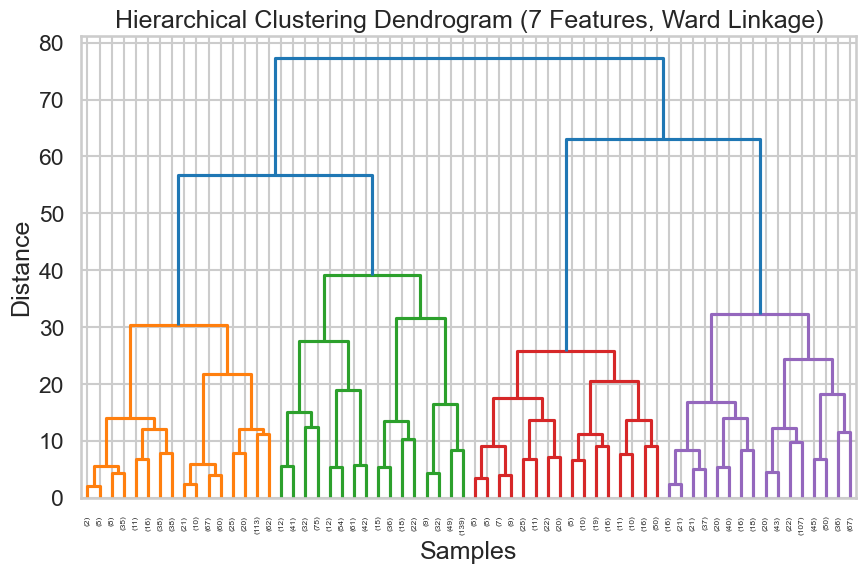

In [240]:
# Dendrogram for Agglomerative Clustering (7 features, Ward linkage)

from scipy.cluster.hierarchy import linkage, dendrogram
import matplotlib.pyplot as plt

# Compute hierarchical linkage matrix
linked_ward = linkage(
    X_all_scaled,
    method='ward'
)

plt.figure(figsize=(10,6))

dendrogram(
    linked_ward,
    truncate_mode='level',   # keeps the dendrogram readable
    p=5
)

plt.title("Hierarchical Clustering Dendrogram (7 Features, Ward Linkage)")
plt.xlabel("Samples")
plt.ylabel("Distance")

plt.show()

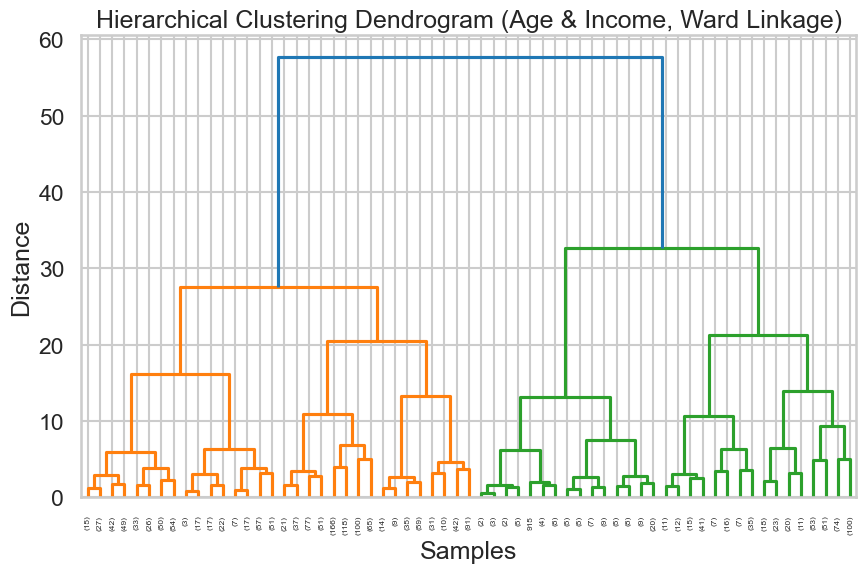

In [241]:
# Dendrogram for Agglomerative Clustering (2 features: Age & Income, Ward linkage)

from scipy.cluster.hierarchy import linkage, dendrogram
import matplotlib.pyplot as plt

# Compute hierarchical linkage matrix for the 2 scaled features
linked_ward_2 = linkage(
    X_hier_2_scaled,
    method='ward'
)

plt.figure(figsize=(10,6))

dendrogram(
    linked_ward_2,
    truncate_mode='level',   # keeps the plot readable
    p=5
)

plt.title("Hierarchical Clustering Dendrogram (Age & Income, Ward Linkage)")
plt.xlabel("Samples")
plt.ylabel("Distance")

plt.show()

Silhouette Score (7 Features, Ward, K=4): 0.2508


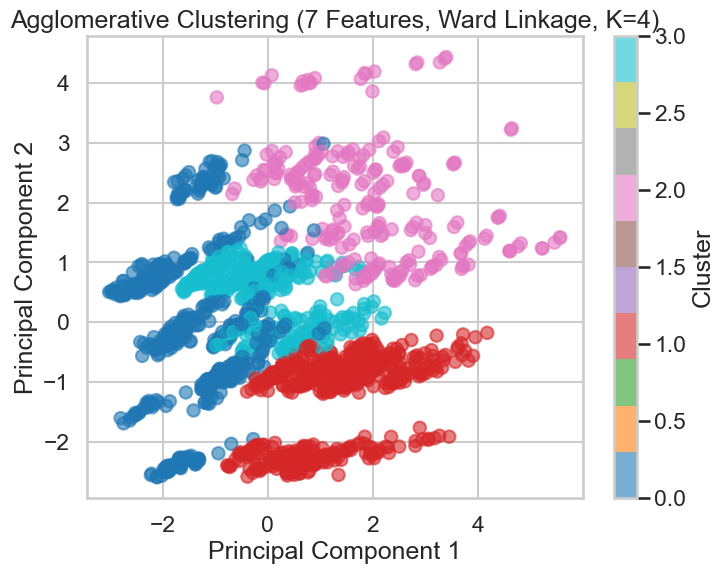

AggCluster_7Features_ward4
0    649
1    579
2    241
3    531
Name: count, dtype: int64


In [243]:
# Agglomerative clustering (7 features, Ward linkage, K=4)

from sklearn.cluster import AgglomerativeClustering
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt

agg_model_7_ward4 = AgglomerativeClustering(
    n_clusters=4,
    linkage='ward'   # Ward uses Euclidean distance internally
)

df['AggCluster_7Features_ward4'] = agg_model_7_ward4.fit_predict(X_all_scaled)

# Silhouette score
silhouette_7features_ward4 = silhouette_score(
    X_all_scaled,
    df['AggCluster_7Features_ward4']
)

print("Silhouette Score (7 Features, Ward, K=4):", round(silhouette_7features_ward4, 4))

# PCA projection for visualization
pca_7_ward4 = PCA(n_components=2)
X_all_pca_ward4 = pca_7_ward4.fit_transform(X_all_scaled)

plt.figure(figsize=(8,6))

scatter = plt.scatter(
    X_all_pca_ward4[:,0],
    X_all_pca_ward4[:,1],
    c=df['AggCluster_7Features_ward4'],
    cmap='tab10',
    alpha=0.6
)

plt.title("Agglomerative Clustering (7 Features, Ward Linkage, K=4)")
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.colorbar(scatter, label="Cluster")

plt.show()

print(df['AggCluster_7Features_ward4'].value_counts().sort_index())

To conclude the analysis, i will stick to these:

Silhouette Score (7 Features, Ward, K=9): 0.3016

Silhouette Score (Age & Income, Ward, K=9): 0.3216

the 9 clusters is also consistent with the silhouettes of the k-means

Unscaled agglomorative

In [244]:
# Unscaled 7-feature dataset for Agglomerative Clustering

X_all_unscaled = df[['Sex', 'Marital status', 'Age', 'Education', 'Income', 'Occupation', 'Settlement size']].copy()

print("Unscaled data shape:", X_all_unscaled.shape)
display(X_all_unscaled.head())

Unscaled data shape: (2000, 7)


,Sex,Marital status,Age,Education,Income,Occupation,Settlement size
0,0,0,67,2,124670,1,2
1,1,1,22,1,150773,1,2
2,0,0,49,1,89210,0,0
3,0,0,45,1,171565,1,1
4,0,0,53,1,149031,1,1


In [245]:
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score
import pandas as pd

affinities_unscaled = ['euclidean', 'manhattan', 'cosine']
linkages_unscaled = ['complete', 'average', 'single', 'ward']
k_values_unscaled = range(2, 11)

results_unscaled = []

for k in k_values_unscaled:
    for affinity in affinities_unscaled:
        for linkage_method in linkages_unscaled:

            # Ward linkage only works with Euclidean distance
            if linkage_method == 'ward' and affinity != 'euclidean':
                continue

            model_unscaled = AgglomerativeClustering(
                n_clusters=k,
                metric=affinity,
                linkage=linkage_method
            )

            labels_unscaled = model_unscaled.fit_predict(X_all_unscaled)
            score_unscaled = silhouette_score(X_all_unscaled, labels_unscaled)

            results_unscaled.append({
                "K": k,
                "Affinity": affinity,
                "Linkage": linkage_method,
                "Silhouette": score_unscaled
            })

results_unscaled_df = pd.DataFrame(results_unscaled)
results_unscaled_df = results_unscaled_df.sort_values("Silhouette", ascending=False).reset_index(drop=True)

display(results_unscaled_df)

,K,Affinity,Linkage,Silhouette
0,2,euclidean,single,0.758568
1,2,manhattan,single,0.758568
2,2,euclidean,average,0.729309
3,3,manhattan,single,0.727572
4,3,euclidean,single,0.727572
...,...,...,...,...
85,9,cosine,complete,-0.177350
86,10,cosine,average,-0.179623
87,10,cosine,single,-0.191626
88,8,cosine,single,-0.193140


In [246]:
positive_results_unscaled = results_unscaled_df[results_unscaled_df["Silhouette"] > 0]

print("Top configurations with positive silhouette scores (unscaled data):")
display(positive_results_unscaled.head(10))

best_config_unscaled = positive_results_unscaled.iloc[0]

best_k_hier_unscaled = best_config_unscaled["K"]
best_affinity_hier_unscaled = best_config_unscaled["Affinity"]
best_linkage_hier_unscaled = best_config_unscaled["Linkage"]
best_silhouette_hier_unscaled = best_config_unscaled["Silhouette"]

print("Best hierarchical clustering configuration (unscaled data):")
print("K =", best_k_hier_unscaled)
print("Affinity =", best_affinity_hier_unscaled)
print("Linkage =", best_linkage_hier_unscaled)
print("Silhouette Score =", round(best_silhouette_hier_unscaled, 4))

Top configurations with positive silhouette scores (unscaled data):


,K,Affinity,Linkage,Silhouette
0,2,euclidean,single,0.758568
1,2,manhattan,single,0.758568
2,2,euclidean,average,0.729309
3,3,manhattan,single,0.727572
4,3,euclidean,single,0.727572
5,4,manhattan,single,0.703858
6,4,euclidean,single,0.703858
7,2,euclidean,complete,0.688661
8,2,manhattan,average,0.685783
9,6,euclidean,single,0.675684


Best hierarchical clustering configuration (unscaled data):
K = 2
Affinity = euclidean
Linkage = single
Silhouette Score = 0.7586


In [248]:
# Filter useful configurations

# Keep only positive silhouette scores
filtered_unscaled_df = results_unscaled_df[results_unscaled_df["Silhouette"] > 0]

# Optionally remove 'single' linkage (often produces chaining effect)
filtered_unscaled_df = filtered_unscaled_df[filtered_unscaled_df["Linkage"] != "single"]

# Sort again after filtering
filtered_unscaled_df = filtered_unscaled_df.sort_values("Silhouette", ascending=False).reset_index(drop=True)

print("Filtered results (positive silhouettes, without single linkage):")
display(filtered_unscaled_df)

Filtered results (positive silhouettes, without single linkage):


,K,Affinity,Linkage,Silhouette
0,2,euclidean,average,0.729309
1,2,euclidean,complete,0.688661
2,2,manhattan,average,0.685783
3,2,manhattan,complete,0.659463
4,3,manhattan,average,0.617315
5,3,euclidean,average,0.570893
6,2,euclidean,ward,0.568221
7,5,manhattan,complete,0.539692
8,4,manhattan,average,0.533594
9,5,manhattan,average,0.532972


Silhouette Score (7 Features, Unscaled, Ward, K=9): 0.5078


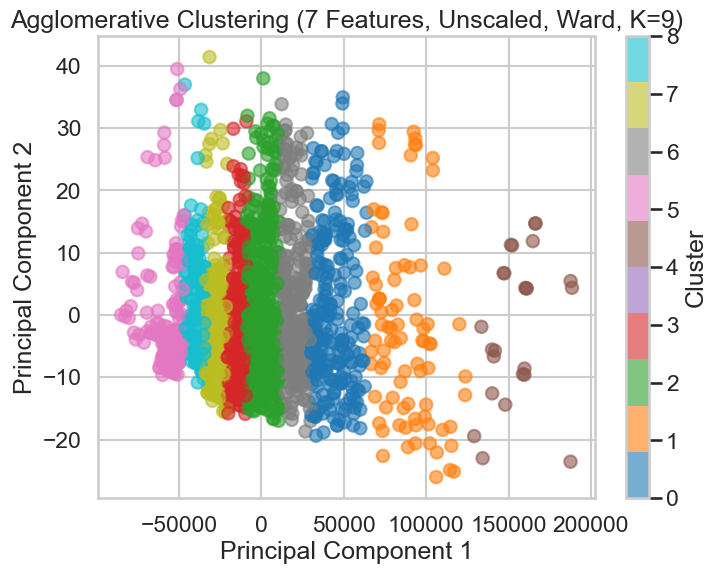

AggCluster_7Features_unscaled_ward9
0    236
1     86
2    500
3    339
4     24
5    168
6    255
7    247
8    145
Name: count, dtype: int64


In [247]:
# Agglomerative clustering (7 features, unscaled, Ward linkage, K=9)

from sklearn.cluster import AgglomerativeClustering
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt

agg_model_7_unscaled_ward9 = AgglomerativeClustering(
    n_clusters=9,
    linkage='ward'   # Ward uses Euclidean distance internally
)

df['AggCluster_7Features_unscaled_ward9'] = agg_model_7_unscaled_ward9.fit_predict(X_all_unscaled)

# Silhouette score
silhouette_7features_unscaled_ward9 = silhouette_score(
    X_all_unscaled,
    df['AggCluster_7Features_unscaled_ward9']
)

print("Silhouette Score (7 Features, Unscaled, Ward, K=9):", round(silhouette_7features_unscaled_ward9, 4))

# PCA projection for visualization only
pca_7_unscaled_ward9 = PCA(n_components=2)
X_all_pca_unscaled_ward9 = pca_7_unscaled_ward9.fit_transform(X_all_unscaled)

plt.figure(figsize=(8,6))

scatter = plt.scatter(
    X_all_pca_unscaled_ward9[:, 0],
    X_all_pca_unscaled_ward9[:, 1],
    c=df['AggCluster_7Features_unscaled_ward9'],
    cmap='tab10',
    alpha=0.6
)

plt.title("Agglomerative Clustering (7 Features, Unscaled, Ward, K=9)")
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.colorbar(scatter, label="Cluster")

plt.show()

print(df['AggCluster_7Features_unscaled_ward9'].value_counts().sort_index())

Silhouette Score (2 Features, Unscaled, Ward): 0.5318


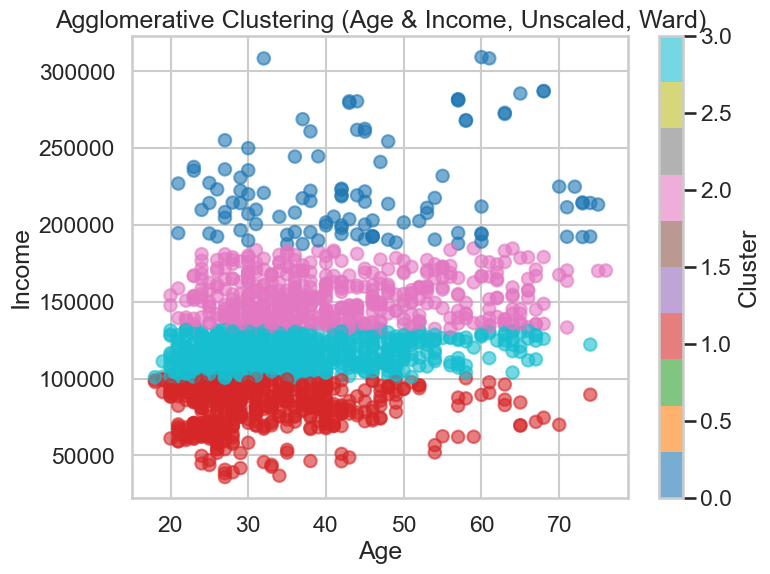

AggCluster_2Features_unscaled_ward
0    110
1    560
2    491
3    839
Name: count, dtype: int64


In [249]:
# Agglomerative clustering (2 features, Ward linkage)

from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt

agg_model_2_unscaled_ward = AgglomerativeClustering(
    n_clusters=4,
    linkage='ward'
)

df['AggCluster_2Features_unscaled_ward'] = agg_model_2_unscaled_ward.fit_predict(X_hier_2)

# Silhouette score
silhouette_2features_unscaled_ward = silhouette_score(
    X_hier_2,
    df['AggCluster_2Features_unscaled_ward']
)

print("Silhouette Score (2 Features, Unscaled, Ward):", round(silhouette_2features_unscaled_ward,4))

# Plot clusters
plt.figure(figsize=(8,6))

scatter = plt.scatter(
    df['Age'],
    df['Income'],
    c=df['AggCluster_2Features_unscaled_ward'],
    cmap='tab10',
    alpha=0.6
)

plt.title("Agglomerative Clustering (Age & Income, Unscaled, Ward)")
plt.xlabel("Age")
plt.ylabel("Income")
plt.colorbar(scatter, label="Cluster")

plt.show()

# Cluster sizes
print(df['AggCluster_2Features_unscaled_ward'].value_counts().sort_index())

having the data unscaled makes the income affect the data most, due to its large numbers

DBSCAN

In [314]:
# =========================================================
# BLOCK 1 - DBSCAN PARAMETER SEARCH (7 FEATURES, SCALED)
# Tries different EPS and min_samples values
# Silhouette is computed AFTER excluding noise points
# =========================================================

from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score
import numpy as np
import pandas as pd

eps_values_7 = np.arange(0.1, 3.1, 0.1)
min_samples_values_7 = range(5, 26)

dbscan_results_7 = []

for eps in eps_values_7:
    for min_samples in min_samples_values_7:

        model_7 = DBSCAN(
            eps=eps,
            min_samples=min_samples
        )

        labels_7 = model_7.fit_predict(X_all_scaled)

        # Number of clusters excluding noise
        n_clusters_7 = len(set(labels_7)) - (1 if -1 in labels_7 else 0)

        # Number of noise points
        n_noise_7 = list(labels_7).count(-1)

        # Compute silhouette only on non-noise points
        mask_7 = labels_7 != -1

        if n_clusters_7 > 1 and np.sum(mask_7) > 1:
            score_7 = silhouette_score(X_all_scaled[mask_7], labels_7[mask_7])
        else:
            score_7 = np.nan

        dbscan_results_7.append({
            "EPS": eps,
            "MinSamples": min_samples,
            "Clusters": n_clusters_7,
            "NoisePoints": n_noise_7,
            "Silhouette": score_7
        })

dbscan_results_7_df = pd.DataFrame(dbscan_results_7)
dbscan_results_7_df = dbscan_results_7_df.sort_values(
    by="Silhouette",
    ascending=False
).reset_index(drop=True)

display(dbscan_results_7_df.head(20))

,EPS,MinSamples,Clusters,NoisePoints,Silhouette
0,0.2,13,7,1571,0.722165
1,0.2,19,6,1718,0.694882
2,0.3,25,6,1540,0.692958
3,0.3,23,6,1524,0.689810
4,0.3,24,6,1532,0.689608
5,0.2,14,8,1593,0.678896
6,0.3,17,13,1329,0.676277
7,0.3,19,9,1418,0.673247
8,0.2,17,6,1674,0.670872
9,0.3,18,9,1407,0.670659


In [333]:
dbscan_results_7_df

,EPS,MinSamples,Clusters,NoisePoints,Silhouette
0,0.2,13,7,1571,0.722165
1,0.2,19,6,1718,0.694882
2,0.3,25,6,1540,0.692958
3,0.3,23,6,1524,0.689810
4,0.3,24,6,1532,0.689608
...,...,...,...,...,...
625,3.0,21,1,0,NaN
626,3.0,22,1,0,NaN
627,3.0,23,1,0,NaN
628,3.0,24,1,0,NaN


In [ ]:
# =========================================================
# CLEAN DBSCAN RESULTS DATAFRAME
# - Remove NaN silhouette
# - Remove rows with 1 cluster
# - Remove rows with too much noise (> 300)
# - Remove rows with too many clusters (> 20)
# =========================================================

clean_dbscan_7_df = dbscan_results_7_df.copy()

# 1) Remove NaN silhouette values
clean_dbscan_7_df = clean_dbscan_7_df[
    clean_dbscan_7_df["Silhouette"].notna()
]

# 2) Keep only rows with more than 1 cluster
clean_dbscan_7_df = clean_dbscan_7_df[
    clean_dbscan_7_df["Clusters"] > 1
]

# 3) Remove rows with too much noise
clean_dbscan_7_df = clean_dbscan_7_df[
    clean_dbscan_7_df["NoisePoints"] <= 300
]

# 4) Remove rows with too many clusters
clean_dbscan_7_df = clean_dbscan_7_df[
    clean_dbscan_7_df["Clusters"] <= 10
]

# 5) Sort by best silhouette
clean_dbscan_7_df = clean_dbscan_7_df.sort_values(
    by="Silhouette",
    ascending=False
).reset_index(drop=True)

display(clean_dbscan_7_df.head(20))

,EPS,MinSamples,Clusters,NoisePoints,Silhouette
0,1.6,25,9,158,0.260144
1,1.6,24,9,145,0.257966
2,1.6,21,9,137,0.257350
3,1.6,22,9,137,0.257350
4,1.6,20,9,135,0.256615
5,1.6,23,9,141,0.256556
6,1.6,16,9,109,0.256220
7,1.6,17,9,120,0.253190
8,1.6,18,9,122,0.252668
9,1.6,19,9,122,0.252668


row 6 and row 10 seam reasonable

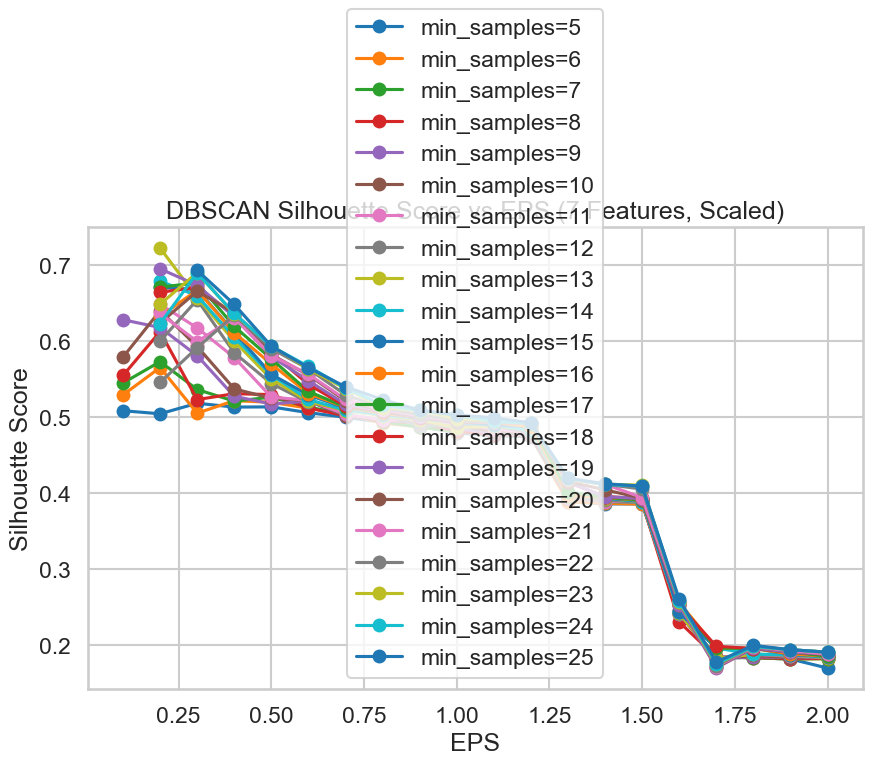

In [324]:
# =========================================================
# BLOCK 2 - DBSCAN SILHOUETTE VS EPS PLOT (7 FEATURES, SCALED)
# One line for each min_samples value
# =========================================================

import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))

for m in sorted(dbscan_results_7_df["MinSamples"].unique()):
    
    subset_7 = dbscan_results_7_df[
        (dbscan_results_7_df["MinSamples"] == m) &
        (dbscan_results_7_df["Silhouette"].notna())
    ].sort_values("EPS")
    
    if subset_7.empty:
        continue

    plt.plot(
        subset_7["EPS"],
        subset_7["Silhouette"],
        marker='o',
        label=f"min_samples={m}"
    )

plt.xlabel("EPS")
plt.ylabel("Silhouette Score")
plt.title("DBSCAN Silhouette Score vs EPS (7 Features, Scaled)")
plt.legend()
plt.grid(True)
plt.show()

In [325]:
# =========================================================
# BLOCK 3 - OPTIONAL FILTER FOR SPECIFIC NUMBER OF CLUSTERS
# Example: show only runs that produced exactly 3 clusters
# =========================================================

dbscan_7_3clusters = dbscan_results_7_df[dbscan_results_7_df["Clusters"] == 3]
display(dbscan_7_3clusters.sort_values("Silhouette", ascending=False))

,EPS,MinSamples,Clusters,NoisePoints,Silhouette


In [339]:
# =========================================================
# BLOCK 4 - FINAL DBSCAN MODEL (7 FEATURES, SCALED)
# Selected configuration: EPS=1.8, MinSamples=25
# =========================================================

from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score
import numpy as np

dbscan_final_7 = DBSCAN(
    eps=1.8,
    min_samples=25
)

labels_final_7 = dbscan_final_7.fit_predict(X_all_scaled)
df["DBSCAN_cluster_7features"] = labels_final_7

# Number of clusters excluding noise
n_clusters_final_7 = len(set(labels_final_7)) - (1 if -1 in labels_final_7 else 0)

# Number of noise points
n_noise_final_7 = np.sum(labels_final_7 == -1)

# Compute silhouette after excluding noise
mask_final_7 = labels_final_7 != -1

print("Selected parameters: EPS = 1.8, MinSamples = 25")
print("Number of clusters (7 features):", n_clusters_final_7)
print("Number of noise points:", n_noise_final_7)

if n_clusters_final_7 > 1 and len(set(labels_final_7[mask_final_7])) > 1:
    silhouette_final_7 = silhouette_score(
        X_all_scaled[mask_final_7],
        labels_final_7[mask_final_7]
    )
    print("Silhouette Score (7 features):", round(silhouette_final_7, 4))
else:
    print("Silhouette cannot be computed (not enough valid clustered points).")

print("\nCluster counts (including noise if present):")
print(df["DBSCAN_cluster_7features"].value_counts().sort_index())

Selected parameters: EPS = 1.8, MinSamples = 25
Number of clusters (7 features): 4
Number of noise points: 70
Silhouette Score (7 features): 0.1998

Cluster counts (including noise if present):
DBSCAN_cluster_7features
-1     70
 0    812
 1    706
 2    237
 3    175
Name: count, dtype: int64


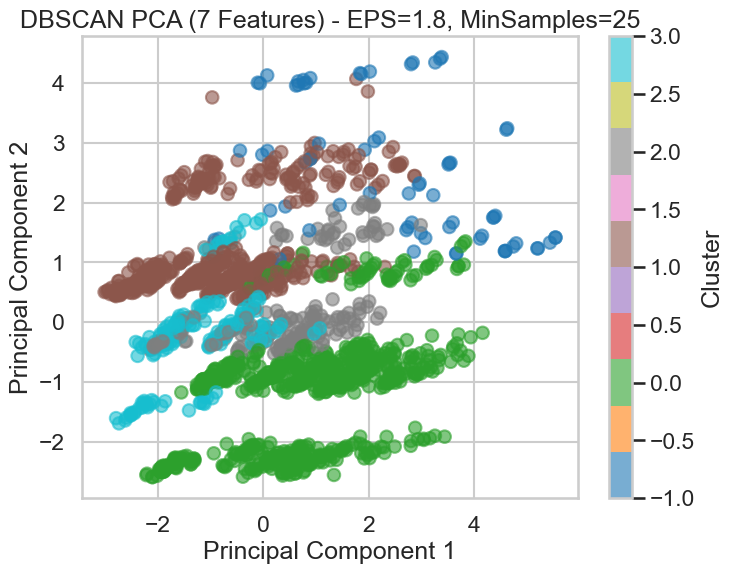

In [340]:
# =========================================================
# BLOCK 5A - PCA VISUALIZATION (EPS=1.8, MinSamples=25)
# =========================================================

from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# PCA projection
pca_7 = PCA(n_components=2)
X_pca_7 = pca_7.fit_transform(X_all_scaled)

plt.figure(figsize=(8,6))

scatter = plt.scatter(
    X_pca_7[:, 0],
    X_pca_7[:, 1],
    c=df["DBSCAN_cluster_7features"],
    cmap='tab10',
    alpha=0.6
)

plt.title("DBSCAN PCA (7 Features) - EPS=1.8, MinSamples=25")
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")

plt.colorbar(scatter, label="Cluster")
plt.show()

In [341]:
# =========================================================
# BLOCK 4 - FINAL DBSCAN MODEL (7 FEATURES, SCALED)
# Selected configuration: EPS=1.6, MinSamples=16
# =========================================================

from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score
import numpy as np

dbscan_final_7 = DBSCAN(
    eps=1.6,
    min_samples=16
)

labels_final_7 = dbscan_final_7.fit_predict(X_all_scaled)
df["DBSCAN_cluster_7features"] = labels_final_7

# Number of clusters excluding noise
n_clusters_final_7 = len(set(labels_final_7)) - (1 if -1 in labels_final_7 else 0)

# Number of noise points
n_noise_final_7 = np.sum(labels_final_7 == -1)

# Compute silhouette after excluding noise
mask_final_7 = labels_final_7 != -1

print("Selected parameters: EPS = 1.6, MinSamples = 16")
print("Number of clusters (7 features):", n_clusters_final_7)
print("Number of noise points:", n_noise_final_7)

if n_clusters_final_7 > 1 and len(set(labels_final_7[mask_final_7])) > 1:
    silhouette_final_7 = silhouette_score(
        X_all_scaled[mask_final_7],
        labels_final_7[mask_final_7]
    )
    print("Silhouette Score (7 features):", round(silhouette_final_7, 4))
else:
    print("Silhouette cannot be computed (not enough valid clustered points).")

print("\nCluster counts (including noise if present):")
print(df["DBSCAN_cluster_7features"].value_counts().sort_index())

Selected parameters: EPS = 1.6, MinSamples = 16
Number of clusters (7 features): 9
Number of noise points: 109
Silhouette Score (7 features): 0.2562

Cluster counts (including noise if present):
DBSCAN_cluster_7features
-1    109
 0     55
 1    567
 2    493
 3    254
 4    194
 5    134
 6     36
 7    128
 8     30
Name: count, dtype: int64


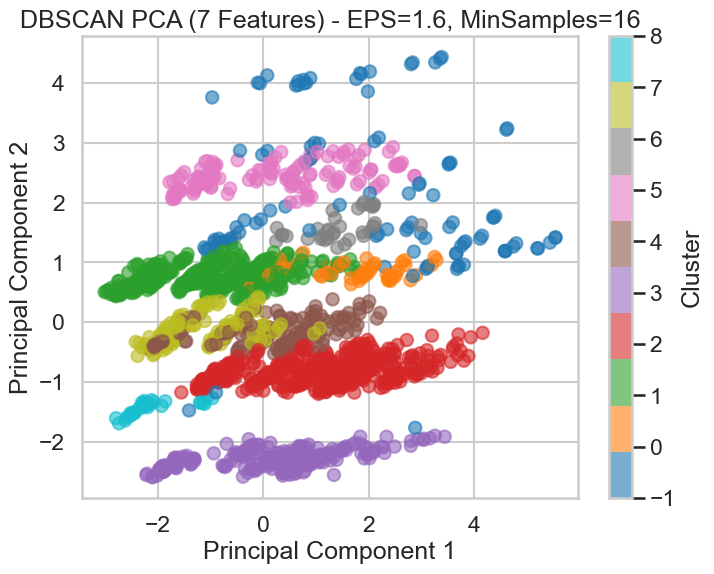

In [342]:
# =========================================================
# BLOCK 5B - PCA VISUALIZATION (EPS=1.6, MinSamples=16)
# =========================================================

from sklearn.cluster import DBSCAN
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# Recompute DBSCAN with second configuration
dbscan_alt = DBSCAN(
    eps=1.6,
    min_samples=16
)

labels_alt = dbscan_alt.fit_predict(X_all_scaled)

# PCA projection (same data, reuse or recompute)
pca_7 = PCA(n_components=2)
X_pca_7 = pca_7.fit_transform(X_all_scaled)

plt.figure(figsize=(8,6))

scatter = plt.scatter(
    X_pca_7[:, 0],
    X_pca_7[:, 1],
    c=labels_alt,
    cmap='tab10',
    alpha=0.6
)

plt.title("DBSCAN PCA (7 Features) - EPS=1.6, MinSamples=16")
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")

plt.colorbar(scatter, label="Cluster")
plt.show()

In [343]:
# =========================================================
# BLOCK 6 - DBSCAN PARAMETER SEARCH (2 FEATURES: Age & Income, SCALED)
# Silhouette is computed AFTER excluding noise points
# =========================================================

from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score
import numpy as np
import pandas as pd

eps_values_2 = np.arange(0.1, 3.1, 0.1)
min_samples_values_2 = range(5, 26)

dbscan_results_2 = []

for eps in eps_values_2:
    for min_samples in min_samples_values_2:

        model_2 = DBSCAN(
            eps=eps,
            min_samples=min_samples
        )

        labels_2 = model_2.fit_predict(X_hier_2_scaled)

        # Number of clusters excluding noise
        n_clusters_2 = len(set(labels_2)) - (1 if -1 in labels_2 else 0)

        # Number of noise points
        n_noise_2 = list(labels_2).count(-1)

        # Compute silhouette only on non-noise points
        mask_2 = labels_2 != -1

        if n_clusters_2 > 1 and np.sum(mask_2) > 1:
            score_2 = silhouette_score(X_hier_2_scaled[mask_2], labels_2[mask_2])
        else:
            score_2 = np.nan

        dbscan_results_2.append({
            "EPS": eps,
            "MinSamples": min_samples,
            "Clusters": n_clusters_2,
            "NoisePoints": n_noise_2,
            "Silhouette": score_2
        })

dbscan_results_2_df = pd.DataFrame(dbscan_results_2)
dbscan_results_2_df = dbscan_results_2_df.sort_values(
    by="Silhouette",
    ascending=False
).reset_index(drop=True)

display(dbscan_results_2_df.head(20))

,EPS,MinSamples,Clusters,NoisePoints,Silhouette
0,0.8,12,2,6,0.638488
1,0.8,11,2,3,0.635768
2,0.8,5,2,1,0.634075
3,0.8,6,2,1,0.634075
4,0.8,7,2,1,0.634075
5,0.8,8,2,1,0.634075
6,0.8,9,2,1,0.634075
7,0.8,10,2,1,0.634075
8,0.9,12,2,1,0.634075
9,0.9,5,2,1,0.634075


In [344]:
# =========================================================
# REMOVE ROWS WHERE CLUSTERS = 2
# =========================================================

dbscan_results_2_df_filtered = dbscan_results_2_df[
    dbscan_results_2_df["Clusters"] != 2
].copy()

# Optional: reset index for clean display
dbscan_results_2_df_filtered = dbscan_results_2_df_filtered.reset_index(drop=True)

display(dbscan_results_2_df_filtered.head(20))

,EPS,MinSamples,Clusters,NoisePoints,Silhouette
0,0.6,9,3,7,0.566732
1,0.6,8,3,5,0.566465
2,0.6,6,3,4,0.566184
3,0.6,7,3,4,0.566184
4,0.5,7,4,20,0.540797
5,0.5,6,4,20,0.540797
6,0.1,25,4,1646,0.496405
7,0.1,24,6,1553,0.475076
8,0.1,23,6,1523,0.462081
9,0.2,8,3,186,0.433214


In [ ]:
# =========================================================
# BLOCK 10 - FINAL DBSCAN MODEL (2 FEATURES: Age & Income, SCALED)
# Selected configuration: EPS=0.6, MinSamples=9
# =========================================================

from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score
import numpy as np

dbscan_final_2 = DBSCAN(
    eps=0.6,
    min_samples=9
)

labels_final_2 = dbscan_final_2.fit_predict(X_hier_2_scaled)
df["DBSCAN_cluster_2features"] = labels_final_2

# Number of clusters excluding noise
n_clusters_final_2 = len(set(labels_final_2)) - (1 if -1 in labels_final_2 else 0)

# Number of noise points
n_noise_final_2 = np.sum(labels_final_2 == -1)

# Compute silhouette AFTER removing noise
mask_final_2 = labels_final_2 != -1

print("Selected parameters: EPS = 0.6, MinSamples = 9")
print("Number of clusters (2 features):", n_clusters_final_2)
print("Number of noise points:", n_noise_final_2)

if n_clusters_final_2 > 1 and len(set(labels_final_2[mask_final_2])) > 1:
    silhouette_final_2 = silhouette_score(
        X_hier_2_scaled[mask_final_2],
        labels_final_2[mask_final_2]
    )
    print("Silhouette Score (2 features):", round(silhouette_final_2, 4))
else:
    print("Silhouette cannot be computed.")

print("\nCluster counts (including noise):")
print(df["DBSCAN_cluster_2features"].value_counts().sort_index())

Selected parameters: EPS = 0.6, MinSamples = 9
Number of clusters (2 features): 3
Number of noise points: 7
Silhouette Score (2 features): 0.5667

Cluster counts (including noise):
DBSCAN_cluster_2features
-1       7
 0    1975
 1      10
 2       8
Name: count, dtype: int64


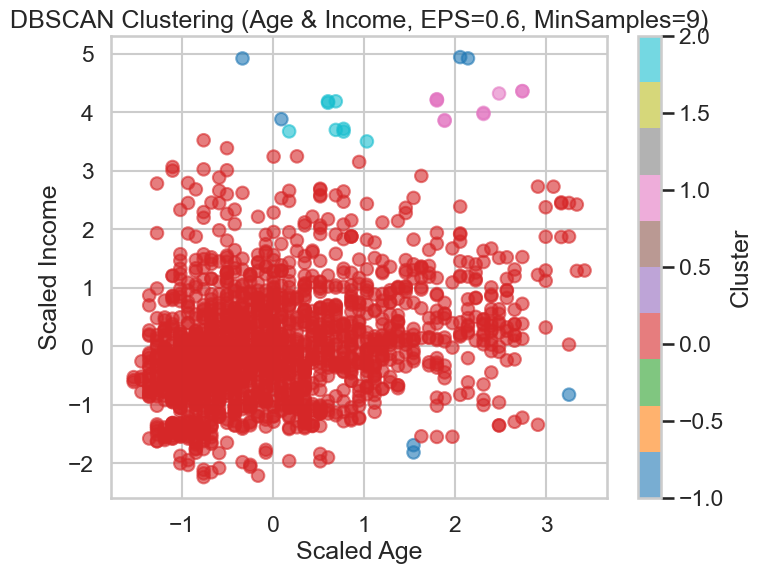

In [346]:
# =========================================================
# BLOCK 11 - VISUALIZATION (2 FEATURES DBSCAN)
# =========================================================

import matplotlib.pyplot as plt

plt.figure(figsize=(8,6))

scatter = plt.scatter(
    X_hier_2_scaled[:, 0],
    X_hier_2_scaled[:, 1],
    c=df["DBSCAN_cluster_2features"],
    cmap='tab10',
    alpha=0.6
)

plt.title("DBSCAN Clustering (Age & Income, EPS=0.6, MinSamples=9)")
plt.xlabel("Scaled Age")
plt.ylabel("Scaled Income")

plt.colorbar(scatter, label="Cluster")
plt.show()

## Clustering Techniques Comparison — Customer Dataset

### 1) K-Means (Best Overall)
- **2 features (Age, Income):** silhouette ≈ 0.44  
- **7 features:** silhouette ≈ 0.27  

**Why:**
- Produces **balanced and interpretable clusters**
- Stable across runs
- Best practical segmentation for customers  

---

### 2) Agglomerative Clustering
- **2 features:** silhouette ≈ 0.54  
- **7 features:** silhouette ≈ 0.26  

**Why not best:**
- Creates **highly imbalanced clusters** (one large cluster dominates)
- Less meaningful segmentation despite higher score  

---

### 3) DBSCAN (Weakest Overall)
- **2 features:** silhouette ≈ 0.57, low noise  
- **7 features:** silhouette ≈ 0.20, more noise  

**Why not best:**
- Very **sensitive to parameters**
- Often produces **noise or fragmented clusters**
- Weak performance on full dataset  

---

## Final Conclusion
**K-Means is the best choice**, especially on **Age + Income**, as it provides the most **balanced, stable, and interpretable clustering**.